In [1]:
# Test cell to check current notebook state
import sys
print("Testing notebook state...")
print(f"Python version: {sys.version}")

# Check current working directory
import os
print(f"Current directory: {os.getcwd()}")

Testing notebook state...
Python version: 3.11.13 (main, Jun  5 2025, 13:12:00) [GCC 11.2.0]
Current directory: /home/bmartins/dev/quantum_portfolio/src/qubo_unrestricted


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import time
import logging
import os
import warnings
import itertools
from datetime import datetime, timedelta
from functools import partial
from pathlib import Path
from optimization_engines import (
    equal_weights_baseline, 
    genetic_algorithm_qubo, 
    scipy_slsqp_qubo, 
    riskfolio_qubo, 
)

SEED = 12
np.random.seed(SEED)
msg_level = logging.INFO
# Suppress all RuntimeWarnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

## QUBO Portfolio Optimization using multiple engines

In [3]:
# Create a logger
logger = logging.getLogger("inspect_results_logger")
logger.setLevel(msg_level)  # Set the level for this logger

# # Create a handler (where to send the logs)
# handler = logging.StreamHandler()  # Send to the console
# handler.setLevel(msg_level)

# # Create a formatter (how to format the logs)
# formatter = logging.Formatter("%(asctime)s - %(name)s - %(levelname)s - %(message)s")
# handler.setFormatter(formatter)

# # Add the handler to the logger
# logger.addHandler(handler)

### Path definition

In [4]:
benchmark_path = '../../data/benchmark_gspc.pkl'
source_path = '../../data/stocks_adjclose.pkl'

### Data loading

Ticker,ds,^GSPC
0,2011-01-03,1271.869995
1,2011-01-04,1270.199951
2,2011-01-05,1276.560059
3,2011-01-06,1273.849976
4,2011-01-07,1271.500000


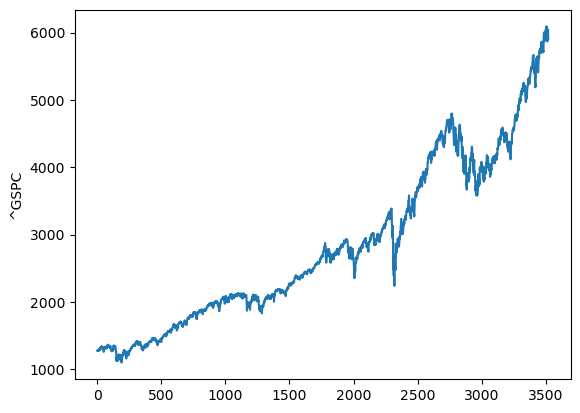

In [5]:
benchmark = pd.read_pickle(benchmark_path)
sns.lineplot(benchmark['^GSPC'])
benchmark.head()

In [6]:
source = pd.read_pickle(source_path)
print(source.shape)
# Check if any row contains at least one NaN
#print(source_wide.isnull().any(axis=1))
# Check if any value in the DataFrame is null
has_any_nan = source.isnull().values.any()
print("Any NaN in source_wide:", has_any_nan)
source.head()

(3522, 439)
Any NaN in source_wide: False


Ticker,A,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,ADSK,...,WRB,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
ds,,,,,,,,,,,,,,,,,,,,,
2011-01-03,26.781836,9.917951,16.942663,9.349445,37.585785,31.290001,27.436106,20.712511,29.848969,39.270000,...,6.112024,18.971697,71.104691,11.828708,76.192101,14.700940,43.098133,26.977388,47.841393,38.200001
2011-01-04,26.532440,9.969709,17.102097,9.291334,37.338249,31.510000,27.125227,20.698887,29.741137,38.529999,...,6.072278,18.631702,69.911537,11.702991,78.568939,14.763333,43.300457,26.565216,47.206047,37.840000
2011-01-05,26.474880,10.051261,17.102097,9.305071,37.346004,32.220001,27.183071,20.794275,30.216925,41.240002,...,6.045782,18.713308,70.882263,12.068158,79.582596,14.675976,43.184826,26.691620,47.240875,37.799999
2011-01-06,26.526041,10.043136,17.066668,9.179339,37.485237,32.270000,27.334898,21.591436,30.451658,41.259998,...,5.977333,18.577297,71.084503,11.984348,80.162842,14.663502,43.462337,26.878460,45.778728,37.480000
2011-01-07,26.615564,10.115060,17.137522,9.109608,37.547104,32.040001,27.175838,21.768579,30.521458,40.759998,...,5.939793,18.486635,70.963158,12.313586,83.001091,14.794533,43.699345,27.213682,45.770027,37.599998


### Correlation Analysis

* Determine a set of stocks with minimal correlation

In [7]:
df_corr = source.corr()
df_corr.head()

Ticker,A,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,ADSK,...,WRB,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
Ticker,,,,,,,,,,,,,,,,,,,,,
A,1.000000,0.938434,0.972057,0.803930,0.973666,0.944446,0.958391,0.877209,0.950709,0.946486,...,0.915526,0.962450,0.952409,0.840455,-0.192150,0.925082,0.581125,0.957106,0.742547,0.926361
AAPL,0.938434,1.000000,0.925958,0.904199,0.965640,0.912658,0.974905,0.858673,0.957237,0.883810,...,0.954041,0.944027,0.944347,0.799052,-0.274004,0.864298,0.709763,0.932155,0.609996,0.834967
ABT,0.972057,0.925958,1.000000,0.780764,0.974008,0.966874,0.947089,0.840192,0.947416,0.967112,...,0.905557,0.957242,0.959083,0.826124,-0.199613,0.959269,0.502779,0.961910,0.787986,0.938066
ACGL,0.803930,0.904199,0.780764,1.000000,0.859009,0.772929,0.921957,0.746998,0.908116,0.731481,...,0.943648,0.783657,0.889515,0.726342,-0.175307,0.746701,0.854873,0.878777,0.539229,0.617688
ACN,0.973666,0.965640,0.974008,0.859009,1.000000,0.962718,0.975225,0.861665,0.975261,0.940212,...,0.947315,0.970085,0.967641,0.856489,-0.227554,0.926912,0.623003,0.971591,0.727454,0.899654


#### Rank correlation ascending

In [8]:
# rank by correlation
corr_sum = df_corr.map(lambda x: abs(x)).sum()
corr_rank = corr_sum.sort_values().rank(method='min').astype(int)
corr_rank

Ticker
TPR       1
BKR       2
GE        3
WYNN      4
DVN       5
       ... 
TXN     435
TEL     436
ITW     437
ICE     438
HD      439
Length: 439, dtype: int64

#### Rank returns descending

In [9]:
# rank by returns
return_rank = source.diff().sum(axis=0).sort_values().rank(method='min', ascending=False).astype(int)
return_rank

Ticker
APA     439
MOS     438
SLB     437
DVN     436
PCG     435
       ... 
TDG       5
FICO      4
AZO       3
BKNG      2
NVR       1
Length: 439, dtype: int64

#### Select sets of 10 and 100 stocks with maximal returns and minimal correlation

In [10]:
select_10 = (return_rank + corr_rank).sort_values().reset_index()['Ticker'].values[:11]
select_10

array(['FICO', 'LLY', 'MCK', 'CHTR', 'GWW', 'AXON', 'REGN', 'RCL', 'RL',
       'TSLA', 'TPL'], dtype=object)

In [11]:
select_100 = (return_rank + corr_rank).sort_values().reset_index()['Ticker'].values[:101]
select_100

array(['FICO', 'LLY', 'MCK', 'CHTR', 'GWW', 'AXON', 'REGN', 'RCL', 'RL',
       'TSLA', 'TPL', 'MKTX', 'PWR', 'URI', 'TRGP', 'ZBRA', 'KLAC',
       'NFLX', 'ALGN', 'HUBB', 'AVGO', 'IBM', 'GE', 'BA', 'SPG', 'PH',
       'GNRC', 'ETN', 'BKNG', 'LULU', 'ERIE', 'DECK', 'AZO', 'WAB',
       'EXPE', 'CPAY', 'TDG', 'NVDA', 'BIIB', 'ULTA', 'TFX', 'SNPS',
       'MPWR', 'PODD', 'FDX', 'COST', 'LII', 'VRTX', 'TT', 'BLDR', 'MMM',
       'HUM', 'IT', 'CAT', 'ORLY', 'CAH', 'UAL', 'AMP', 'SBAC', 'UHS',
       'ESS', 'MHK', 'MTB', 'CDNS', 'GILD', 'EOG', 'WST', 'CRL', 'ADBE',
       'COR', 'GPN', 'GS', 'MSI', 'DIS', 'FFIV', 'JBL', 'IDXX', 'DE',
       'CLX', 'PGR', 'AJG', 'KKR', 'FRT', 'ADSK', 'DVA', 'VRSN', 'ANSS',
       'HES', 'XOM', 'CVX', 'MSCI', 'IRM', 'POOL', 'ISRG', 'INCY', 'TTWO',
       'NVR', 'COP', 'LIN', 'BDX', 'FIS'], dtype=object)

Defining Fitness Function for the calculation of Sharpe Ratio. I am using the Portfolio Variance as 

Portfolio variance = w12σ12 + w22σ22 + 2w1w2Cov1,2

### Porfolio Stats

In [12]:
def portfolio_stats(weights, data):
    logger.info("=== portfolio_stats START ===")
    logger.info(f"Input weights shape: {np.array(weights).shape}")
    logger.info(f"Input data shape: {data.shape}")
    
    weights = np.array(weights)
    logger.info("Calculating log returns...")
    returns = np.log(data) - np.log(data.shift(1)) # log return to minimize fp error
    logger.info(f"Log returns calculated, shape: {returns.shape}")
    
    # CONSISTENT: Always use log returns, never pct_change()
    logger.info("Calculating portfolio return...")
    port_return = np.sum(returns.mean() * weights) 
    logger.info(f"Portfolio return: {port_return}")
    
    logger.info("Calculating portfolio volatility...")
    port_vol = np.sqrt(np.dot(weights.T, np.dot(returns.cov() , weights)))
    logger.info(f"Portfolio volatility: {port_vol}")
    
    try:
        sharpe_ratio = port_return/port_vol
        logger.info(f"Sharpe ratio: {sharpe_ratio}")
    except Exception as e:
        logger.warning(f"Sharpe ratio calculation failed: {e}")
        sharpe_ratio = 0
    
    logger.info("=== portfolio_stats END ===")
    return sharpe_ratio, port_return, port_vol

### Fitness function

In [13]:
def fitness_function(weights, data):
    sharpe_ratio, _, _ = portfolio_stats(weights, data)
    return sharpe_ratio


In [14]:
def curried_fitness(weights, data):
    port_return = partial(fitness_function, data)
    return port_return

def minimize_sharpe(weights):
    return -1 * curried_fitness(weights)

### Data generator

Data generator to instantiate blocks on demand

In [15]:
def generate_data(df, benchmark, days_to_avg=30, days_to_opt=30, seed=SEED):
    df2 = df.reset_index()
    benchmark2 = benchmark.reset_index()
    elements = df2.sample(n=100, random_state=seed).index # definint a maximum of 100 different sampled initial dates
    for idx in elements:
        df_sample = df2.iloc[idx-days_to_avg:idx+days_to_opt, :]
        df_sample = df_sample.set_index('ds')
        df_sample_b = benchmark2.iloc[idx-days_to_avg:idx+days_to_opt, :]
        df_sample_b = df_sample_b.set_index('ds').drop(['index'], axis=1)
        yield df_sample, df_sample_b

### Backtest

In [16]:
def backtest(optimization_function, data, benchmark, budget, avg_period, opt_period):
    logger.info("="*80)
    logger.info("=== BACKTEST START ===")
    logger.info(f"Data shape: {data.shape}, Benchmark shape: {benchmark.shape}")
    logger.info(f"Initial capital: {budget}, Avg period: {avg_period}, Opt period: {opt_period}")
    
    portfolio_value = budget
    portfolio_returns = []
    benchmark_returns = []
    portfolio_total_return = []
    portfolio_sharpe_ratios = []
    weights_history = pd.DataFrame(index=data.index, columns=data.columns)
    portfolio_value_history = pd.Series(index=data.index, name='Portfolio Value', dtype='float')
    portfolio_value_history.iloc[0] = portfolio_value

    logger.info(f"Starting backtest loop for {opt_period} iterations...")
    j = 0
    for i in range(avg_period+1, avg_period + opt_period+1):
        logger.info(f"\n--- Iteration {i-avg_period}/{opt_period} (j={j}, i={i}) ---")
        
        df = data.iloc[j:i, :]
        logger.info(f"Data slice shape: {df.shape}, Date range: {df.index[0]} to {df.index[-1]}")
        
        # Use log returns for consistency with optimization functions
        logger.info("Calculating log returns for slice...")
        df_log_returns = np.log(df) - np.log(df.shift(1))
        df_log_returns = df_log_returns.dropna(axis=0)
        logger.info(f"Log returns shape after dropna: {df_log_returns.shape}")
        
        #logger.debug(f'df_log_returns: {df_log_returns}')
        weights = optimization_function(df)
        logger.info(f"Optimization completed. Weights shape: {weights.shape}, Sum: {weights.sum():.6f}")
        logger.info(f"Weights min: {weights.min():.6f}, max: {weights.max():.6f}, non-zero count: {(weights > 0).sum()}")
        
        weights[weights < 0] = 0
        weights /= weights.sum()
        logger.info(f"Weights after normalization - Sum: {weights.sum():.6f}")
        
        # Print weight statistics
        print(f"\nTime step {i-avg_period}/{opt_period} - Weight Statistics:")
        print(f"  Min weight:     {weights.min():.6f}")
        print(f"  Max weight:     {weights.max():.6f}")
        print(f"  Average weight: {weights.mean():.6f}")
        print(f"  Non-zero count: {(weights > 0).sum()}/{len(weights)}")
        
        weights_history.loc[df.index[-1]] = weights
        #sharpe_ratio, portfolio_return, portfolio_volatility = portfolio_stats(weights, df)
        # portfolio_change = df.iloc[-2:, :].pct_change() * weights
        logger.info("Calculating portfolio change...")
        portfolio_change = df_log_returns.iloc[-1] * weights
        #portfolio_return = portfolio_change.sum(axis=1).iloc[-1]
        portfolio_return = portfolio_change.sum()
        logger.info(f"Portfolio return for this period: {portfolio_return:.6f}")
        
        portfolio_returns.append(portfolio_return)
        # print(f'portfolio returns: {portfolio_returns}')
        # Use log returns for benchmark as well
        logger.info("Calculating benchmark returns...")
        benchmark_log_returns = np.log(benchmark.iloc[j:i, :]) - np.log(benchmark.iloc[j:i, :].shift(1))
        benchmark_return = benchmark_log_returns.iloc[-1].values.tolist()[0]
        logger.info(f"Benchmark return for this period: {benchmark_return:.6f}")
        
        benchmark_returns.append(benchmark_return)
        # print(f'benchmark_returns: {benchmark_returns}')
        logger.info("Calculating cumulative returns...")
        portfolio_cumulative_returns = np.cumprod([k + 1 for k in portfolio_returns])
        # print(f'portfolio cumulative returns: {portfolio_cumulative_returns}')
        benchmark_cumulative_returns = np.cumprod([k + 1 for k in  benchmark_returns])
        # print(f'benchmark cumulative returns: {benchmark_cumulative_returns}')
        portfolio_mean_return = np.mean(portfolio_returns)
        benchmark_mean_return = np.mean(benchmark_returns)
        portfolio_volatility = np.std(portfolio_returns) 
        benchmark_volatility = np.std(benchmark_returns)
        logger.info(f"Portfolio mean return: {portfolio_mean_return:.6f}, volatility: {portfolio_volatility:.6f}")
        logger.info(f"Benchmark mean return: {benchmark_mean_return:.6f}, volatility: {benchmark_volatility:.6f}")
        
        try:
            sharpe_ratio = (portfolio_mean_return) / portfolio_volatility
            logger.info(f"Sharpe ratio: {sharpe_ratio:.6f}")
        except Exception as e:
            logger.warning(f"Sharpe ratio calculation failed: {e}")
            sharpe_ratio = 0
        portfolio_sharpe_ratios.append(sharpe_ratio)

         # Portfolio & Benchmark value
        benchmark_value = budget * benchmark_cumulative_returns[-1]
        portfolio_value = budget * portfolio_cumulative_returns[-1]
        logger.info(f"Portfolio value: ${portfolio_value:,.2f}, Benchmark value: ${benchmark_value:,.2f}")
        j += 1

    logger.info("\nCalculating final cumulative returns...")
    portfolio_cumulative_returns = portfolio_cumulative_returns - portfolio_cumulative_returns[0]
    benchmark_cumulative_returns = benchmark_cumulative_returns - benchmark_cumulative_returns[0]
    logger.info(f"Final portfolio cumulative return: {portfolio_cumulative_returns[-1]:.6f}")
    logger.info(f"Final benchmark cumulative return: {benchmark_cumulative_returns[-1]:.6f}")

    # Plot the results
    logger.info("Creating plot...")
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_cumulative_returns, label='Portfolio')
    plt.plot(benchmark_cumulative_returns, label='Benchmark')
    #plt.plot(portfolio_returns, label='Portfolio')
    #plt.plot(benchmark_returns, label='Benchmark')
    plt.legend(loc='upper left')
    plt.title('Backtesting Results')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.show()

    logger.info("=== BACKTEST END ===")
    logger.info("="*80)
    return weights_history, portfolio_value_history, portfolio_cumulative_returns, benchmark_cumulative_returns

In [17]:
import pickle

def write_pickle_dict(data, file_path):
    """Pickles a dictionary and saves it to a file."""
    try:
        with open(file_path, 'wb') as f:  # Open the file in binary write mode ('wb')
            pickle.dump(data, f)
        print(f"Dictionary pickled and saved to {file_path}")
    except Exception as e:
        print(f"An error occurred while pickling: {e}")

def read_pickle_dict(file_path):
    try:
        with open(file_path, 'rb') as f:
            loaded_dict = pickle.load(f)
    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except Exception as e:
        print(f"An error occurred: {e}")
    return loaded_dict



### Run Experiment Function

In [18]:
def run_experiment(results_path_template, data, benchmark, opt_fun, parameters):
    logger.info("\n" + "#"*100)
    logger.info("### RUN EXPERIMENT START ###")
    logger.info("#"*100)
    logger.info(f"Results path template: {results_path_template}")
    logger.info(f"Data shape: {data.shape}")
    logger.info(f"Benchmark shape: {benchmark.shape}")
    logger.info(f"Parameters: {parameters}")

    n_periods = parameters['n_periods']
    days_to_avg = parameters['days_to_avg']
    days_to_opt = parameters['days_to_opt']
    population_size = parameters['population_size']
    num_generations = parameters['num_generations']
    budget = parameters['budget']
    
    logger.info(f"Creating data generator with n_periods={n_periods}...")
    datagen = generate_data(data, benchmark)

        
    for i in range(n_periods):
        logger.info(f"\n{'='*80}")
        logger.info(f"PERIOD {i+1}/{n_periods}")
        logger.info(f"{'='*80}")
        
        results_path = results_path_template.format(i)
        logger.info(f"Results path: {results_path}")
        
        if not os.path.exists(results_path):
            logger.info(f"Results file does not exist, running optimization...")
            try:
                logger.info("Getting next data sample from generator...")
                df, df_b = next(datagen)
                logger.info(f"Data sample retrieved - df shape: {df.shape}, benchmark shape: {df_b.shape}")
                print(f'initial date: {df.iloc[days_to_avg+1:, :].index[0]}')
                
                logger.info("Creating source data plot...")
                plt.figure(figsize=(12, 6))
                plt.plot(df.iloc[days_to_avg+1:days_to_avg+days_to_opt+1, :].sum(axis=1), label='Source')
                plt.plot(df_b, label='Benchmark')
                plt.legend(loc='upper left')
                plt.title('Source Data')
                plt.xlabel('Date')
                plt.ylabel('Stock Values')
                plt.show()
                
                logger.info(f"Starting backtest at {datetime.now()}")
                start_time = datetime.now()
                
                weights_history, portfolio_value_history, portfolio_cumulative_returns, benchmark_cumulative_returns = backtest(opt_fun, df, df_b, budget=budget, avg_period=days_to_avg,opt_period=days_to_opt)
                
                end_time = datetime.now()
                dt = abs(end_time - start_time)
                logger.info(f'Backtest completed at {end_time}')
                logger.info(f'Total backtest time: {dt.total_seconds():.2f} seconds')
                logger.debug(f'portfolio cumulative returns: {portfolio_cumulative_returns}')
                
            except Exception as e: 
                logger.error(f'FAILED {results_path} due to {e}', exc_info=True)
                print(f'Failed {results_path} due to {e}')
                weights_history, portfolio_value_history, portfolio_cumulative_returns, benchmark_cumulative_returns = [], [], [], []
                dt = timedelta(0)

            logger.info("Saving results to pickle file...")
            result = {
                "round": i, 
                "start_date": df.index[0],
                "end_date": df.index[-1],
                "population_size": population_size,
                "num_generations": num_generations,
                "days_to_avg": days_to_avg,
                "days_to_opt": days_to_opt,
                "weights_history": weights_history,
                "portfolio_value_history": portfolio_value_history,
                "portfolio_cumulative_returns": portfolio_cumulative_returns,
                "benchmark_cumulative_returns": benchmark_cumulative_returns,
                "total_run_time": dt.total_seconds()
                }
            write_pickle_dict(result, results_path)
            logger.info(f"Results saved successfully to {results_path}")

        else:
            logger.info(f"Results file already exists, loading from {results_path}...")
            results = read_pickle_dict(results_path)
            portfolio_cumulative_returns = results['portfolio_cumulative_returns']
            benchmark_cumulative_returns = results['benchmark_cumulative_returns']
            weights_history = results.get('weights_history', None)
            logger.info(f"Results loaded - portfolio return: {portfolio_cumulative_returns[-1] if len(portfolio_cumulative_returns) > 0 else 'N/A'}")

            # Plot weight histograms for each time step if weights_history is available
            if weights_history is not None and isinstance(weights_history, pd.DataFrame) and not weights_history.empty:
                logger.info("Plotting weight distributions from loaded data...")
                for idx, (date, weights_row) in enumerate(weights_history.dropna(how='all').iterrows(), 1):
                    weights = weights_row.values
                    weights = weights[~np.isnan(weights)]
                    
                    if len(weights) > 0:
                        print(f"\nTime step {idx}/{len(weights_history.dropna(how='all'))} - Weight Statistics:")
                        print(f"  Min weight:     {weights.min():.6f}")
                        print(f"  Max weight:     {weights.max():.6f}")
                        print(f"  Average weight: {weights.mean():.6f}")
                        print(f"  Non-zero count: {(weights > 0).sum()}/{len(weights)}")
                        
                        # Plot histogram of weight distribution
                        plt.figure(figsize=(10, 4))
                        plt.hist(weights[weights > 0], bins=50, edgecolor='black', alpha=0.7)
                        plt.xlabel('Weight')
                        plt.ylabel('Frequency')
                        plt.title(f'Weight Distribution - Time Step {idx}/{len(weights_history.dropna(how="all"))} (Date: {date})')
                        plt.grid(True, alpha=0.3)
                        plt.show()

            # Plot the results
            logger.info("Creating results plot...")
            plt.figure(figsize=(12, 6))
            plt.plot(portfolio_cumulative_returns, label='Portfolio')
            plt.plot(benchmark_cumulative_returns, label='Benchmark')
            plt.legend(loc='upper left')
            plt.title('Backtesting Results')
            plt.xlabel('Date')
            plt.ylabel('Cumulative Returns')
            plt.show()
    
    logger.info("\n" + "#"*100)
    logger.info("### RUN EXPERIMENT END ###")
    logger.info("#"*100 + "\n")
    return None

### Comparison functions

In [19]:
def multi_comparison(solver_configs, n_periods, title_prefix="Portfolio Optimization", show_benchmark=True):
    """
    Compare multiple portfolio optimization solvers across periods.
    
    Args:
        solver_configs (list): List of dictionaries with 'path_template' and 'name' keys
        n_periods (int): Number of periods to compare
        title_prefix (str): Prefix for plot titles
        show_benchmark (bool): Whether to show benchmark comparison
    """
    
    for period in range(n_periods):
        period_data = []
        benchmark_data = None
        
        # Load data for all solvers for this period
        for config in solver_configs:
            path_template = config['path_template']
            solver_name = config['name']
            file_path = path_template.format(period)
            
            try:
                result_data = read_pickle_dict(file_path)
                if result_data is not None:
                    portfolio_returns = result_data.get('portfolio_cumulative_returns', [])
                    benchmark_returns = result_data.get('benchmark_cumulative_returns', [])
                    start_date = result_data.get('start_date', 'Unknown')
                    execution_time = result_data.get('total_run_time', 0)
                    
                    # Check if portfolio_returns has data (handle NumPy arrays properly)
                    has_portfolio_data = False
                    if portfolio_returns is not None:
                        try:
                            has_portfolio_data = len(portfolio_returns) > 0
                        except TypeError:
                            # Handle case where portfolio_returns is not a sequence
                            has_portfolio_data = portfolio_returns is not None
                    
                    if has_portfolio_data:
                        period_data.append({
                            'name': solver_name,
                            'portfolio_returns': portfolio_returns,
                            'benchmark_returns': benchmark_returns,
                            'start_date': start_date,
                            'execution_time': execution_time,
                            'file_path': file_path
                        })
                        
                        # Store benchmark from first successful load
                        if benchmark_data is None and benchmark_returns is not None:
                            try:
                                if len(benchmark_returns) > 0:
                                    benchmark_data = benchmark_returns
                            except (TypeError, AttributeError):
                                pass
                        
                        logger.info(f'Period {period}: Loaded {solver_name} (exec_time: {execution_time:.2f}s)')
                    else:
                        logger.warning(f'Period {period}: {solver_name} has no portfolio returns data')
                else:
                    logger.warning(f'Period {period}: Could not load {solver_name} from {file_path}')
                    
            except Exception as e:
                logger.error(f'Period {period}: Error loading {solver_name} from {file_path}: {e}')
        
        # Plot results if we have any data
        if period_data:
            plt.figure(figsize=(15, 8))
            
            # Color palette for better distinction
            colors = plt.cm.Set1(np.linspace(0, 1, len(period_data)))
            
            # Plot portfolio returns for each solver
            for i, data in enumerate(period_data):
                plt.plot(data['portfolio_returns'], 
                        label=f"{data['name']} (t={data['execution_time']:.1f}s)", 
                        color=colors[i], 
                        linewidth=2, 
                        alpha=0.8)
            
            # Plot benchmark if available and requested
            if show_benchmark and benchmark_data is not None:
                plt.plot(benchmark_data, 
                        label='S&P 500 Benchmark', 
                        linestyle='--', 
                        color='black', 
                        linewidth=2, 
                        alpha=0.7)
            
            plt.title(f'{title_prefix} Comparison - Period {period}\\n'
                     f'Start Date: {period_data[0]["start_date"]} | Solvers: {len(period_data)}')
            plt.xlabel('Trading Days')
            plt.ylabel('Cumulative Returns')
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()
            
            # Print summary statistics
            print(f"\\nPeriod {period} Summary:")
            print("-" * 50)
            for data in period_data:
                try:
                    final_return = data['portfolio_returns'][-1] if len(data['portfolio_returns']) > 0 else 0
                except (IndexError, TypeError):
                    final_return = 0
                print(f"{data['name']:<25}: {final_return:>8.4f} ({data['execution_time']:>6.2f}s)")
            if benchmark_data is not None:
                try:
                    benchmark_final = benchmark_data[-1] if len(benchmark_data) > 0 else 0
                except (IndexError, TypeError):
                    benchmark_final = 0
                print(f"{'Benchmark':<25}: {benchmark_final:>8.4f}")
            print()
            
        else:
            logger.warning(f'No data available for any solver in period {period}')

def performance_summary(solver_configs, n_periods):
    """Generate performance summary across all periods for multiple solvers."""
    summary_data = []
    
    for config in solver_configs:
        solver_name = config['name']
        path_template = config['path_template']
        
        returns_data = []
        execution_times = []
        successful_periods = 0
        
        for period in range(n_periods):
            file_path = path_template.format(period)
            try:
                result_data = read_pickle_dict(file_path)
                if result_data is not None:
                    portfolio_returns = result_data.get('portfolio_cumulative_returns', [])
                    execution_time = result_data.get('total_run_time', 0)
                    
                    # Safe check for portfolio returns data
                    try:
                        if portfolio_returns is not None and len(portfolio_returns) > 0:
                            final_return = portfolio_returns[-1]
                            returns_data.append(final_return)
                            execution_times.append(execution_time)
                            successful_periods += 1
                    except (TypeError, IndexError):
                        pass
            except Exception as e:
                logger.debug(f'Could not process {file_path}: {e}')
        
        if returns_data:
            summary_data.append({
                'Solver': solver_name,
                'Periods': successful_periods,
                'Avg_Return': np.mean(returns_data),
                'Std_Return': np.std(returns_data),
                'Min_Return': np.min(returns_data),
                'Max_Return': np.max(returns_data),
                'Avg_Time': np.mean(execution_times),
                'Std_Time': np.std(execution_times),
                'Success_Rate': successful_periods / n_periods * 100
            })
    
    if summary_data:
        df = pd.DataFrame(summary_data)
        df = df.round(4)
        return df
    else:
        return pd.DataFrame()


### GA and Global Parameters

#### From Hyperparameter Optimization

* pop size: 100
* n gen: 100
* mut: 0.1
* elit: 0.5

<Axes: xlabel='ds'>

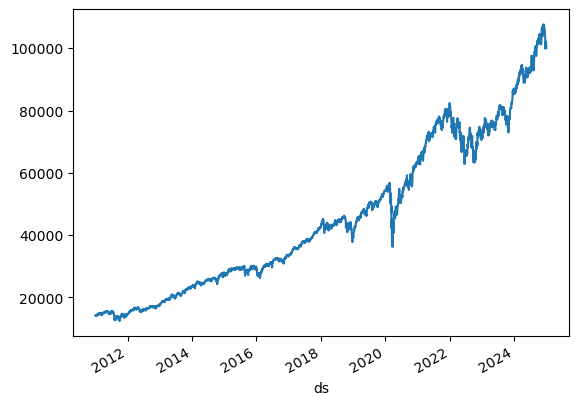

In [20]:
source.sum(axis=1).plot()

total sum if we consider a portfolio with one share per ticker then we get around $100,000 by 2024. We need to set budget to a higher value, 1,000,000 in this case.

In [21]:
parameters = {
    "population_size": 100,
    "num_generations": 100,
    "mutation_rate": 0.1,
    "elitism": 0.1,
    "n_periods": 10,
    "days_to_avg": 30,
    "days_to_opt": 30,
    "budget": 1_000_000,
}

### Easy Test: Optimization with 10 stocks

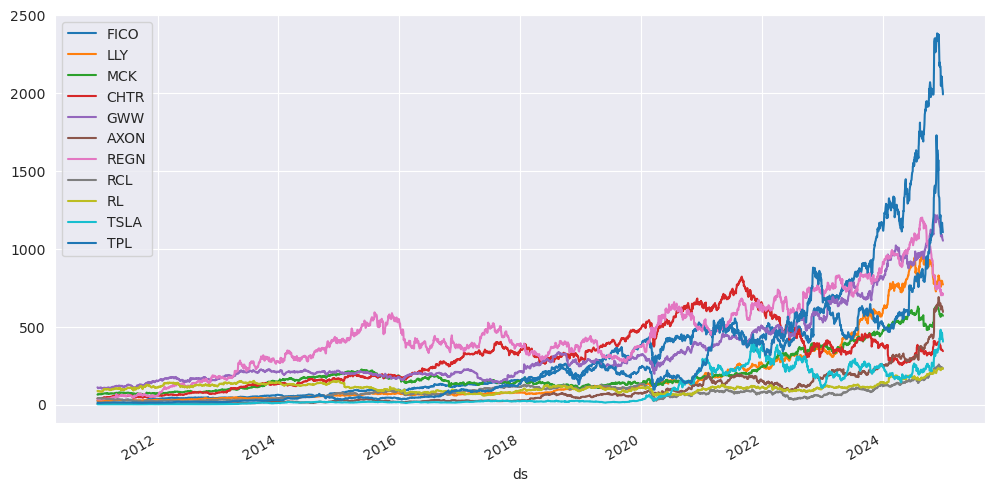

In [22]:
data_10 = source[select_10]
sns.set_style('darkgrid')
data_10.plot(figsize=(12,6))
plt.legend(loc='upper left')
plt.show()

In [23]:
df = data_10.copy()
days_to_avg = parameters['days_to_avg']
display(df.head())
print(f'initial date: {df.iloc[days_to_avg+1, :].index}')

Ticker,FICO,LLY,MCK,CHTR,GWW,AXON,REGN,RCL,RL,TSLA,TPL
ds,,,,,,,,,,,
2011-01-03,23.337875,24.383286,63.808739,38.459999,110.267799,5.00,33.776596,39.921806,87.635155,1.774667,10.710283
2011-01-04,22.812870,24.404190,64.355370,39.599998,110.022827,4.77,33.217312,40.473835,85.022339,1.778000,10.739388
2011-01-05,22.822775,24.230032,64.812325,39.570000,109.588188,4.88,33.247276,40.908760,84.975266,1.788667,10.704462
2011-01-06,22.902021,24.341486,67.079399,39.220001,105.621284,4.77,34.265968,40.030552,84.692795,1.858667,10.751030
2011-01-07,22.307678,24.313623,66.308769,39.180000,104.783623,4.79,34.056232,40.139271,83.766922,1.882667,10.748118


initial date: Index(['FICO', 'LLY', 'MCK', 'CHTR', 'GWW', 'AXON', 'REGN', 'RCL', 'RL',
       'TSLA', 'TPL'],
      dtype='object', name='Ticker')


In [24]:
df.iloc[days_to_avg+1:, :].index[0]

Timestamp('2011-02-16 00:00:00')

#### Equal Weights Baseline

initial date: 2016-03-08 00:00:00


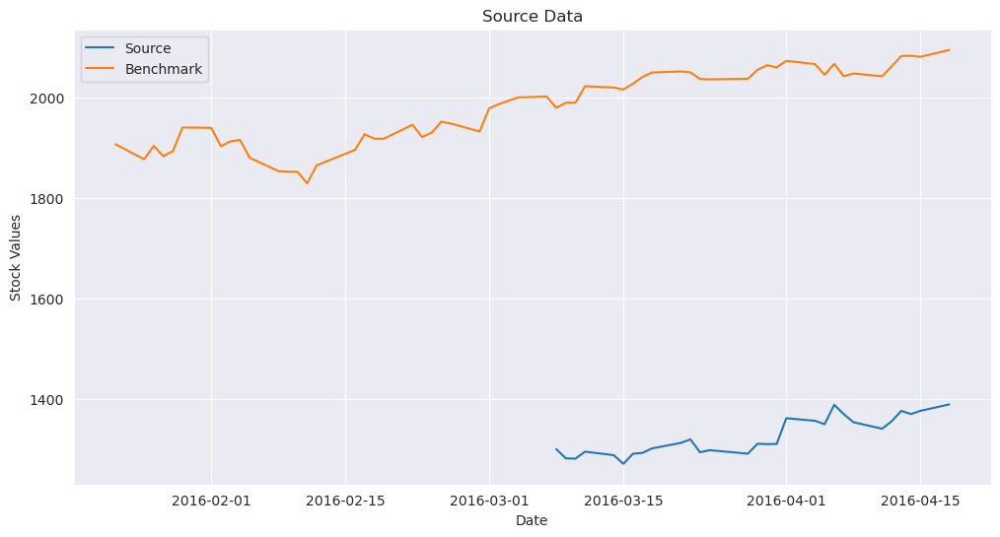


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

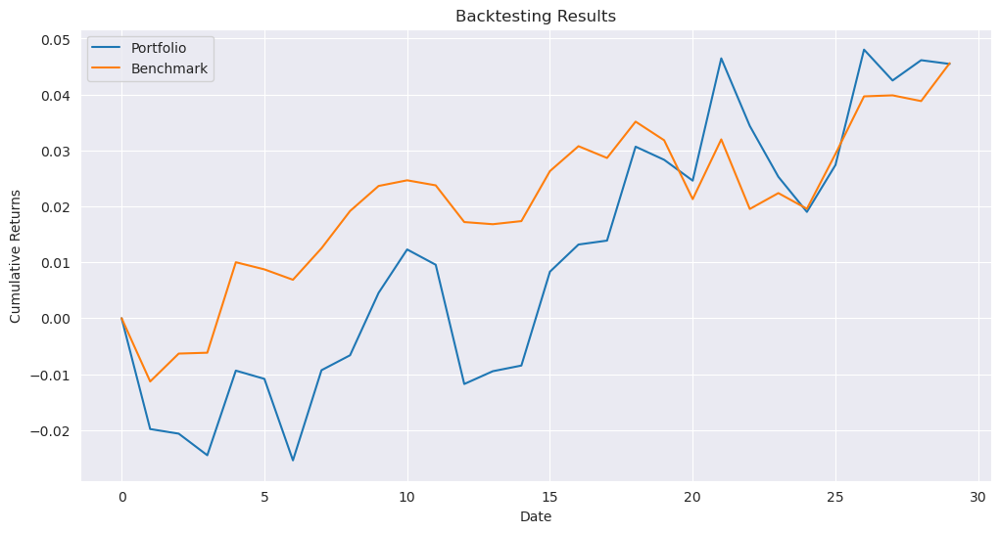

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_0_ew.pkl
initial date: 2021-06-04 00:00:00


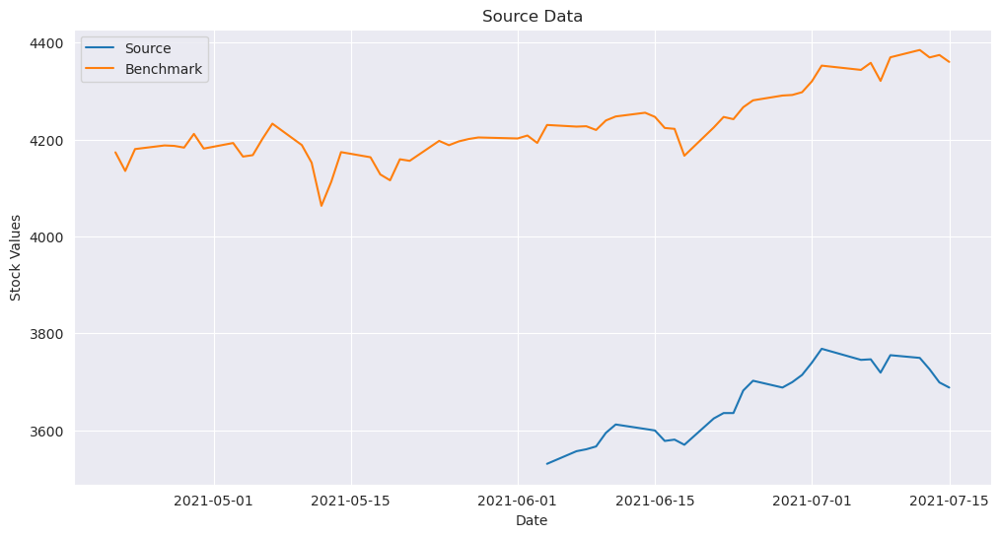


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

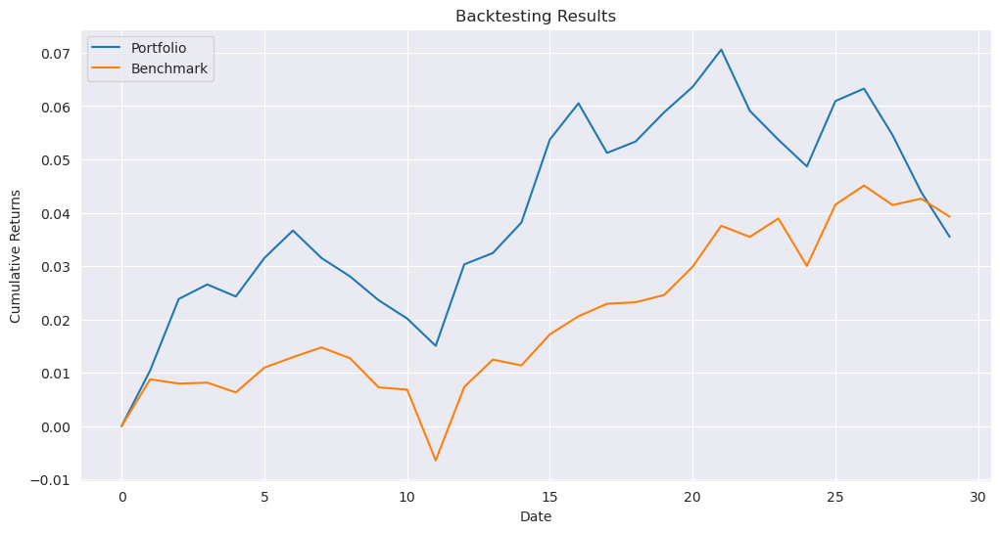

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_1_ew.pkl
initial date: 2024-03-05 00:00:00


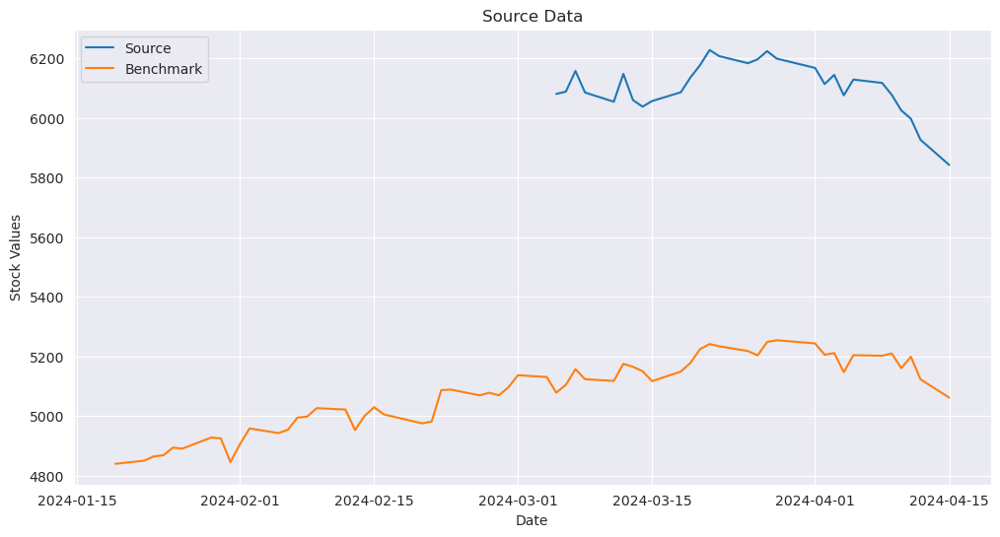


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

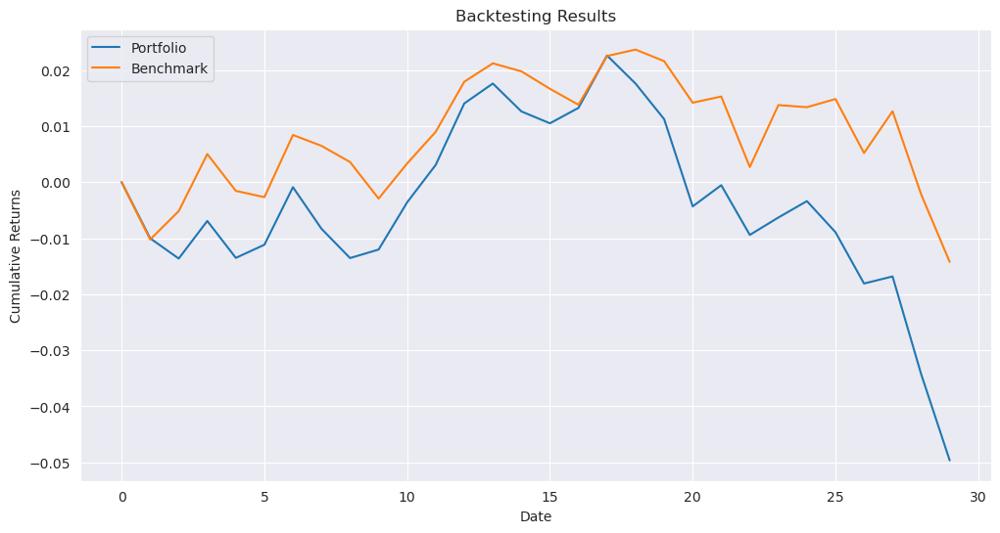

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_2_ew.pkl
initial date: 2020-06-25 00:00:00


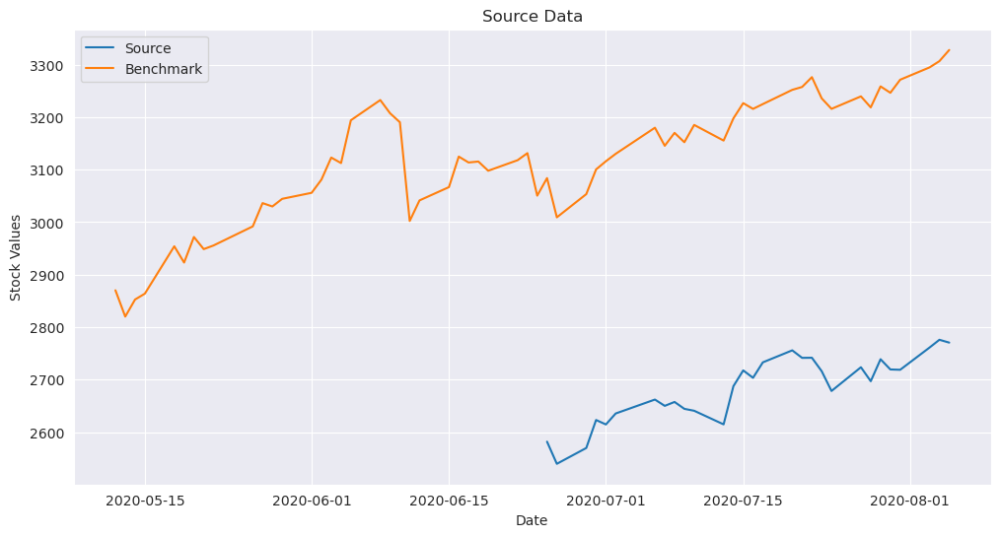


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

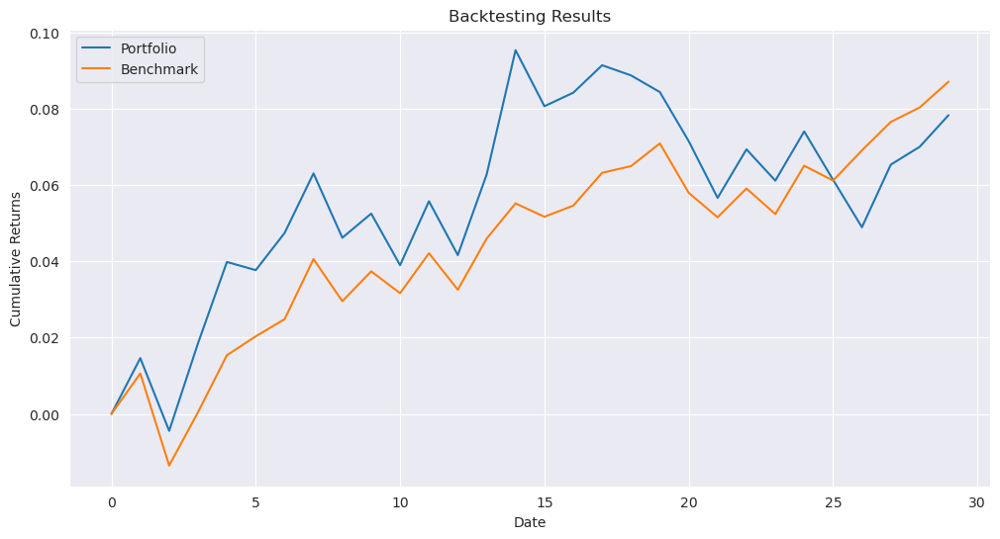

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_3_ew.pkl
initial date: 2024-06-07 00:00:00


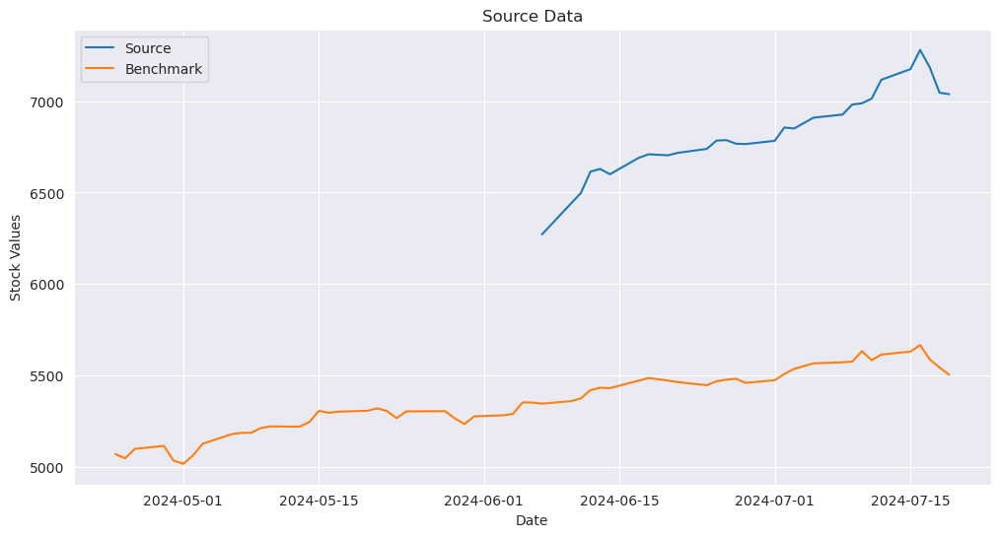


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

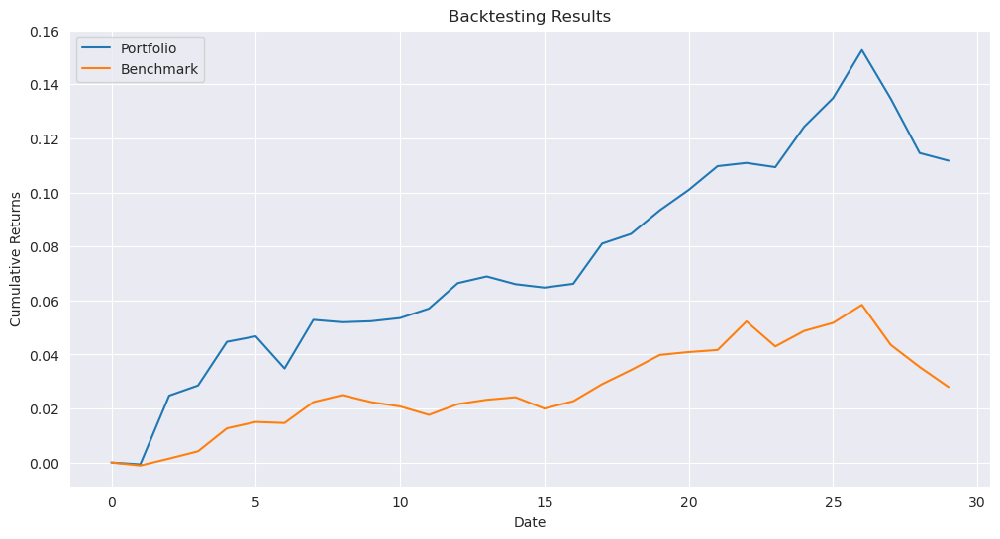

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_4_ew.pkl
initial date: 2014-02-07 00:00:00


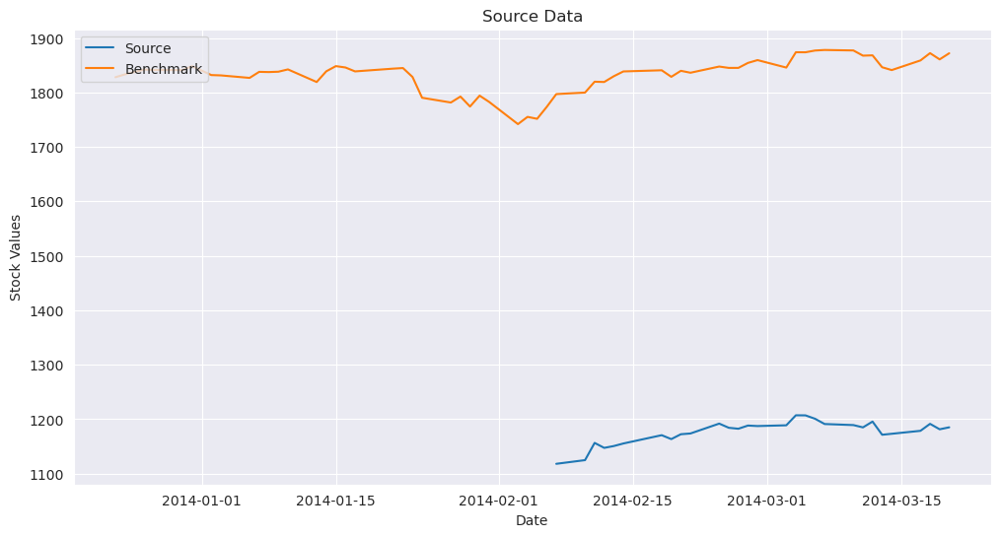


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

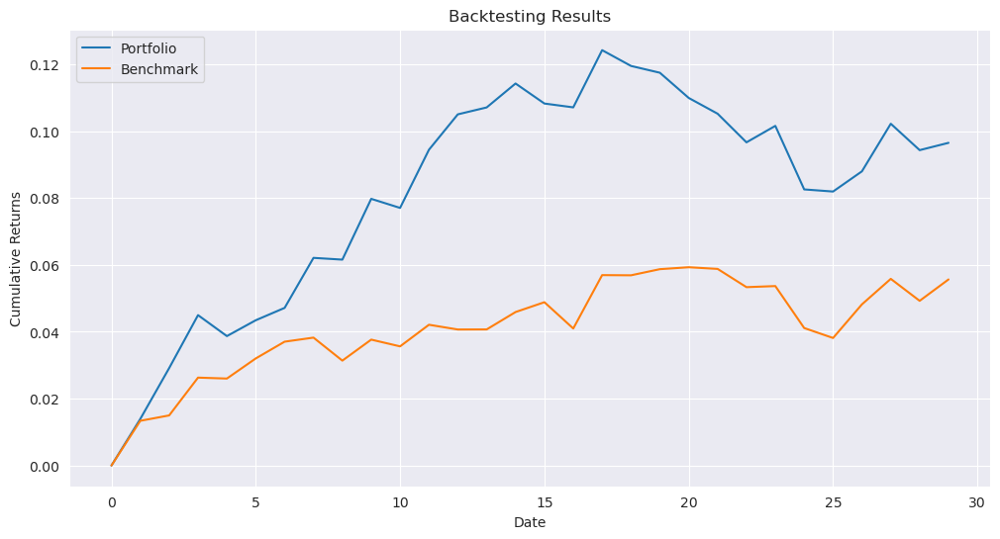

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_5_ew.pkl
initial date: 2016-04-21 00:00:00


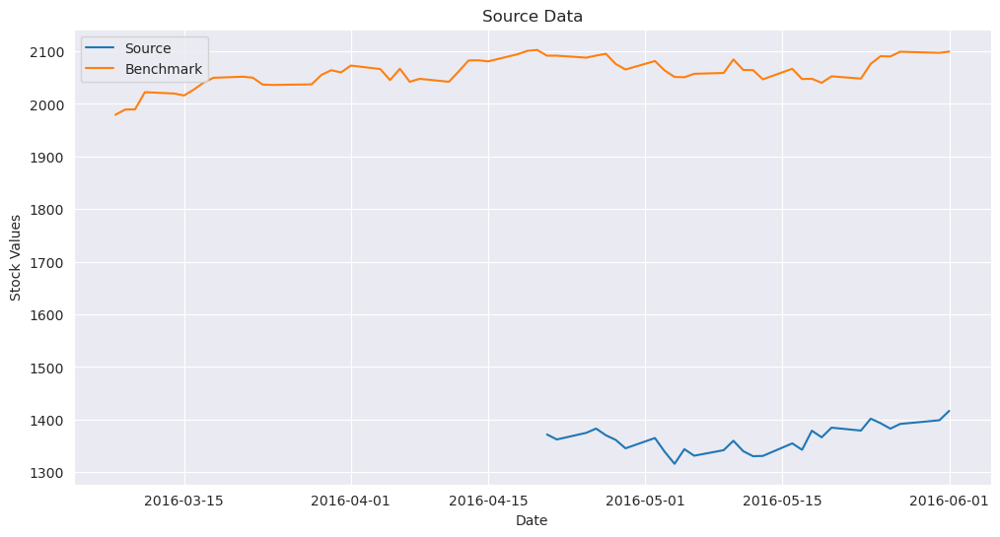


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

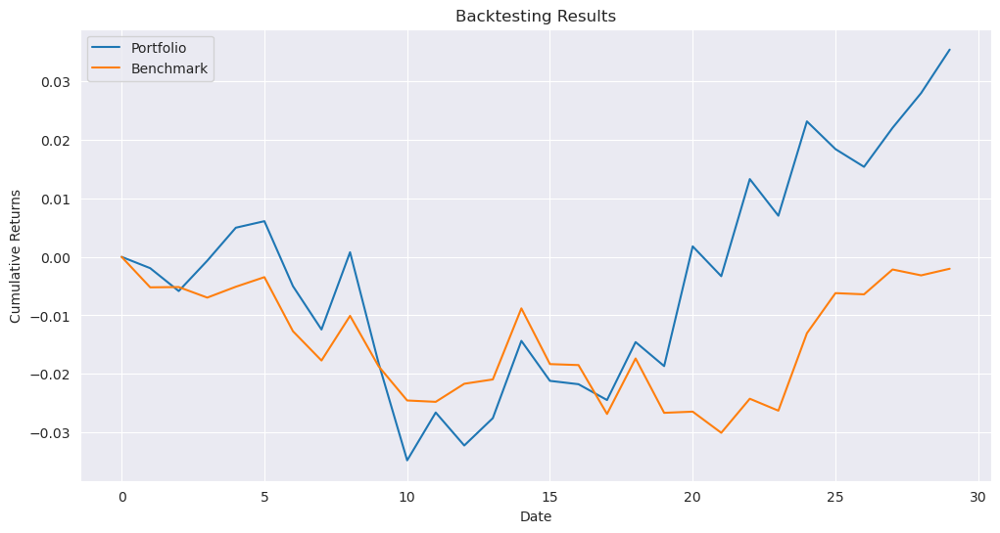

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_6_ew.pkl
initial date: 2020-05-11 00:00:00


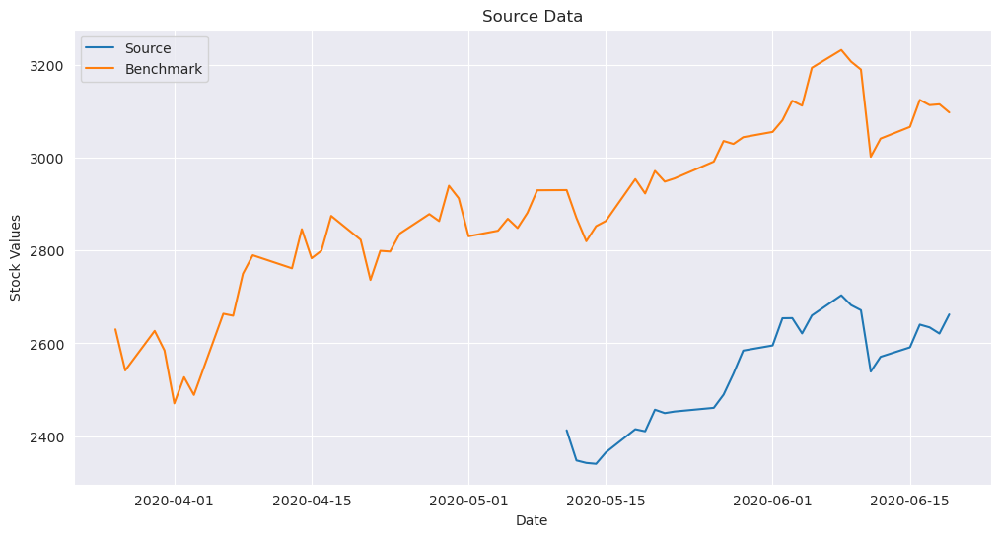


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

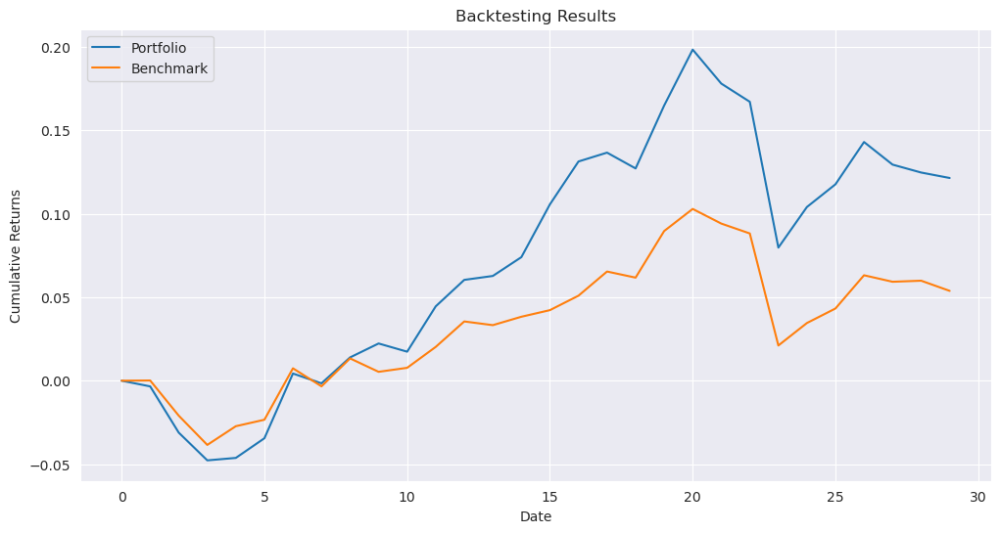

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_7_ew.pkl
initial date: 2016-11-30 00:00:00


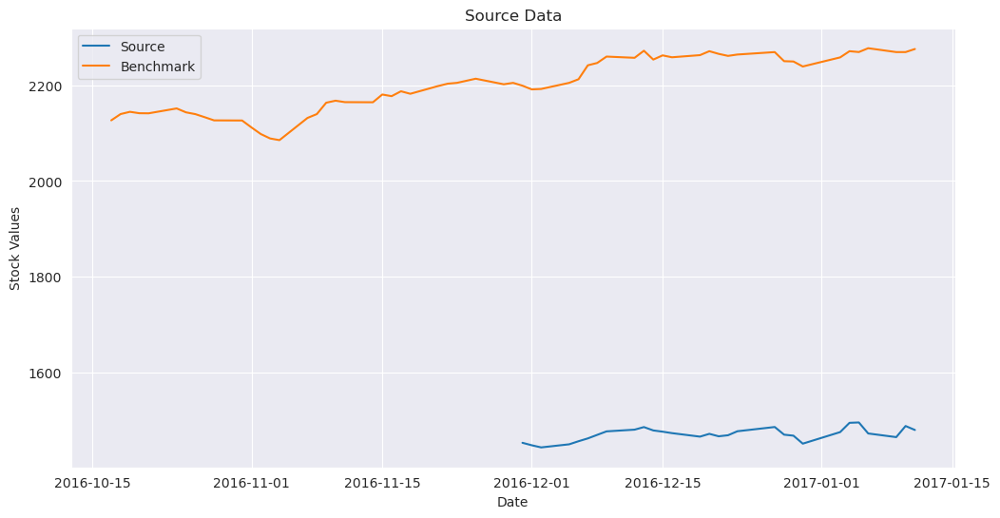


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

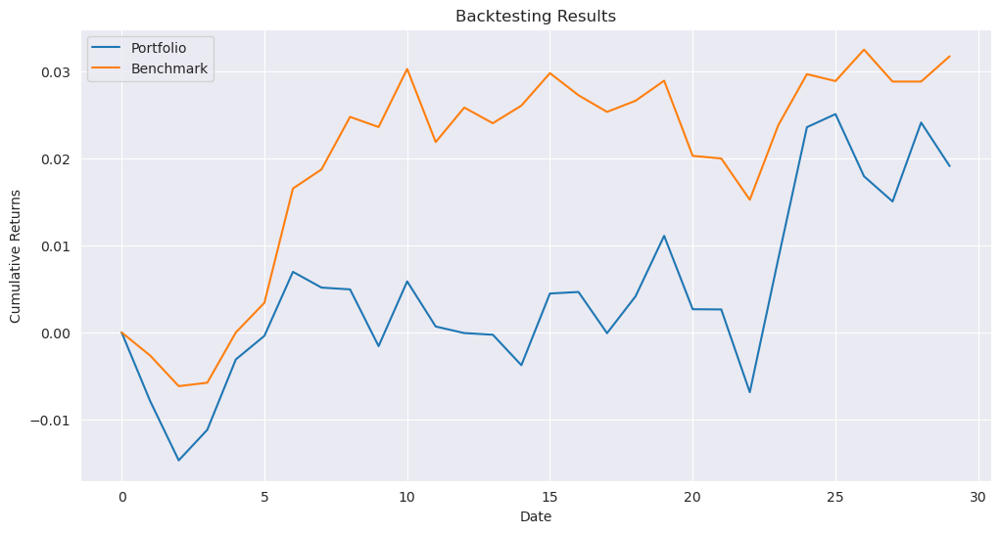

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_8_ew.pkl
initial date: 2021-08-25 00:00:00


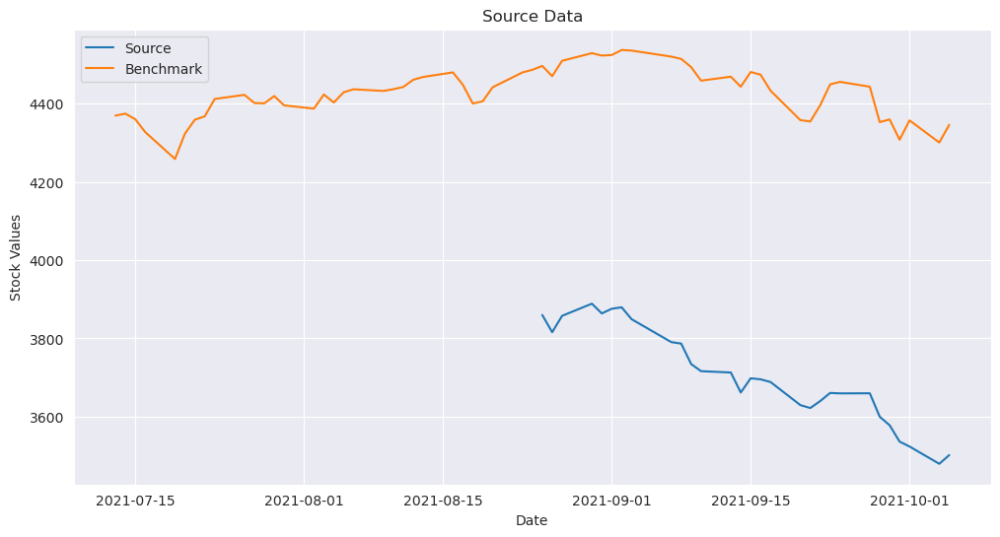


Time step 1/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.090909
  Max weight:     0.090909
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

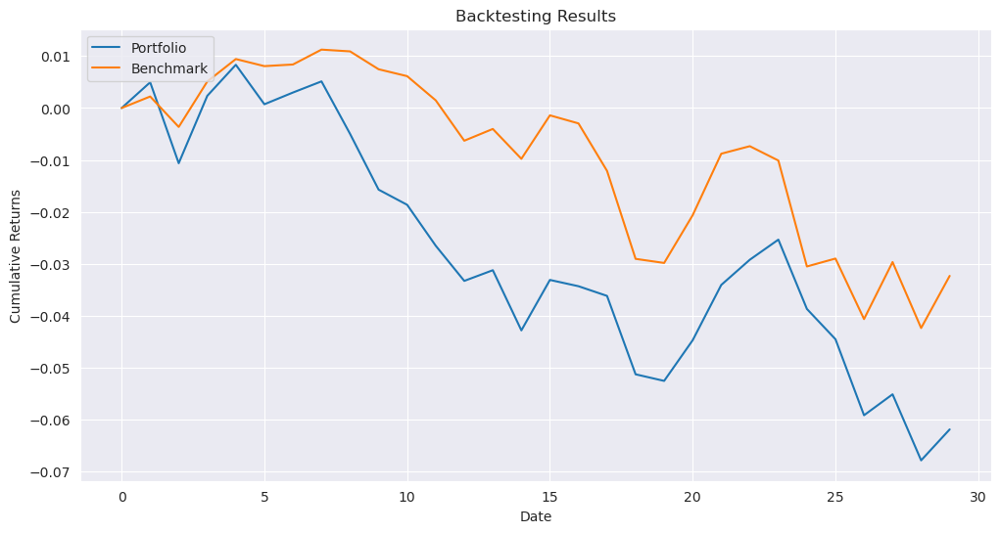

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_9_ew.pkl


In [25]:
opt_fun_ew = partial(equal_weights_baseline)
results_path_ew_10 = '../../results/qubo_unrestricted/results_10_{}_ew.pkl'
_ = run_experiment(results_path_ew_10, data_10, benchmark, opt_fun_ew, parameters)

### GA 

In [26]:
opt_fun_ga = partial(genetic_algorithm_qubo, 
                  population_size=parameters["population_size"], 
                  num_generations=parameters["num_generations"], 
                  mutation_rate=parameters["mutation_rate"], 
                  elitism=parameters["elitism"])

initial date: 2016-03-08 00:00:00


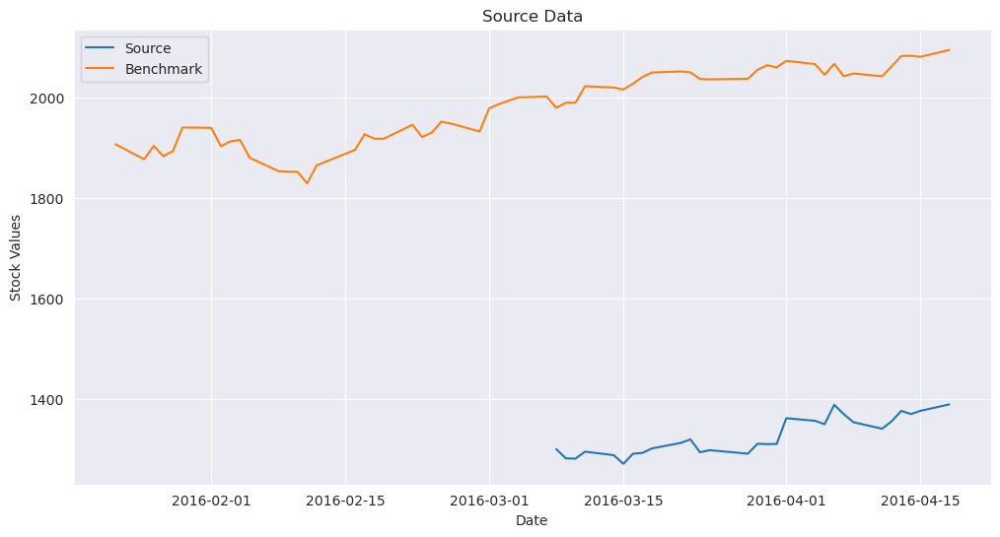


Time step 1/30 - Weight Statistics:
  Min weight:     0.000403
  Max weight:     0.505241
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001134
  Max weight:     0.335525
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001409
  Max weight:     0.630445
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000344
  Max weight:     0.526358
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.000219
  Max weight:     0.581338
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.000277
  Max weight:     0.583102
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.000882
  Max weight:     0.463668
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

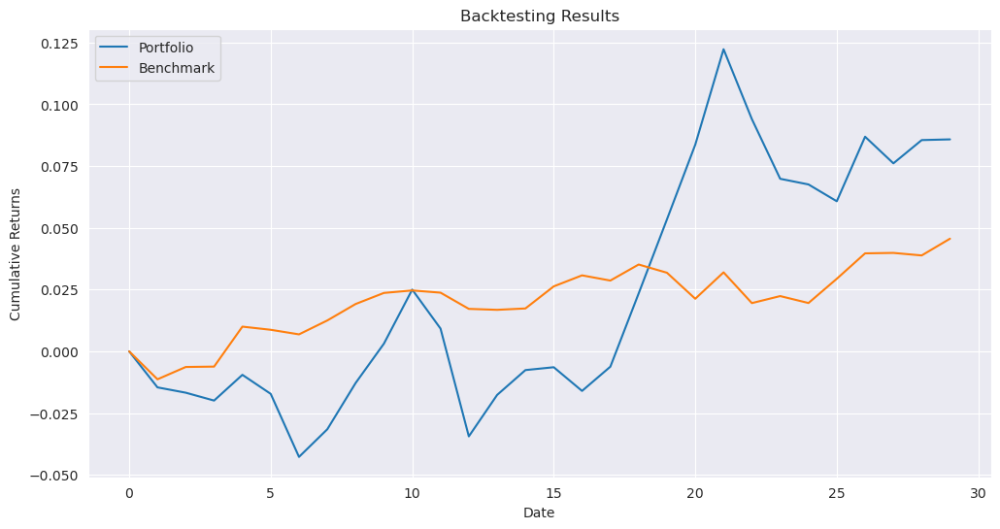

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_0_ga.pkl
initial date: 2021-06-04 00:00:00


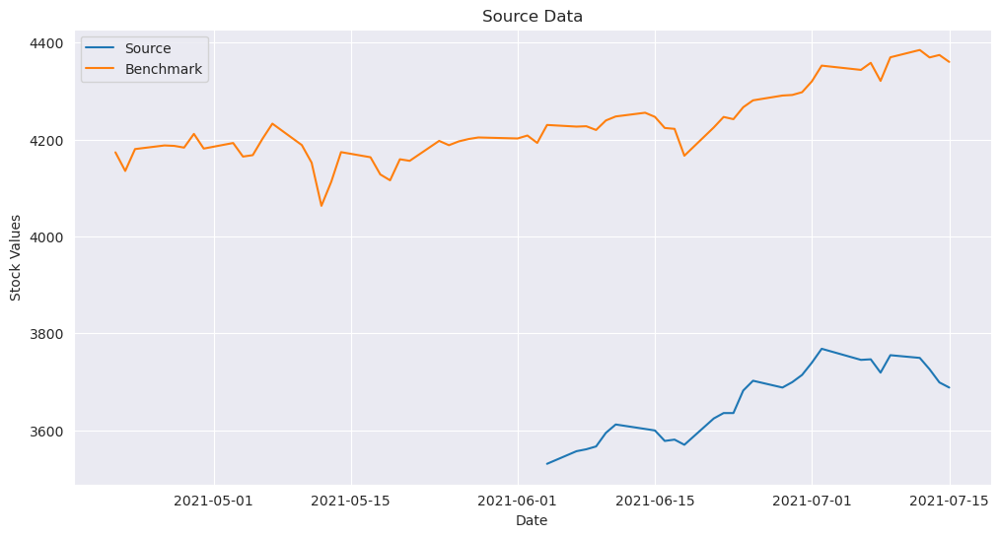


Time step 1/30 - Weight Statistics:
  Min weight:     0.003136
  Max weight:     0.406540
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001892
  Max weight:     0.429071
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.003398
  Max weight:     0.635978
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000760
  Max weight:     0.647390
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.002169
  Max weight:     0.543056
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001718
  Max weight:     0.652418
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.000446
  Max weight:     0.642762
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

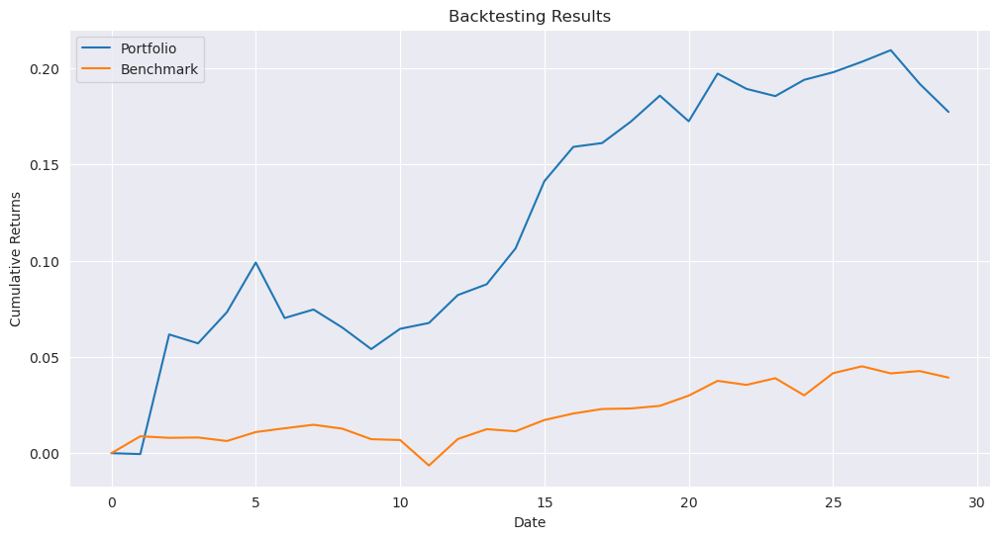

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_1_ga.pkl
initial date: 2024-03-05 00:00:00


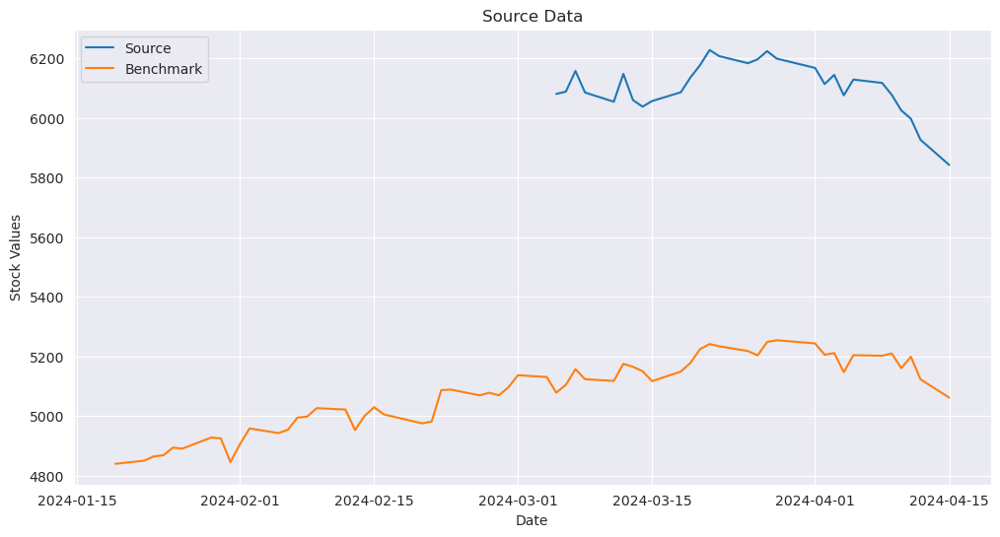


Time step 1/30 - Weight Statistics:
  Min weight:     0.000928
  Max weight:     0.413574
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001259
  Max weight:     0.648606
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.000074
  Max weight:     0.470182
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.002875
  Max weight:     0.459723
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.000213
  Max weight:     0.377752
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.000081
  Max weight:     0.490212
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001491
  Max weight:     0.451390
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

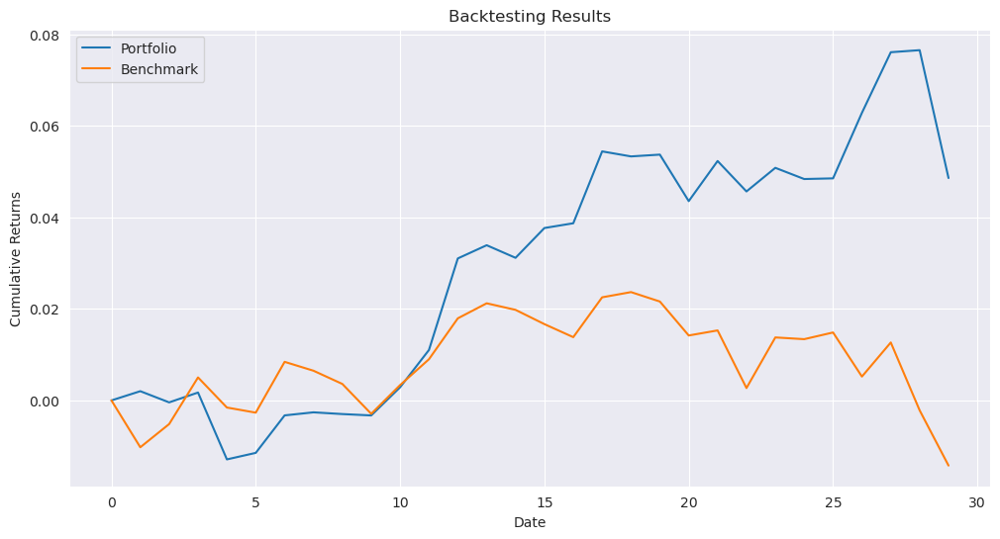

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_2_ga.pkl
initial date: 2020-06-25 00:00:00


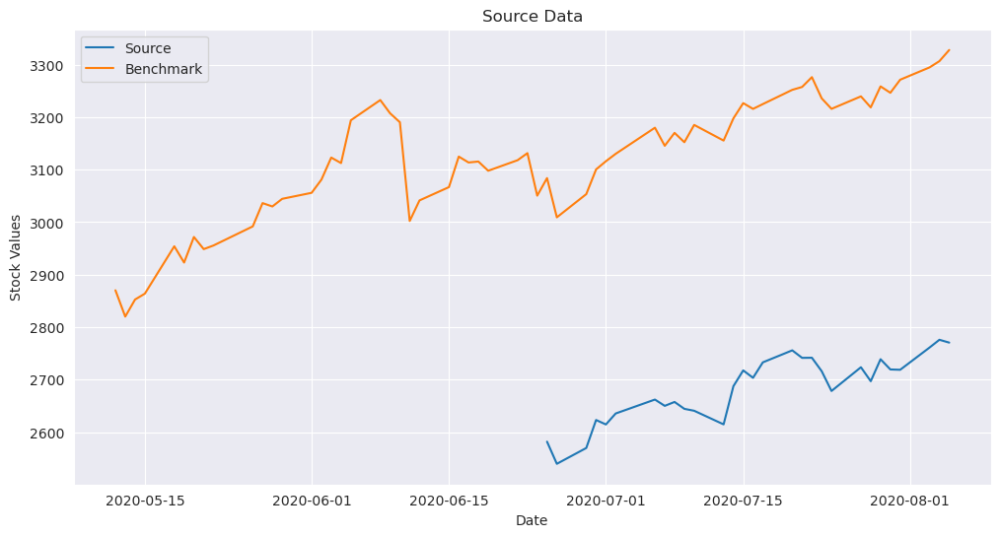


Time step 1/30 - Weight Statistics:
  Min weight:     0.000467
  Max weight:     0.599695
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001115
  Max weight:     0.585666
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.000518
  Max weight:     0.450959
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000523
  Max weight:     0.328265
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.000176
  Max weight:     0.555573
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.591112
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001848
  Max weight:     0.669890
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

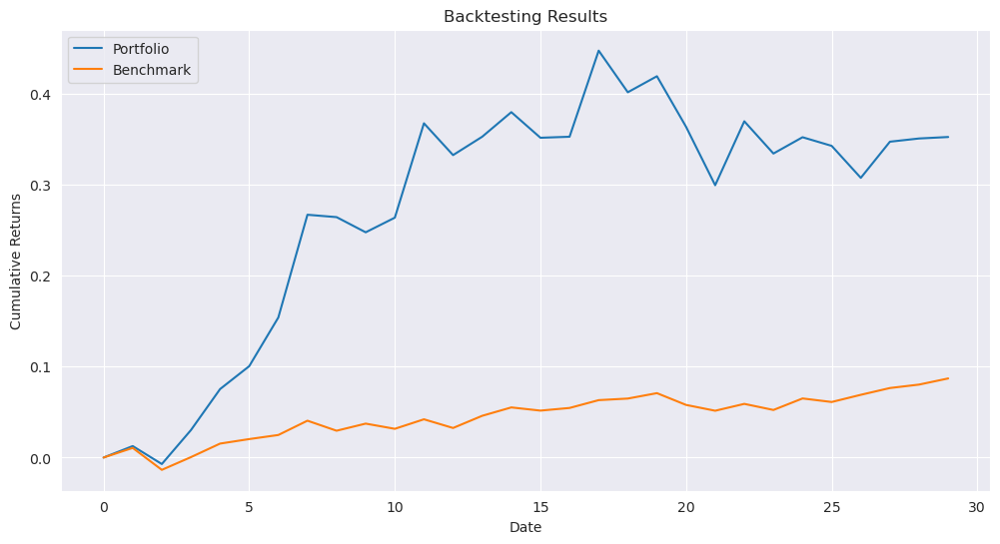

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_3_ga.pkl
initial date: 2024-06-07 00:00:00


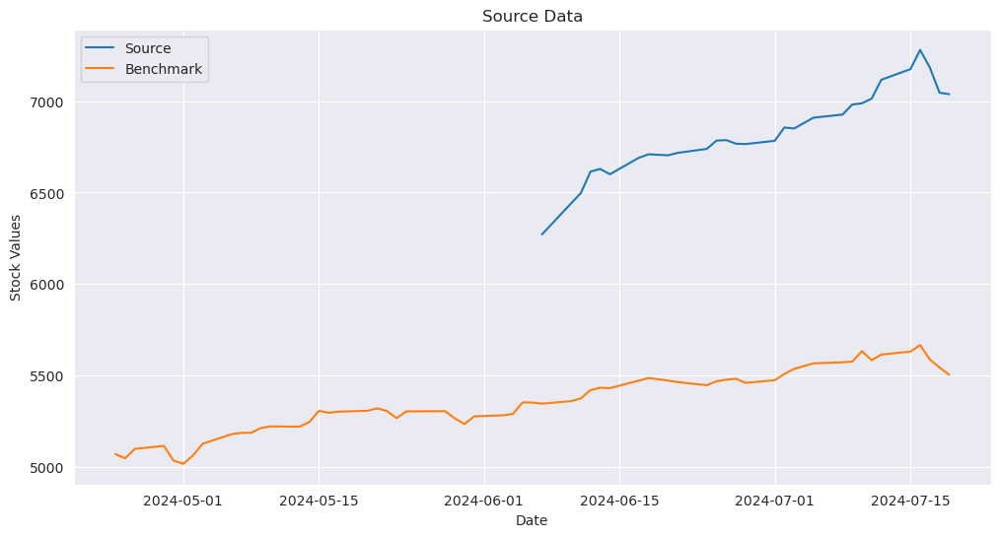


Time step 1/30 - Weight Statistics:
  Min weight:     0.000090
  Max weight:     0.408072
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.000116
  Max weight:     0.595111
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.000643
  Max weight:     0.423080
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000762
  Max weight:     0.510471
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.002041
  Max weight:     0.652232
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.003206
  Max weight:     0.737435
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.002215
  Max weight:     0.672867
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

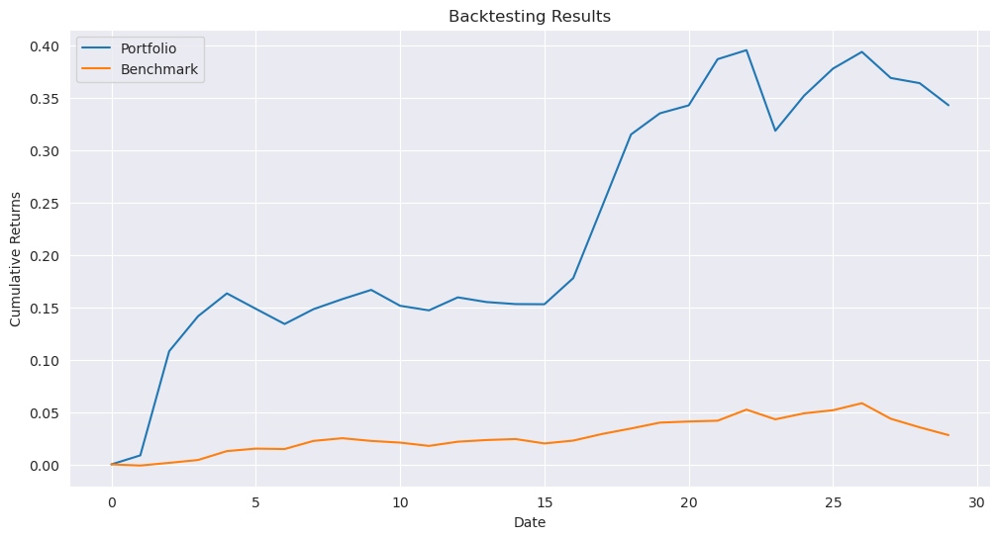

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_4_ga.pkl
initial date: 2014-02-07 00:00:00


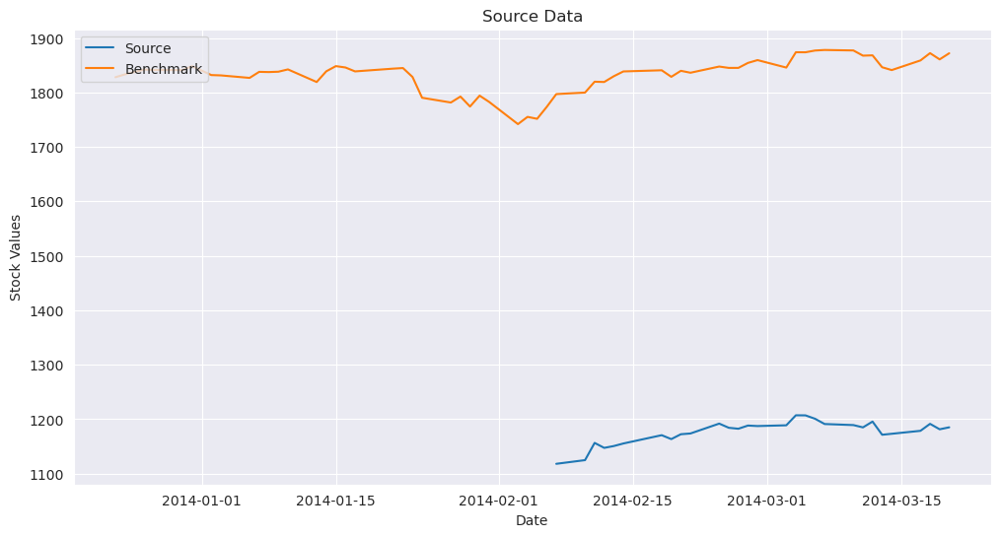


Time step 1/30 - Weight Statistics:
  Min weight:     0.001281
  Max weight:     0.562656
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001655
  Max weight:     0.579003
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001447
  Max weight:     0.505025
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000780
  Max weight:     0.470437
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.000806
  Max weight:     0.528071
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001031
  Max weight:     0.562837
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001020
  Max weight:     0.578103
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

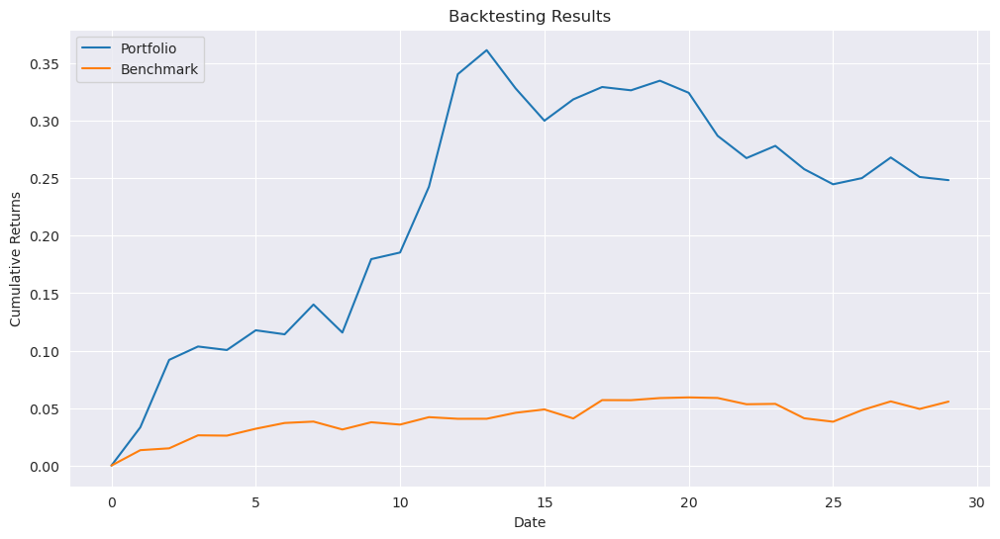

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_5_ga.pkl
initial date: 2016-04-21 00:00:00


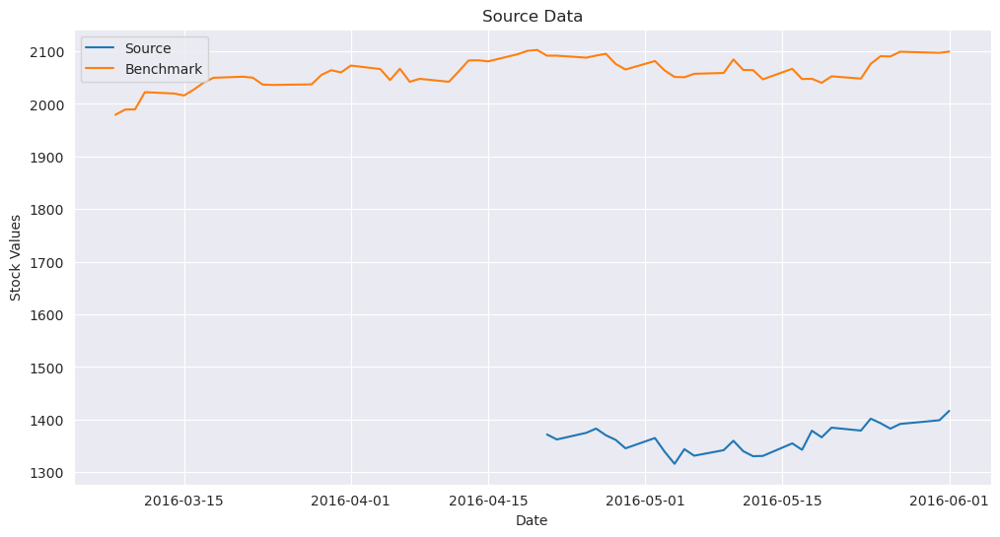


Time step 1/30 - Weight Statistics:
  Min weight:     0.000023
  Max weight:     0.692775
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001702
  Max weight:     0.826163
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.000214
  Max weight:     0.824549
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001345
  Max weight:     0.753060
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001016
  Max weight:     0.605136
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.005394
  Max weight:     0.478249
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.000525
  Max weight:     0.695559
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

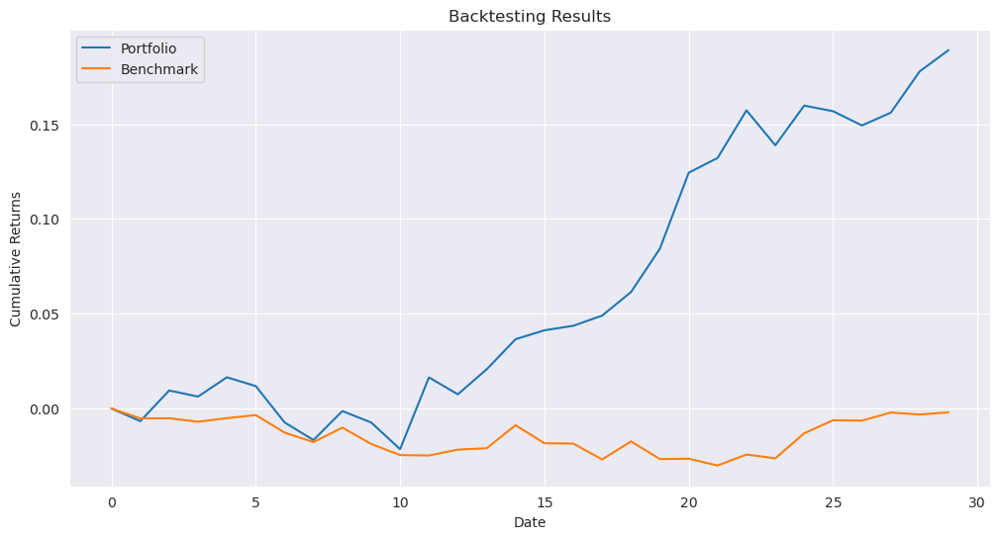

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_6_ga.pkl
initial date: 2020-05-11 00:00:00


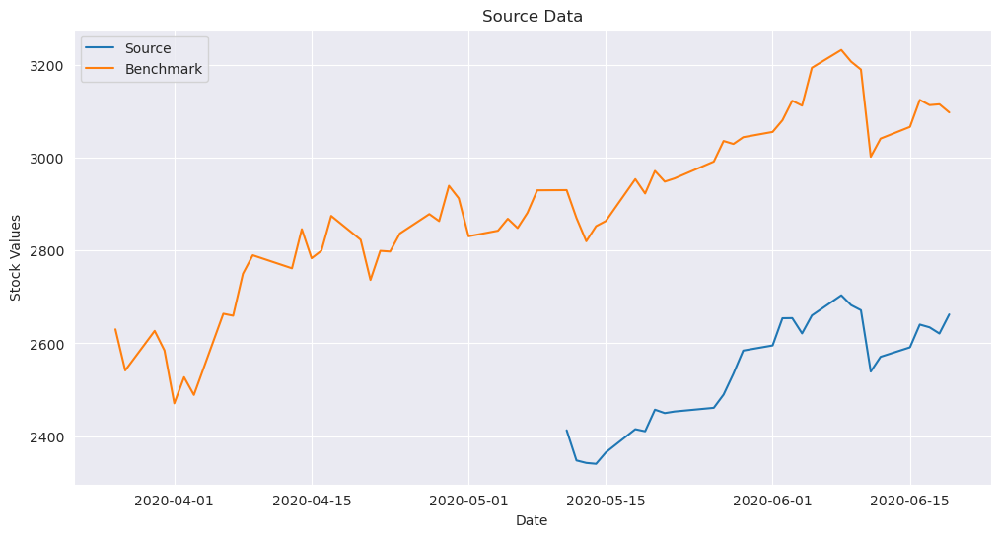


Time step 1/30 - Weight Statistics:
  Min weight:     0.000203
  Max weight:     0.618617
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.000552
  Max weight:     0.576319
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.002592
  Max weight:     0.727225
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000645
  Max weight:     0.777611
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.003662
  Max weight:     0.774452
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001206
  Max weight:     0.588580
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.000612
  Max weight:     0.423453
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

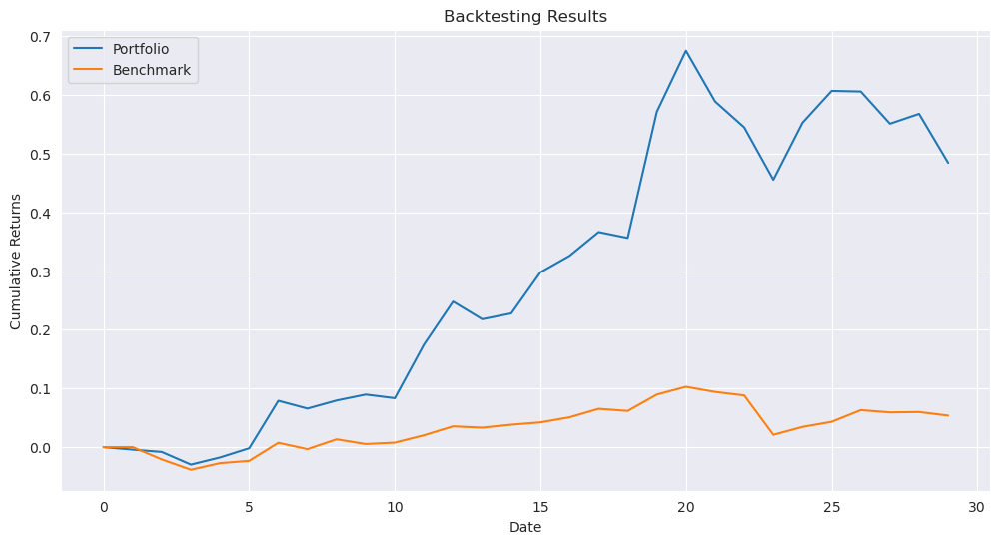

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_7_ga.pkl
initial date: 2016-11-30 00:00:00


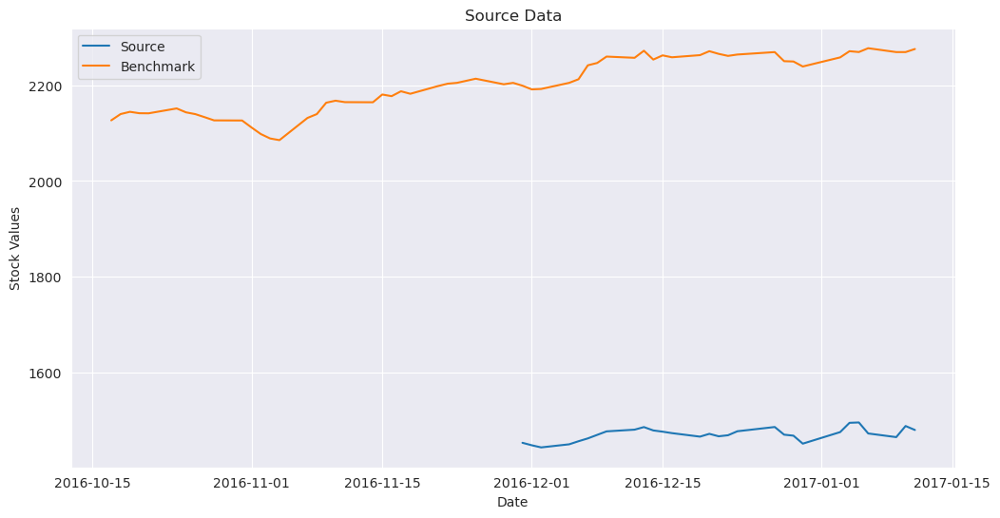


Time step 1/30 - Weight Statistics:
  Min weight:     0.001090
  Max weight:     0.465876
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.002208
  Max weight:     0.499122
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001606
  Max weight:     0.381028
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000485
  Max weight:     0.524024
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001637
  Max weight:     0.485748
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.000171
  Max weight:     0.470176
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.000915
  Max weight:     0.347765
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

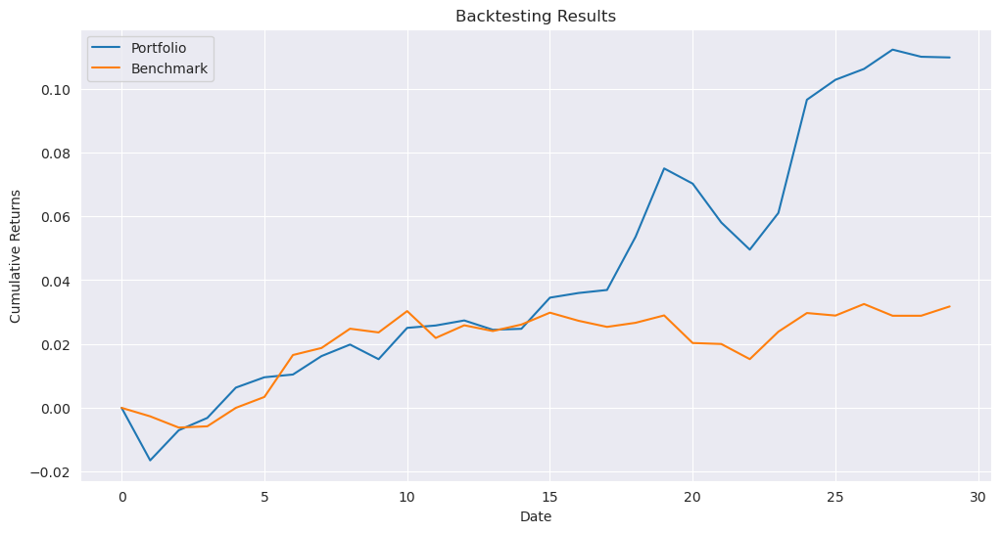

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_8_ga.pkl
initial date: 2021-08-25 00:00:00


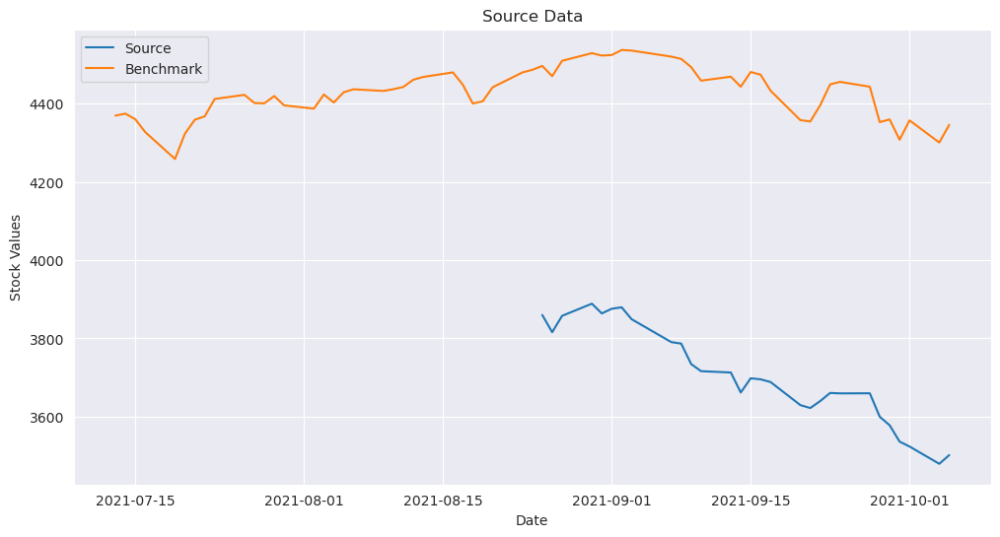


Time step 1/30 - Weight Statistics:
  Min weight:     0.000426
  Max weight:     0.782638
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.000038
  Max weight:     0.433714
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001473
  Max weight:     0.359964
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.000365
  Max weight:     0.257376
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.002505
  Max weight:     0.354237
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.000770
  Max weight:     0.364034
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.000226
  Max weight:     0.451700
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

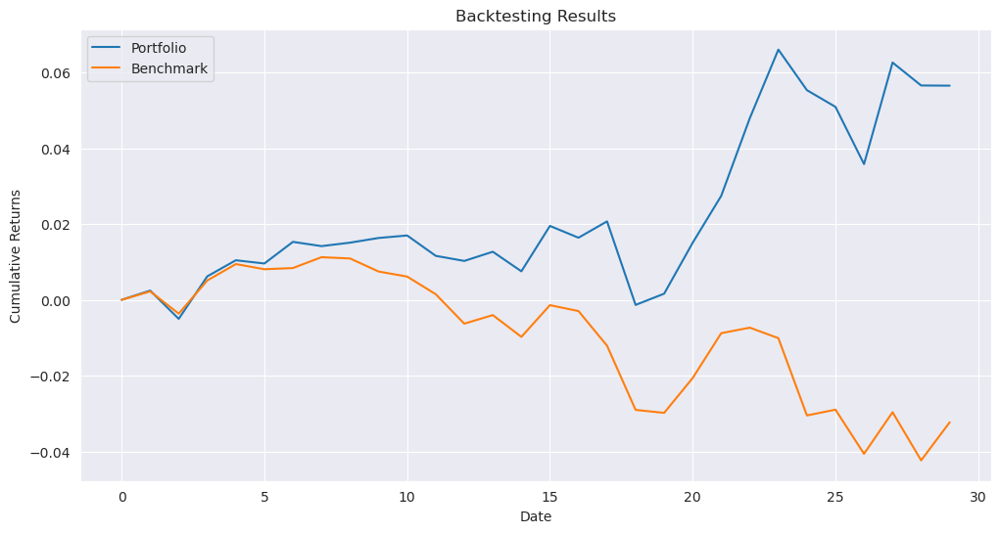

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_9_ga.pkl


In [27]:
results_path_ga_10 = '../../results/qubo_unrestricted/results_10_{}_ga.pkl'
_ = run_experiment(results_path_ga_10, data_10, benchmark, opt_fun_ga, parameters)

#### Brute Force

initial date: 2016-03-08 00:00:00


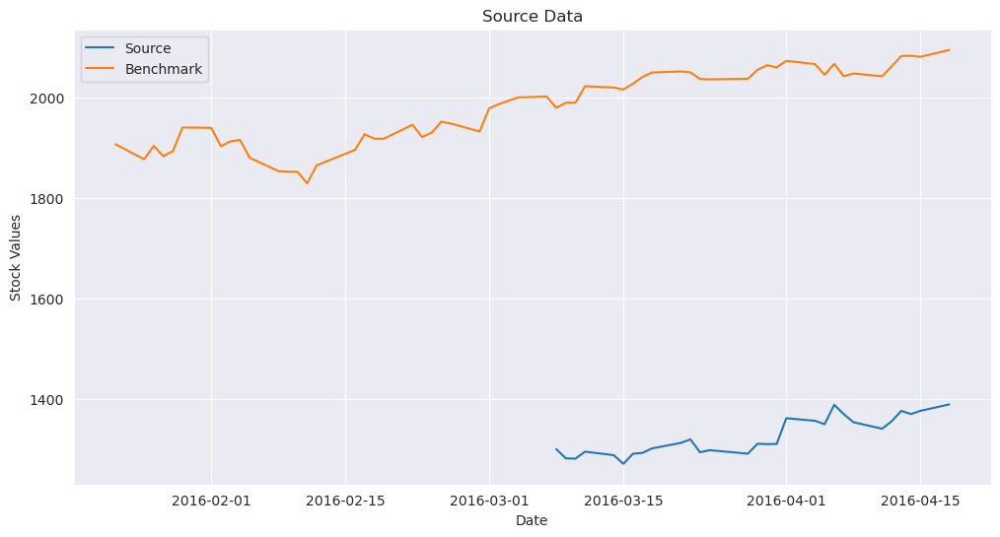


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.871152
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.579629
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.597236
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

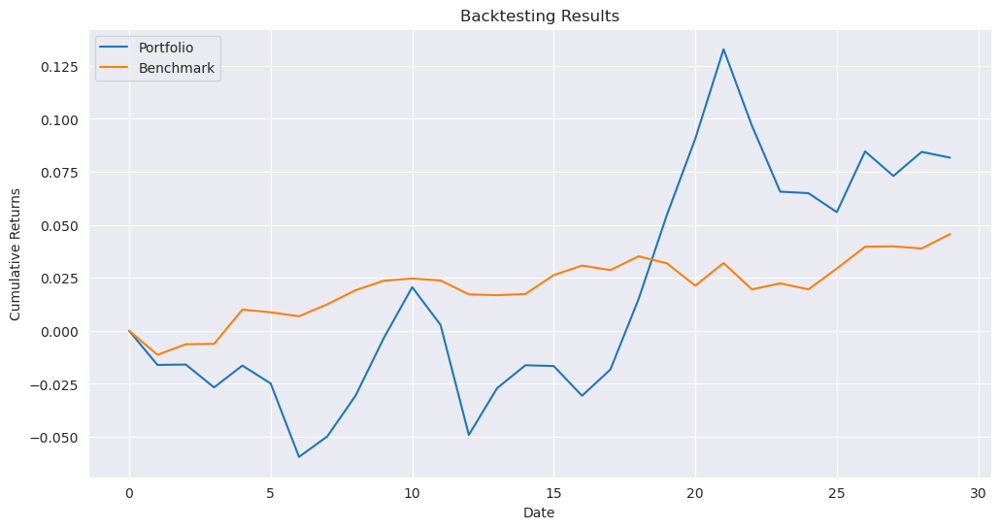

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_0_bf.pkl
initial date: 2021-06-04 00:00:00


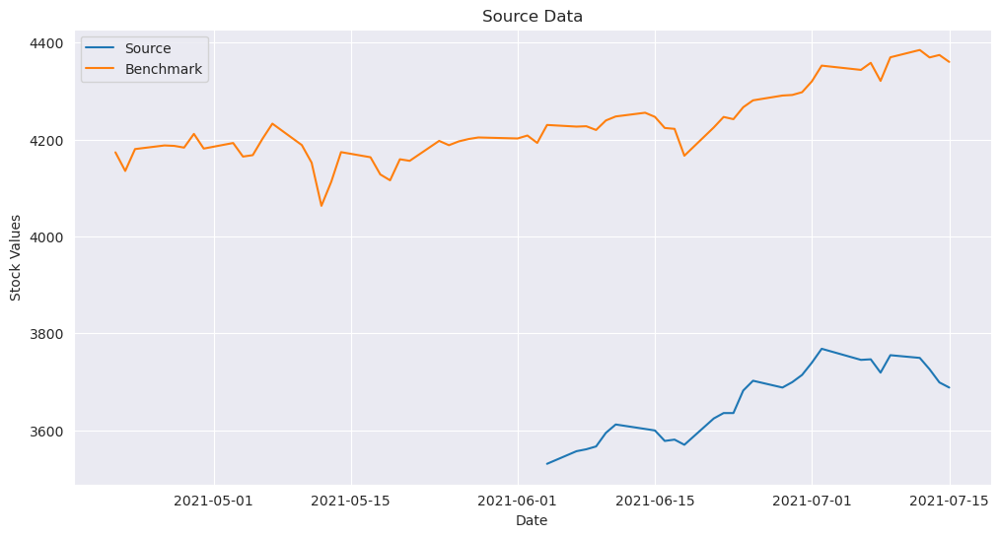


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.592726
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.380301
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

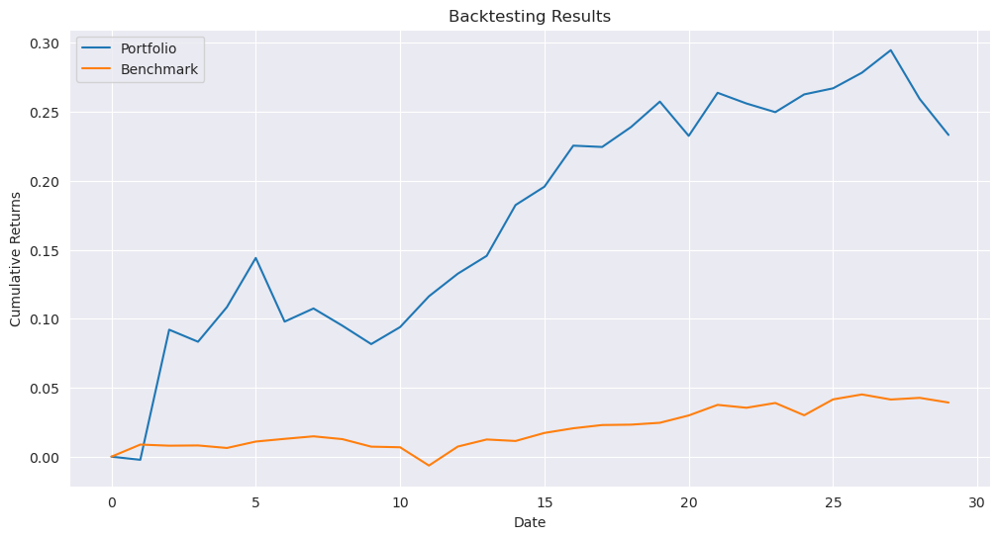

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_1_bf.pkl
initial date: 2024-03-05 00:00:00


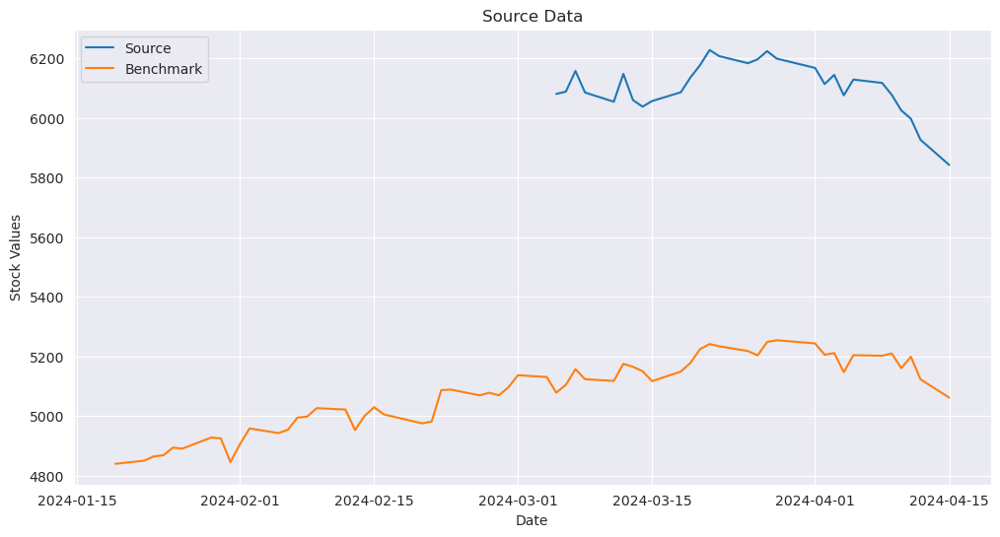


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.388056
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.720133
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.402030
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.409809
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.349031
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.499774
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.562590
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

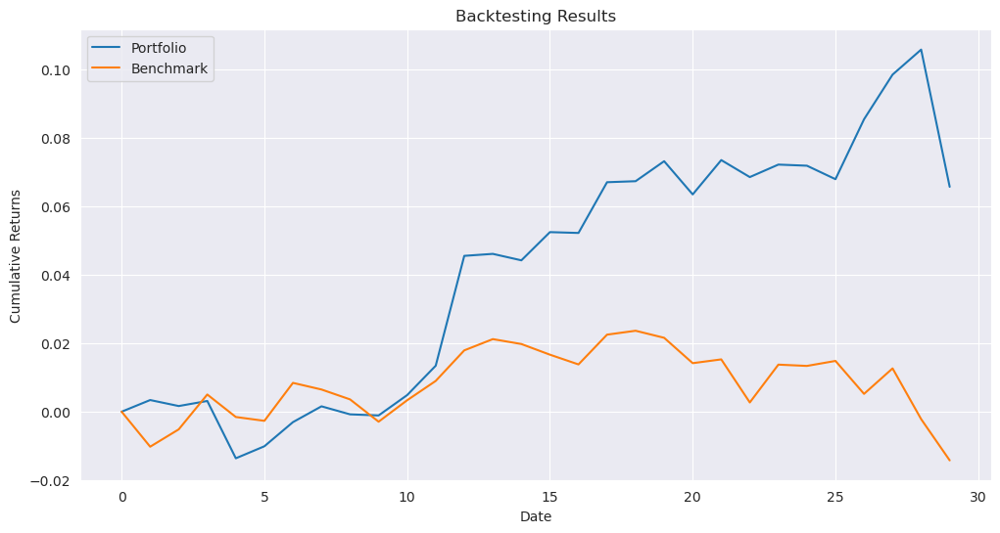

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_2_bf.pkl
initial date: 2020-06-25 00:00:00


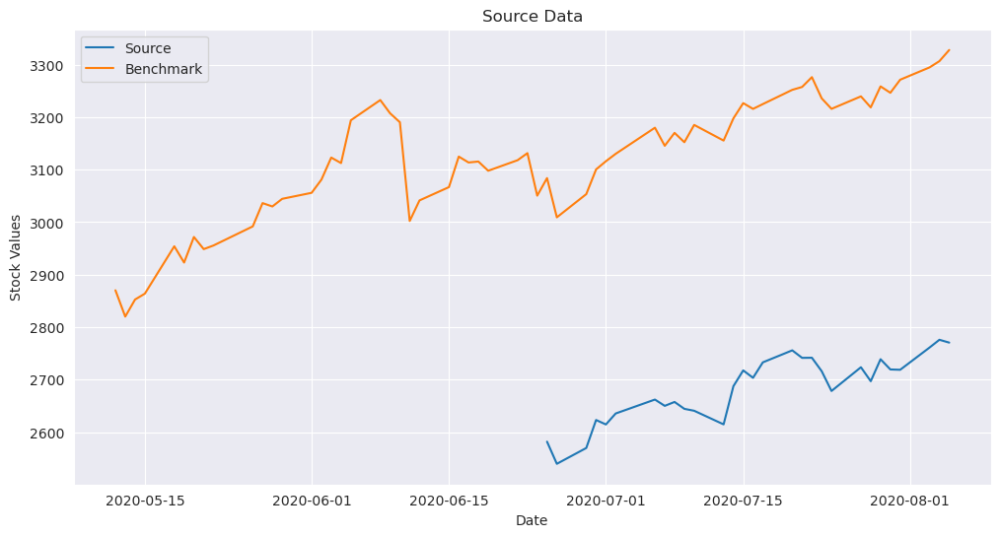


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.533877
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.682638
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.429409
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.348837
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.541616
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

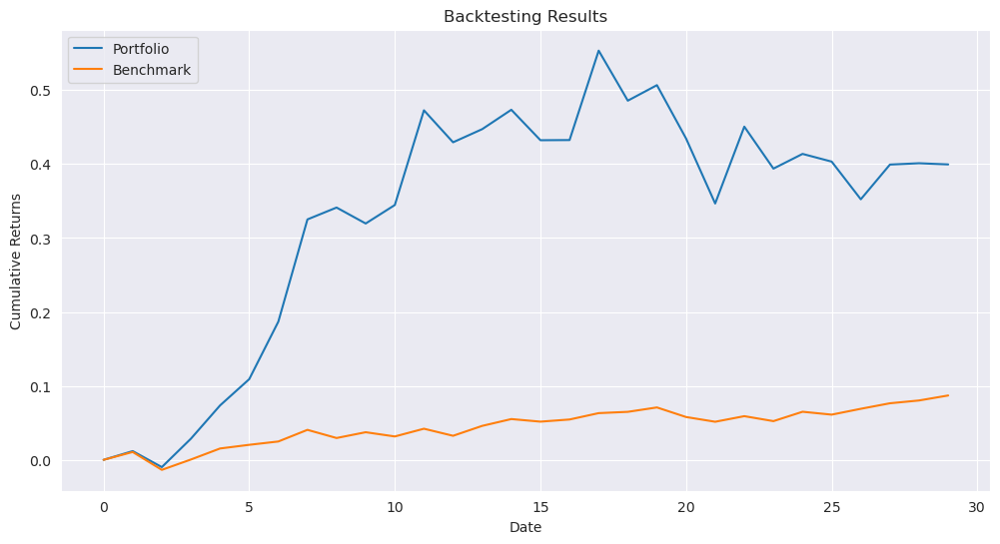

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_3_bf.pkl
initial date: 2024-06-07 00:00:00


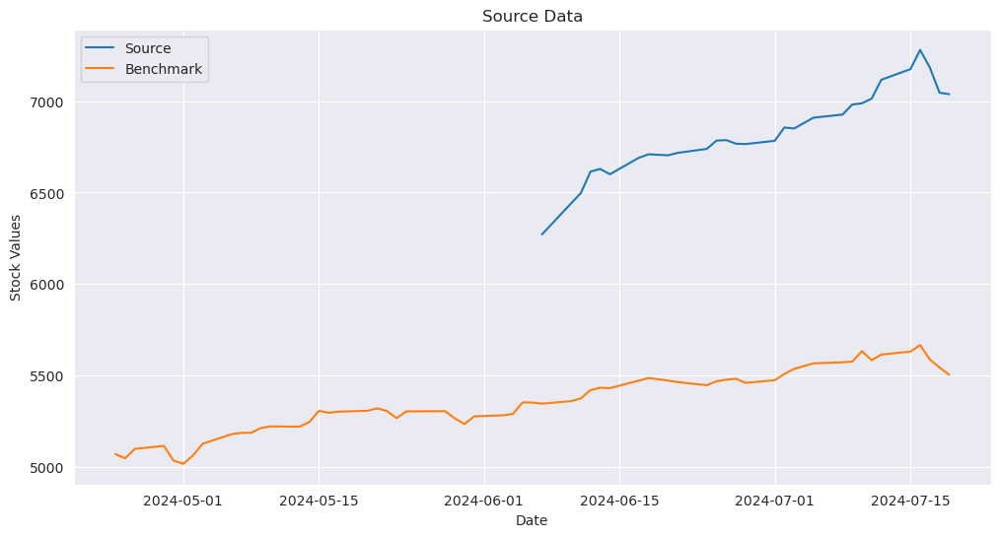


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.549878
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.409795
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

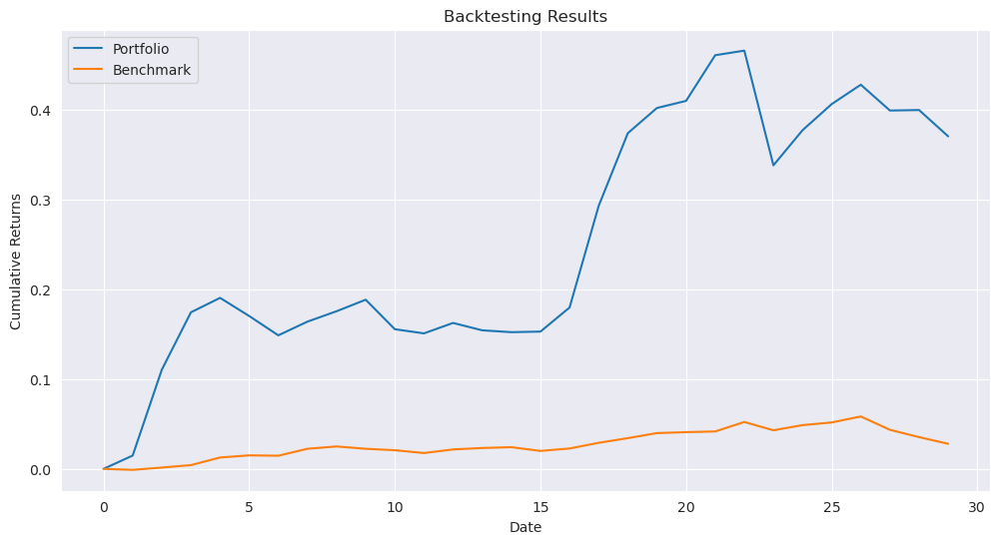

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_4_bf.pkl
initial date: 2014-02-07 00:00:00


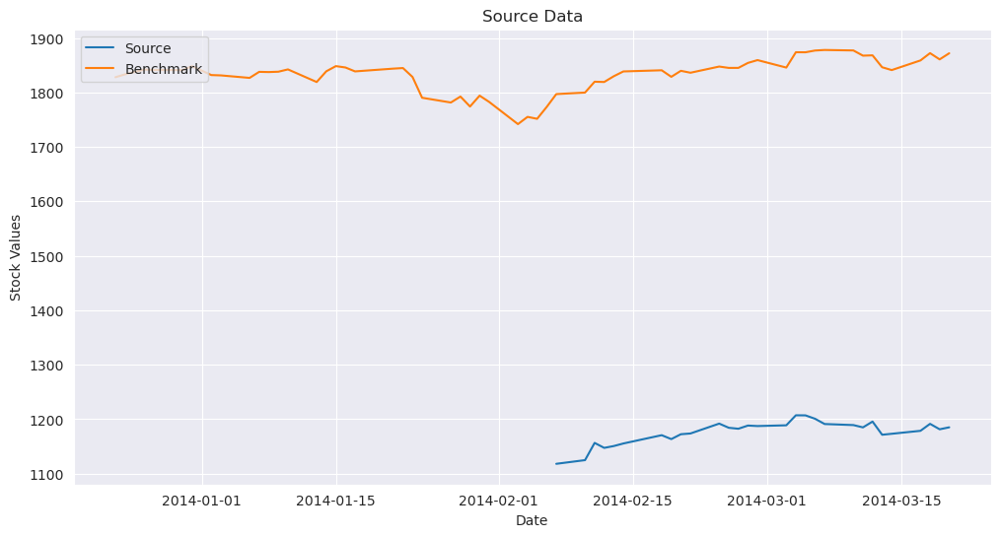


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.549452
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.572448
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

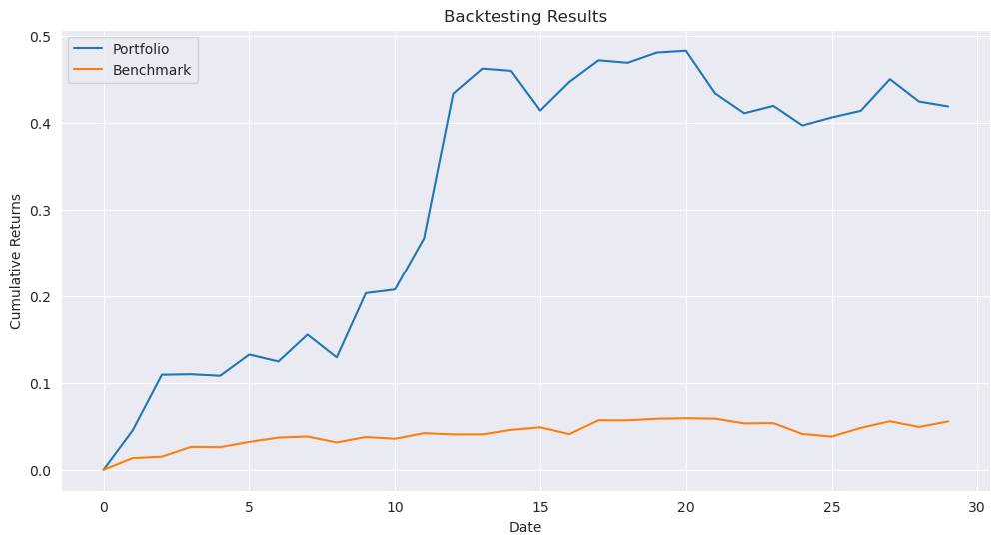

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_5_bf.pkl
initial date: 2016-04-21 00:00:00


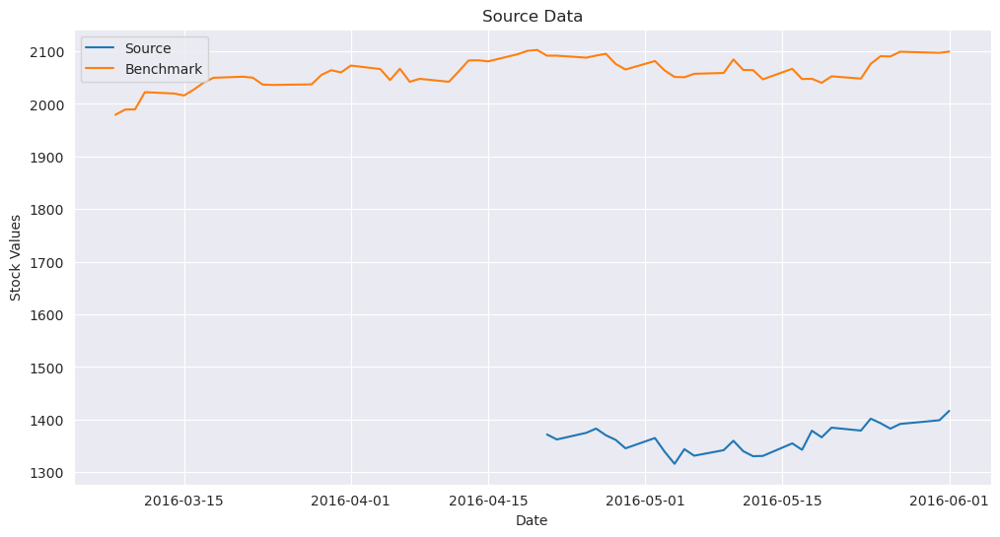


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.615202
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.754525
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

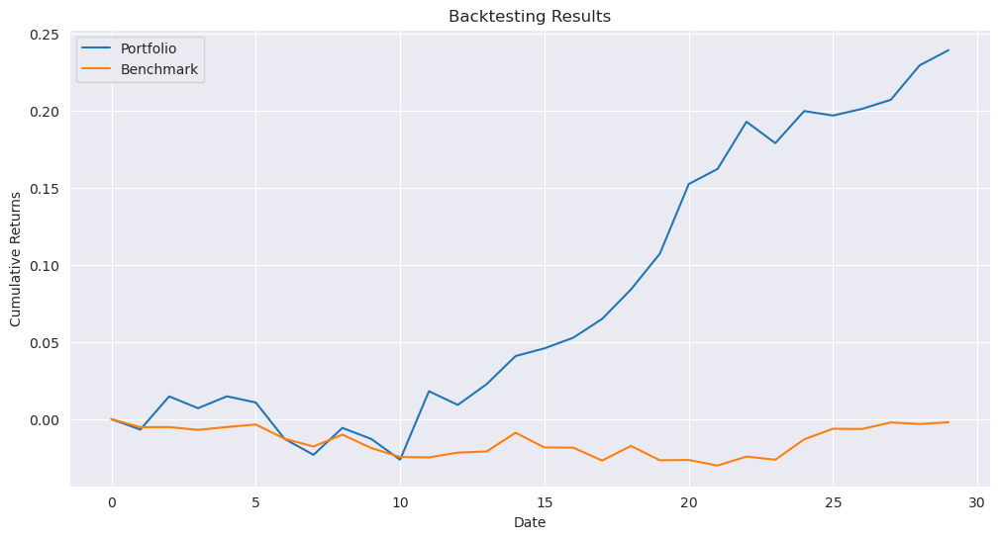

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_6_bf.pkl
initial date: 2020-05-11 00:00:00


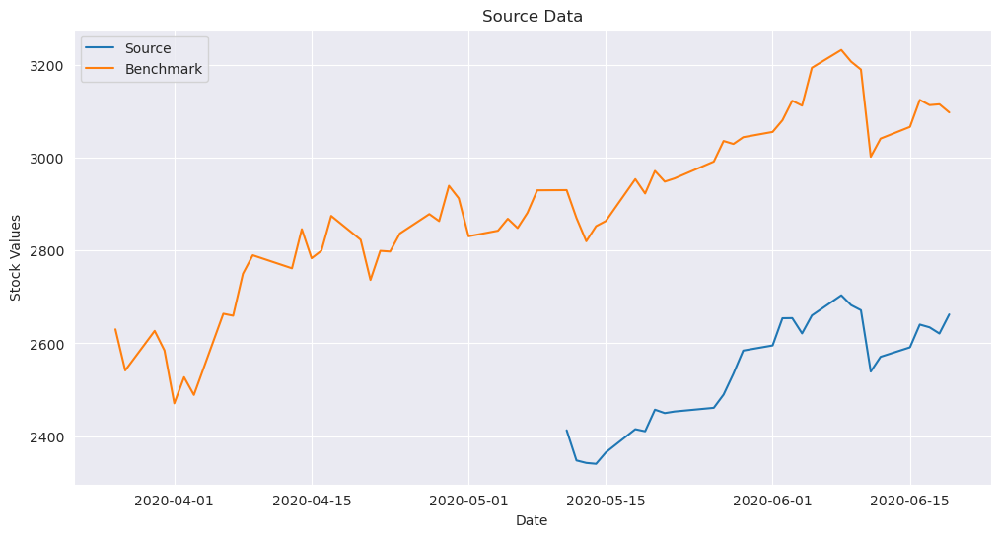


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.502112
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

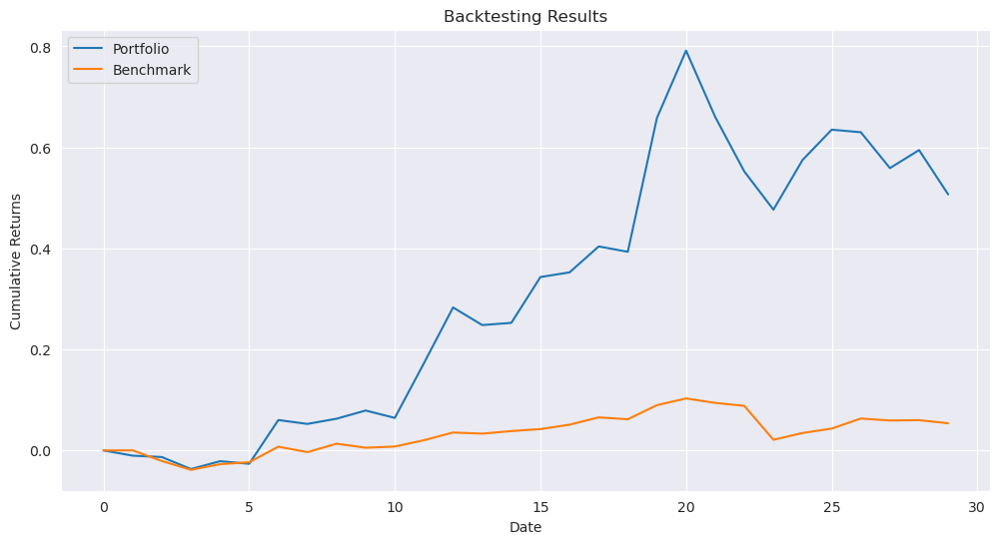

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_7_bf.pkl
initial date: 2016-11-30 00:00:00


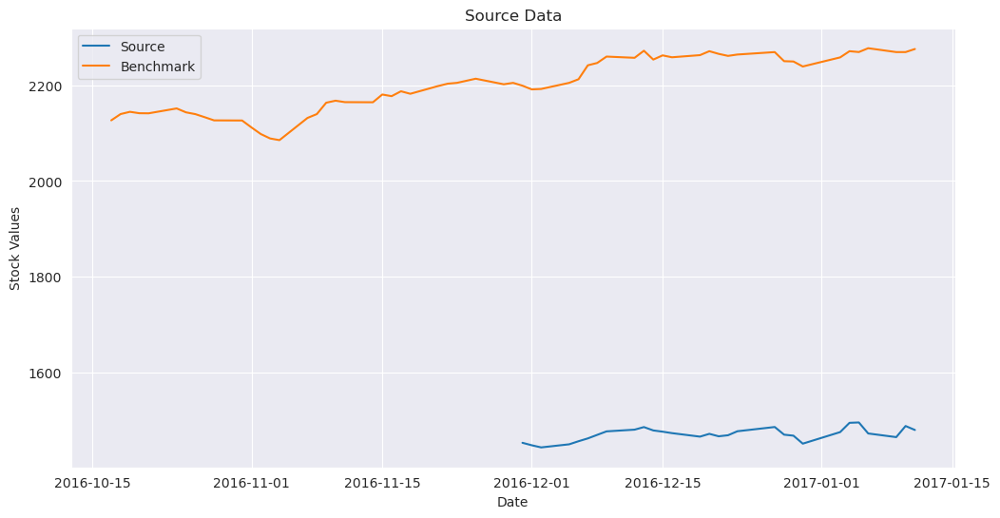


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.519773
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.704565
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.574753
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.697899
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.469318
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.421493
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.350180
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

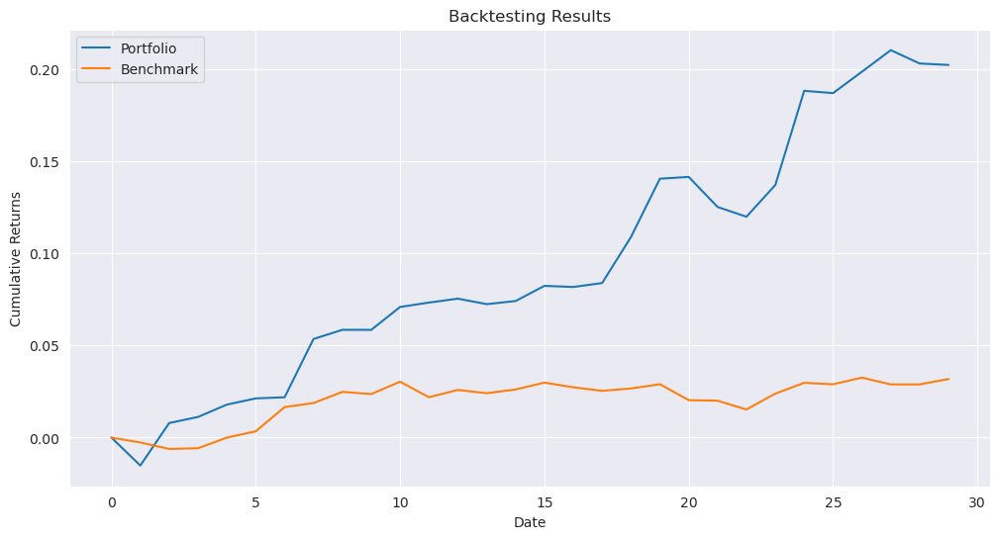

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_8_bf.pkl
initial date: 2021-08-25 00:00:00


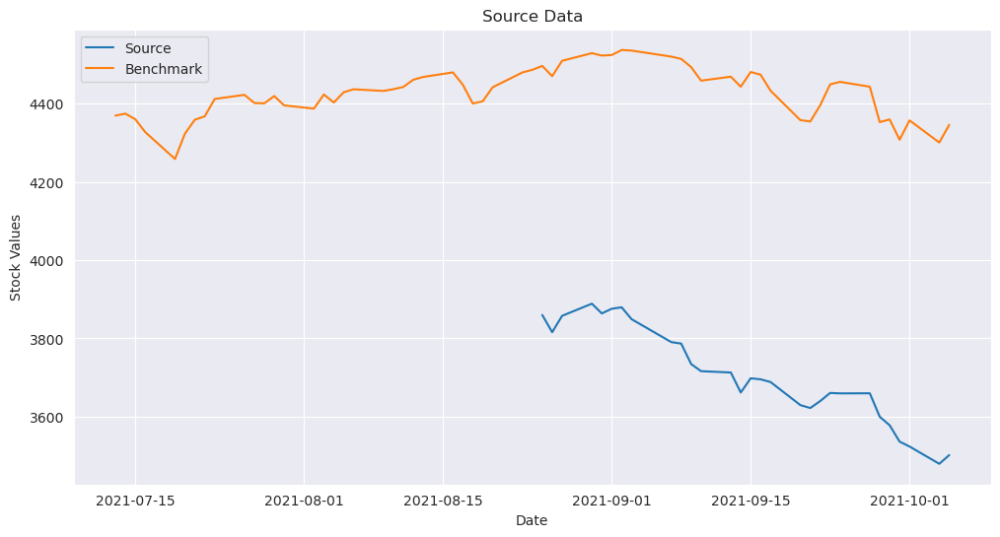


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.990000
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.644047
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.339697
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.319082
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.484290
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.490509
  Average weight: 0.090909
  Non-zero count: 11/11

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.693408
  Average weight: 0.090909
  Non-zero count: 11/11

Time 

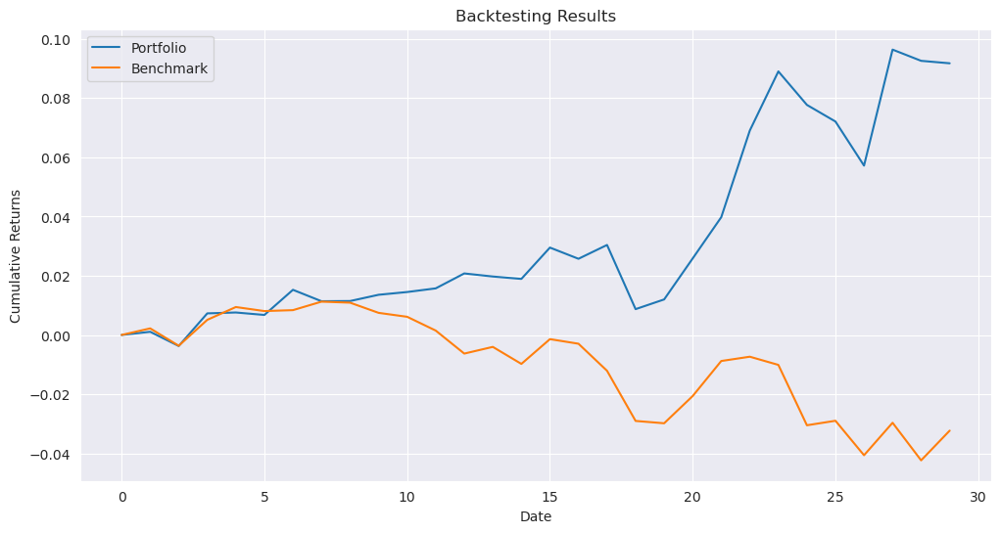

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_9_bf.pkl


In [28]:
opt_fun_bf = partial(scipy_slsqp_qubo)
results_path_bf_10 = '../../results/qubo_unrestricted/results_10_{}_bf.pkl'
_ = run_experiment(results_path_bf_10, data_10, benchmark, opt_fun_bf, parameters)

#### HRP

initial date: 2016-03-08 00:00:00


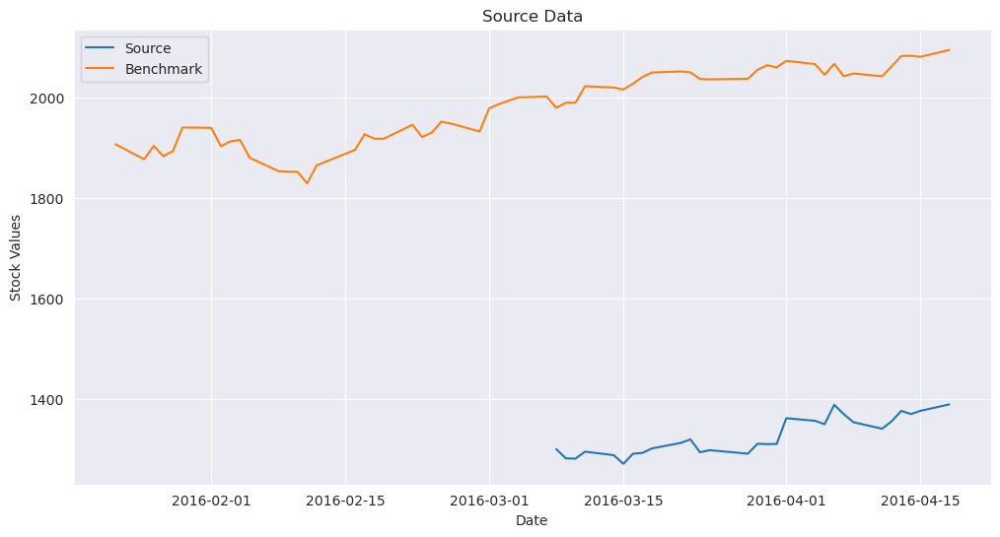

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

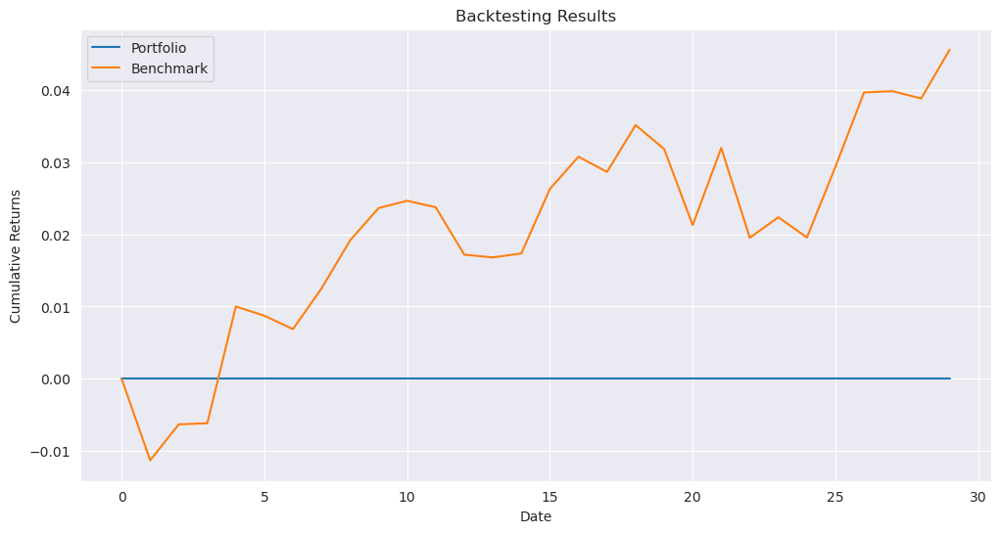

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_0_hrp.pkl
initial date: 2021-06-04 00:00:00


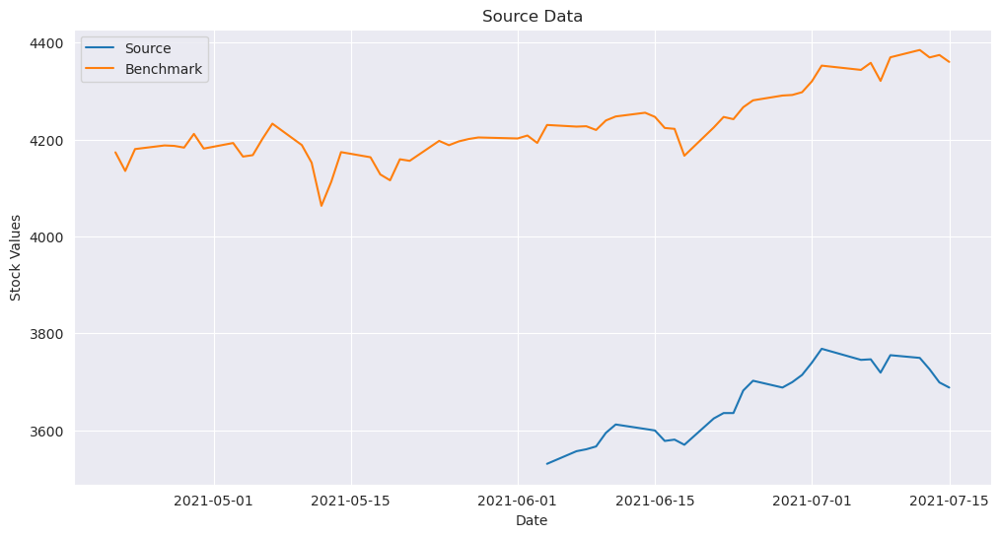

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

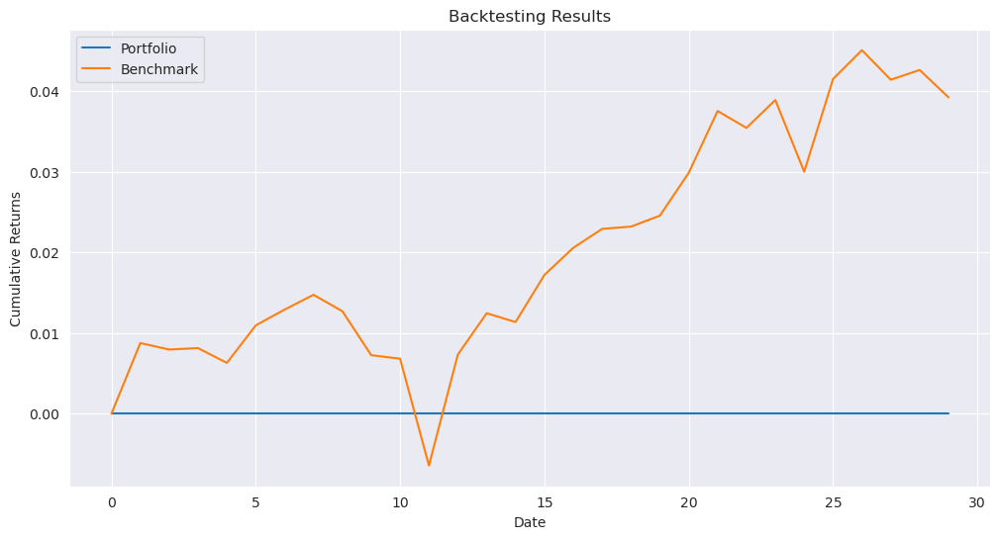

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_1_hrp.pkl
initial date: 2024-03-05 00:00:00


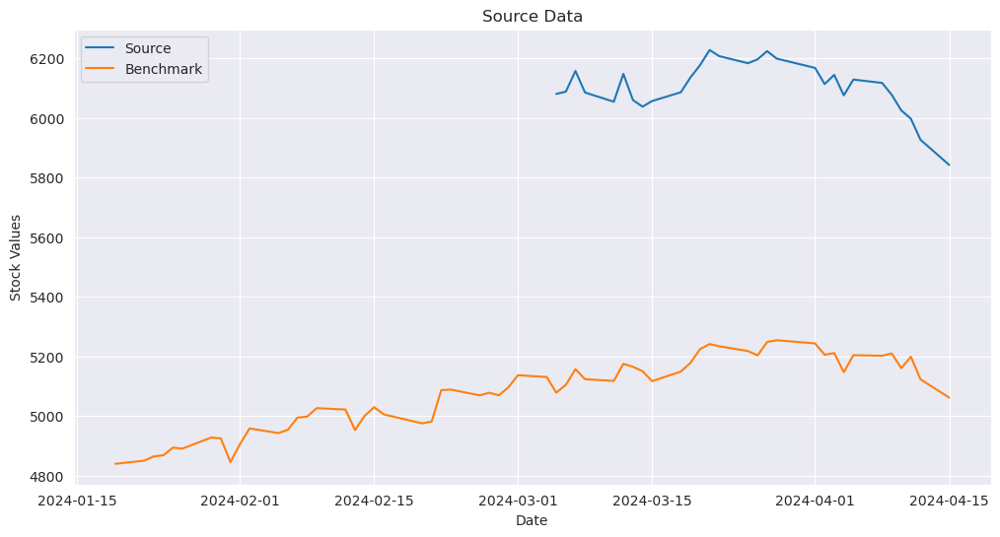

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

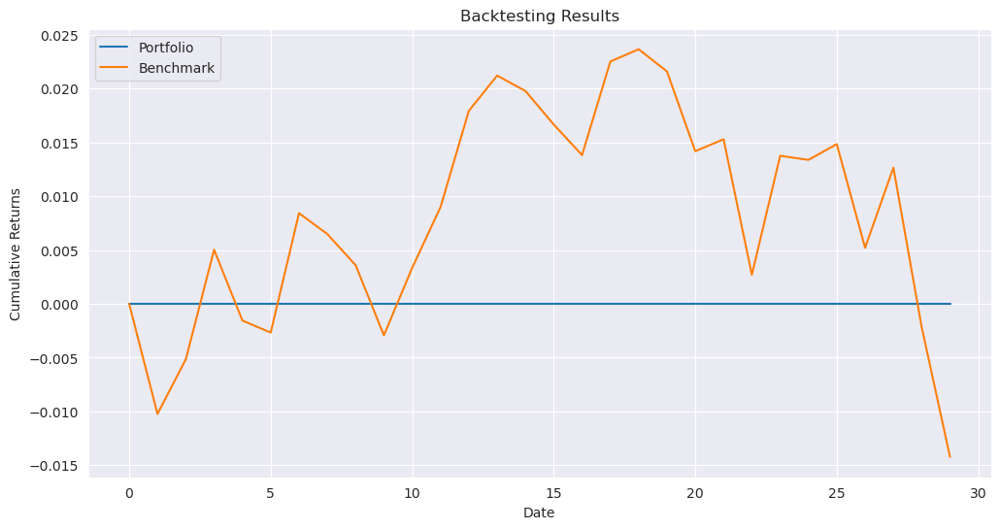

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_2_hrp.pkl
initial date: 2020-06-25 00:00:00


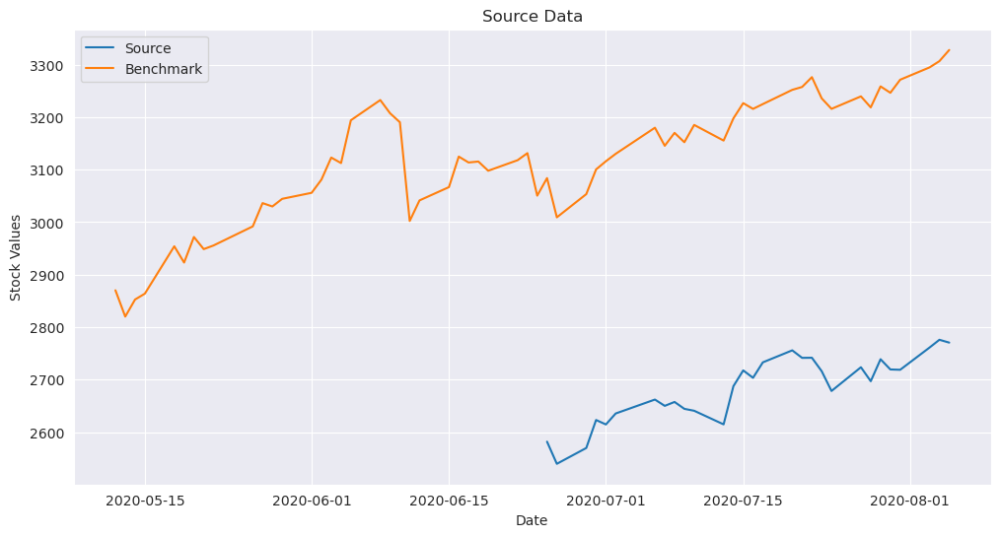

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

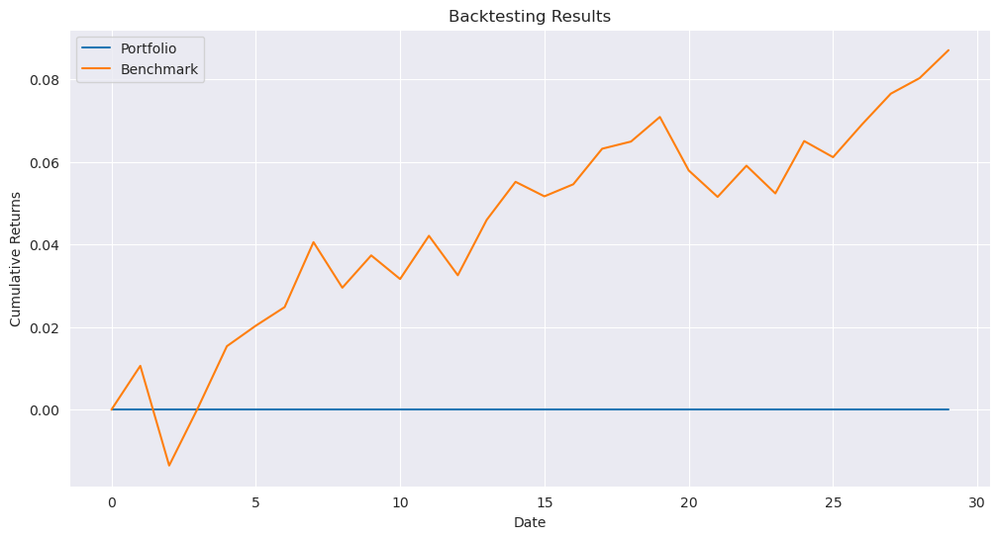

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_3_hrp.pkl
initial date: 2024-06-07 00:00:00


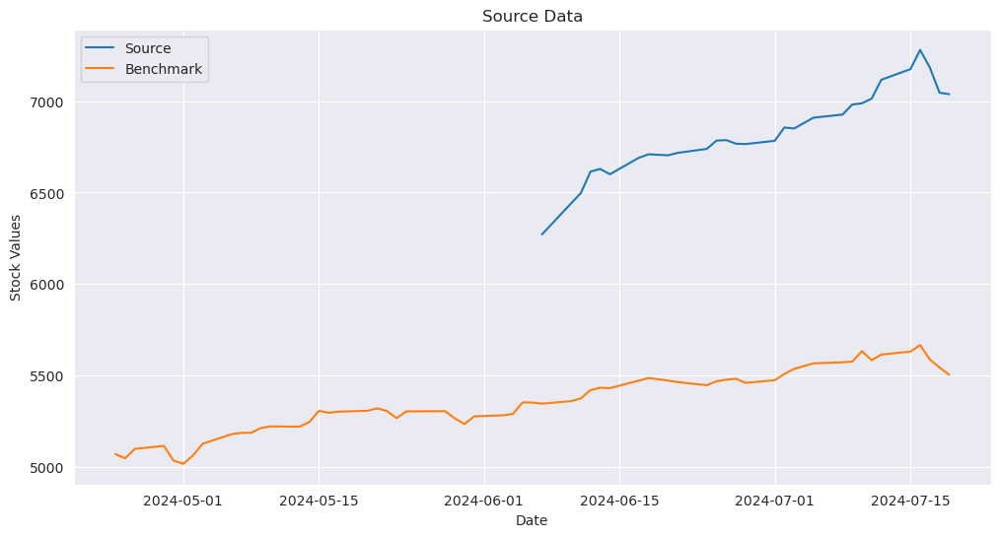

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

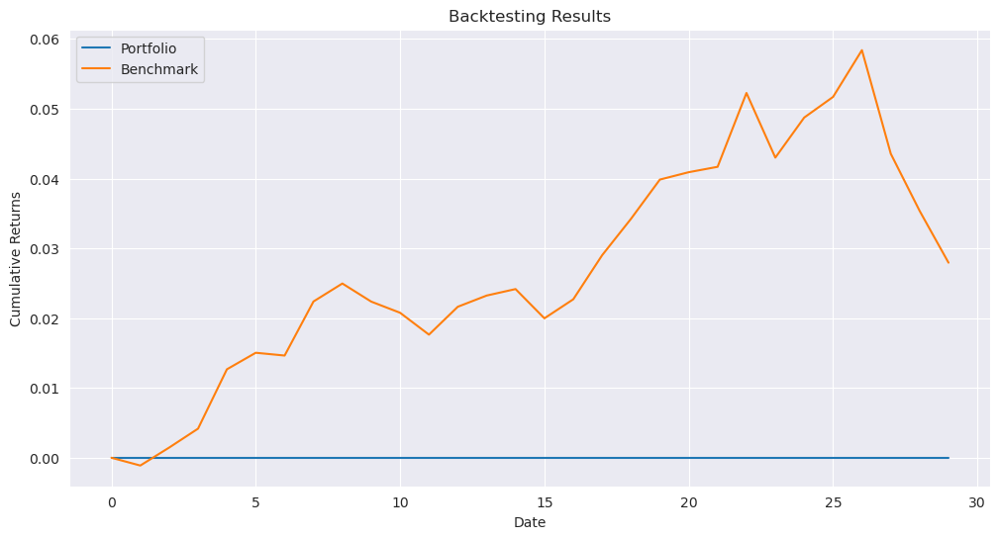

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_4_hrp.pkl
initial date: 2014-02-07 00:00:00


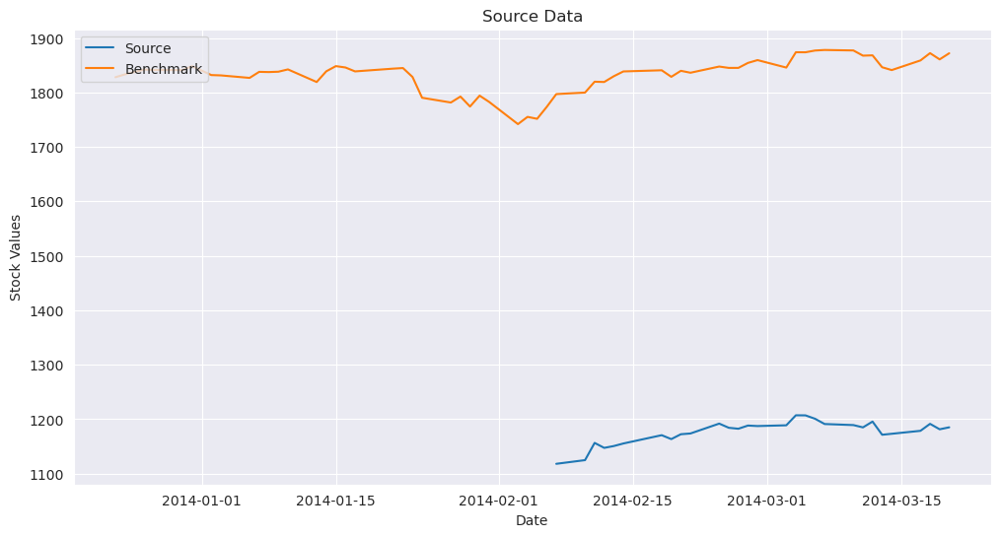

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

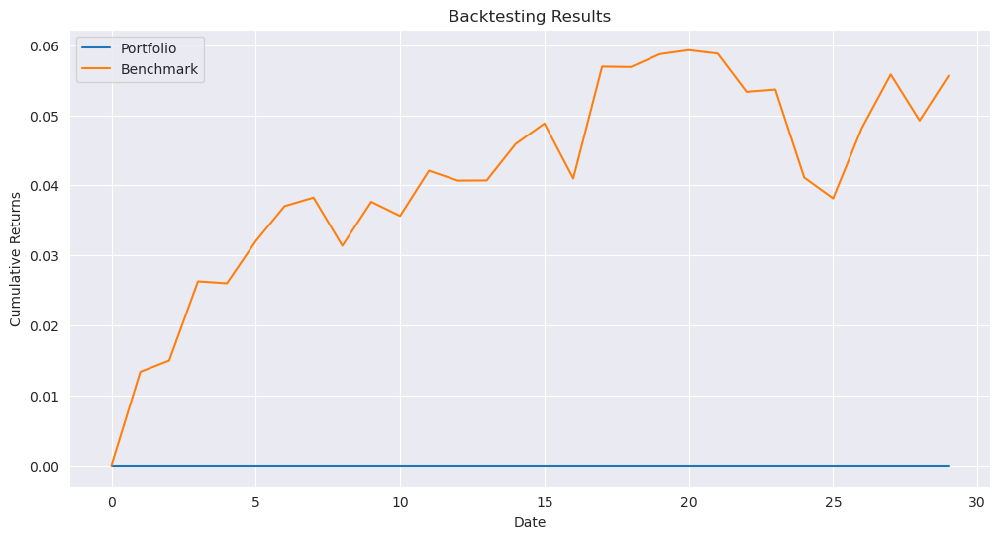

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_5_hrp.pkl
initial date: 2016-04-21 00:00:00


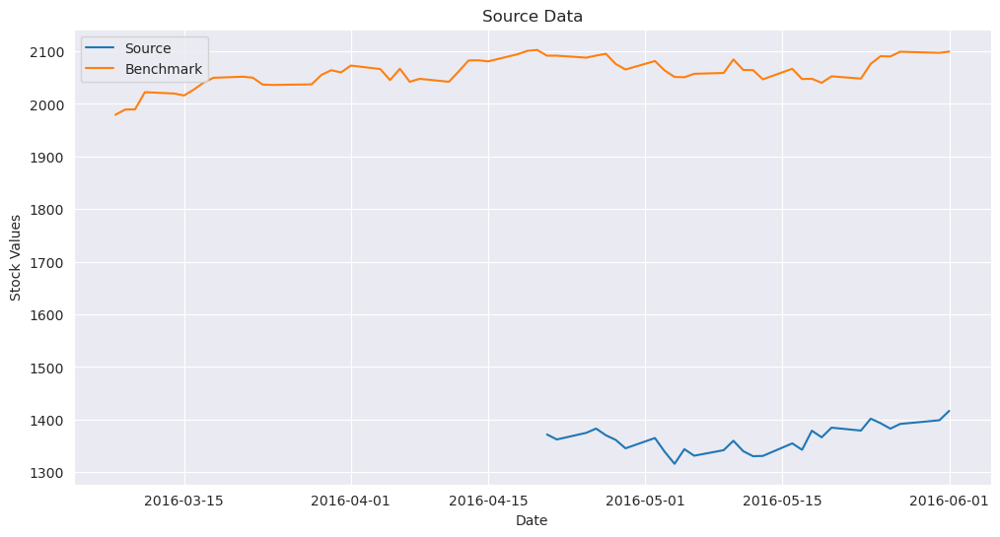

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'



Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero cou

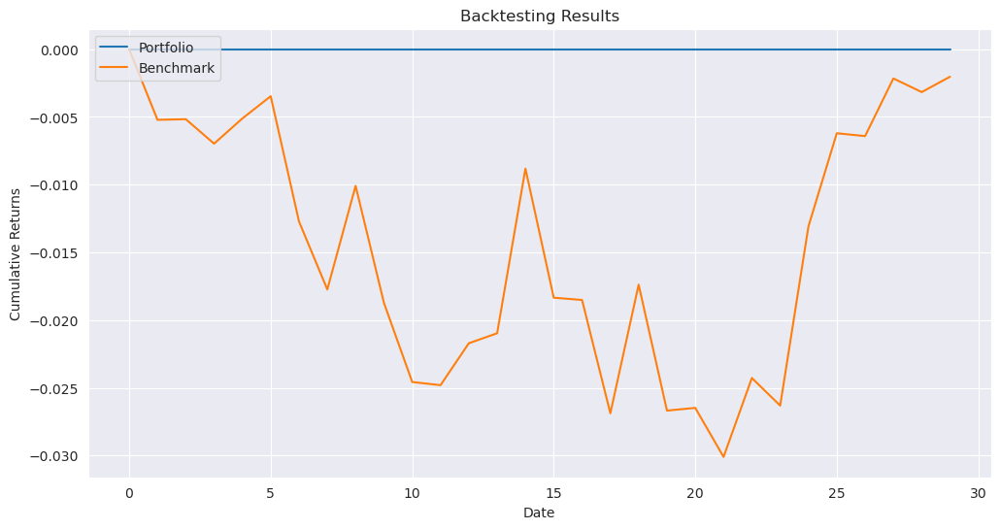

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_6_hrp.pkl
initial date: 2020-05-11 00:00:00


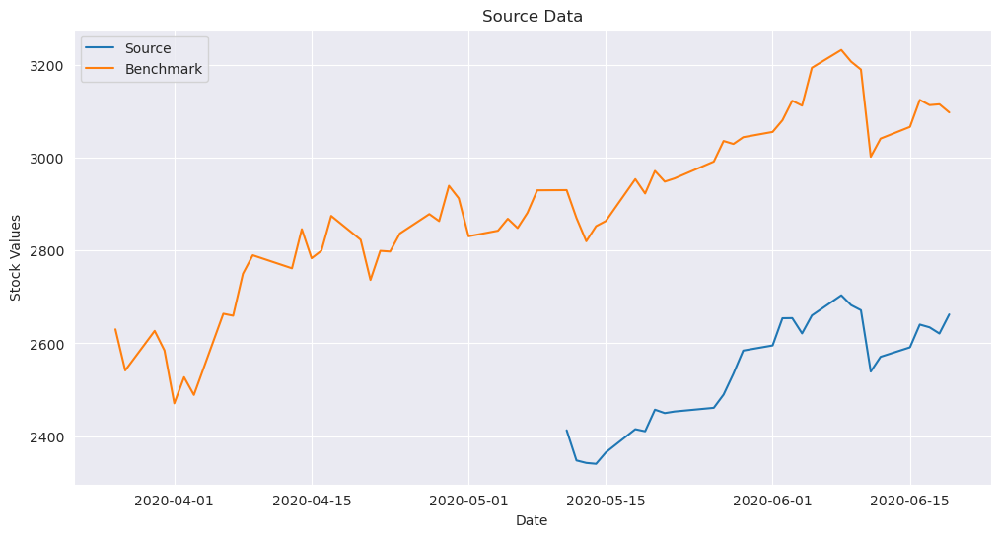

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

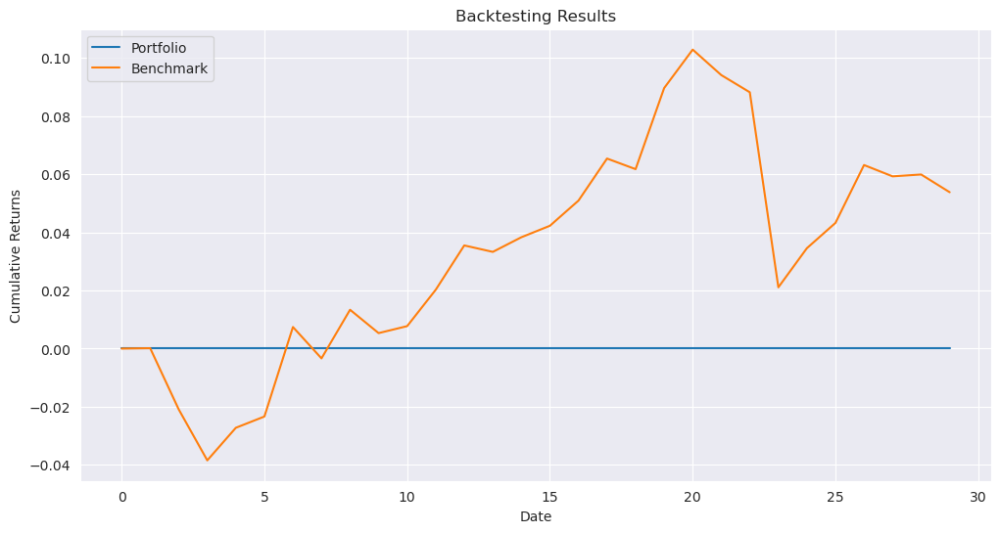

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_7_hrp.pkl
initial date: 2016-11-30 00:00:00


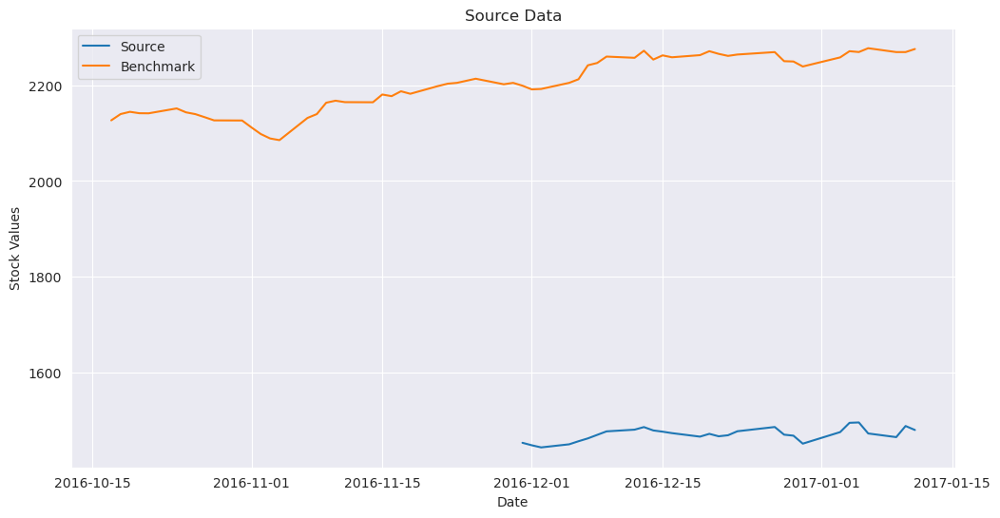

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero coun

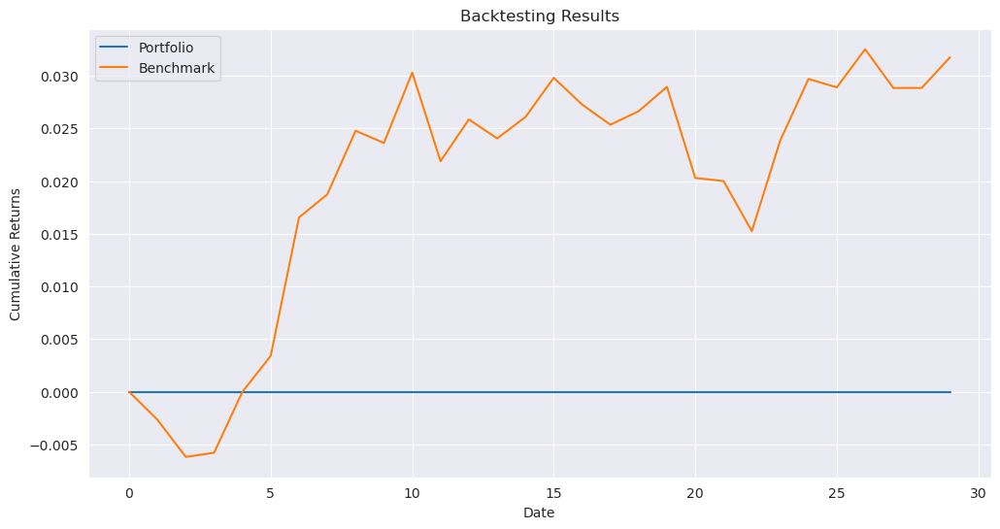

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_8_hrp.pkl
initial date: 2021-08-25 00:00:00


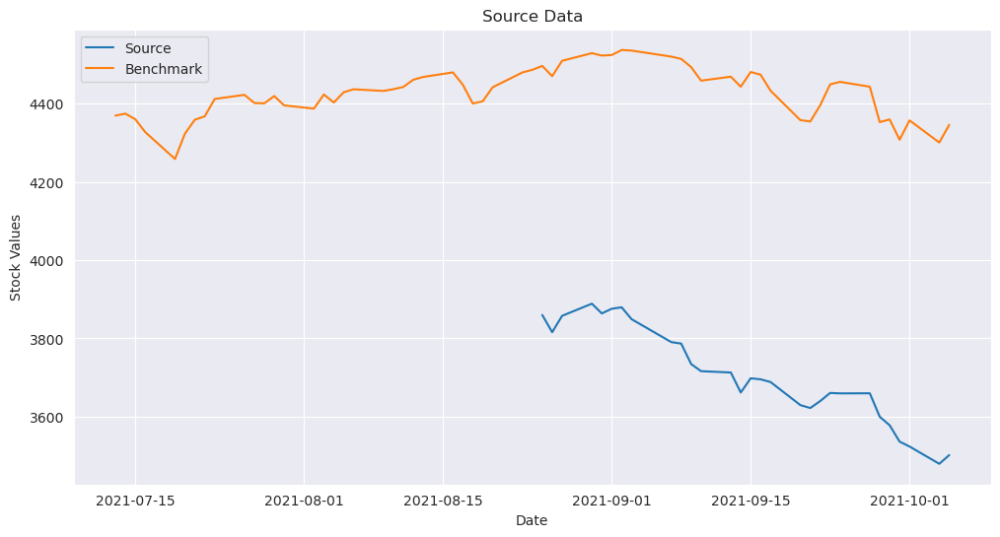

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'



Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio 


Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/11

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero c

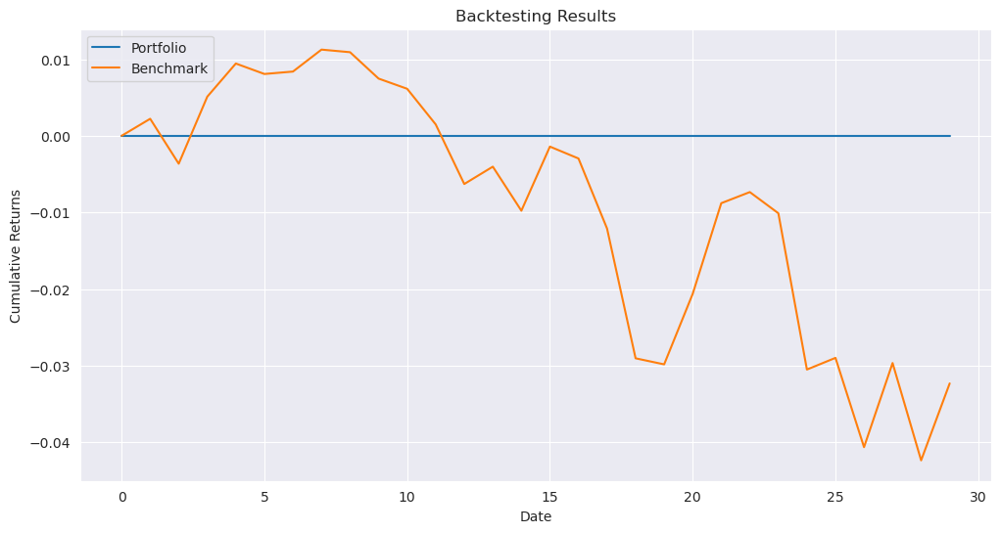

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_10_9_hrp.pkl


In [29]:
opt_fun_hrp = partial(riskfolio_qubo)
results_path = '../../results/qubo_unrestricted/results_10_{}_hrp.pkl'
_ = run_experiment(results_path, data_10, benchmark, opt_fun_hrp, parameters)

#### Trio comparison for Easy Test

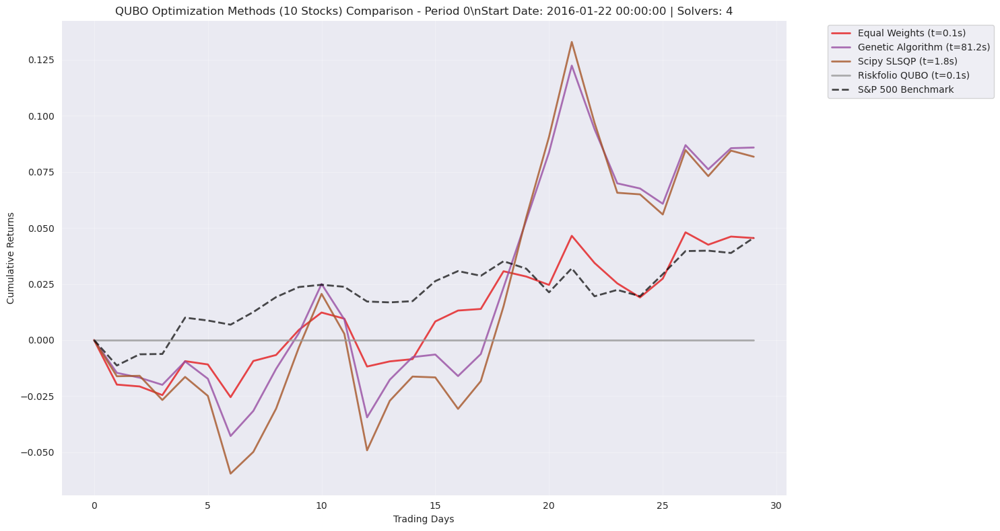

\nPeriod 0 Summary:
--------------------------------------------------
Equal Weights            :   0.0455 (  0.10s)
Genetic Algorithm        :   0.0858 ( 81.15s)
Scipy SLSQP              :   0.0817 (  1.81s)
Riskfolio QUBO           :   0.0000 (  0.14s)
Benchmark                :   0.0456



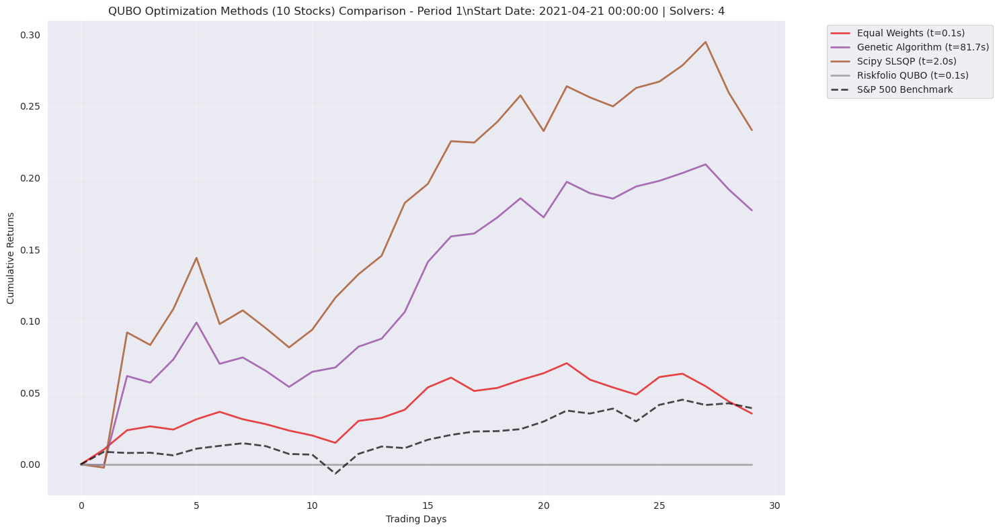

\nPeriod 1 Summary:
--------------------------------------------------
Equal Weights            :   0.0355 (  0.10s)
Genetic Algorithm        :   0.1772 ( 81.74s)
Scipy SLSQP              :   0.2332 (  1.96s)
Riskfolio QUBO           :   0.0000 (  0.13s)
Benchmark                :   0.0392



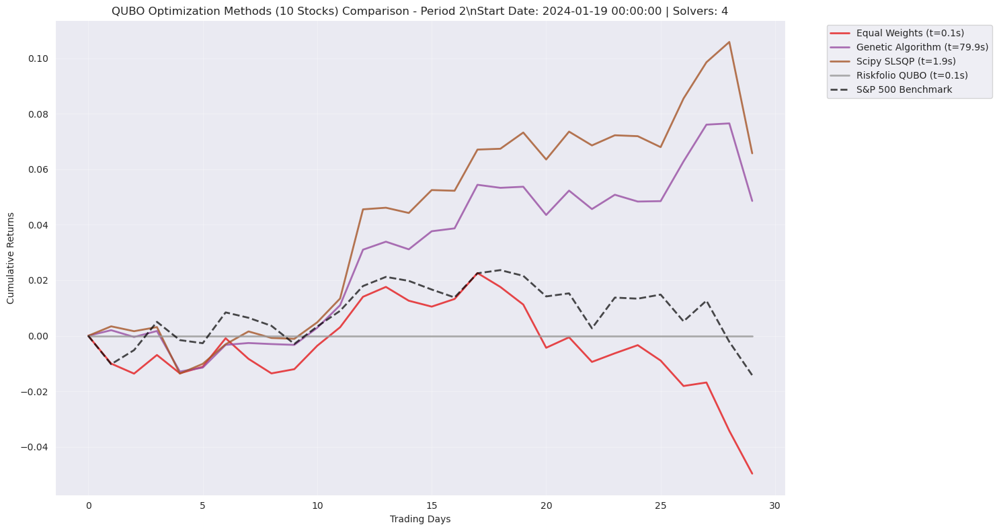

\nPeriod 2 Summary:
--------------------------------------------------
Equal Weights            :  -0.0496 (  0.10s)
Genetic Algorithm        :   0.0486 ( 79.88s)
Scipy SLSQP              :   0.0657 (  1.87s)
Riskfolio QUBO           :   0.0000 (  0.14s)
Benchmark                :  -0.0142



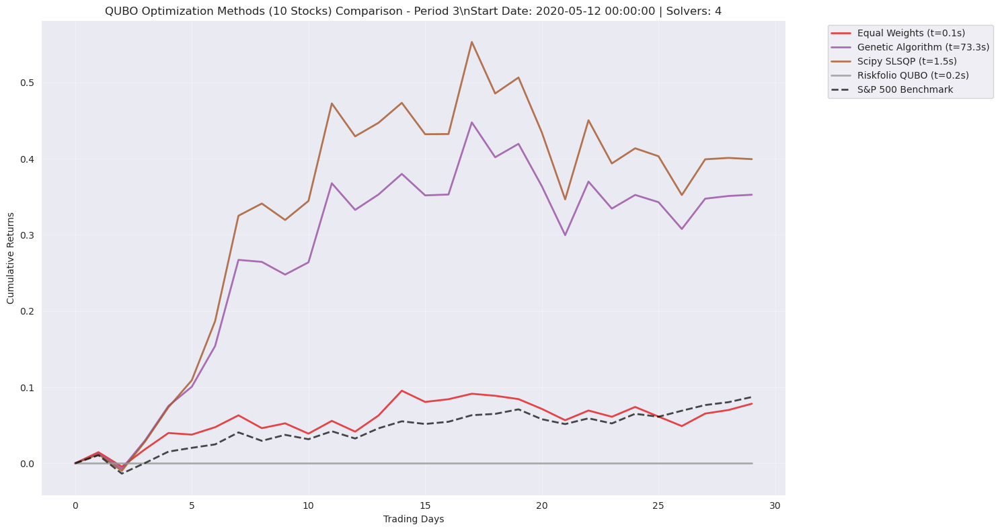

\nPeriod 3 Summary:
--------------------------------------------------
Equal Weights            :   0.0783 (  0.09s)
Genetic Algorithm        :   0.3527 ( 73.32s)
Scipy SLSQP              :   0.3995 (  1.51s)
Riskfolio QUBO           :   0.0000 (  0.15s)
Benchmark                :   0.0870



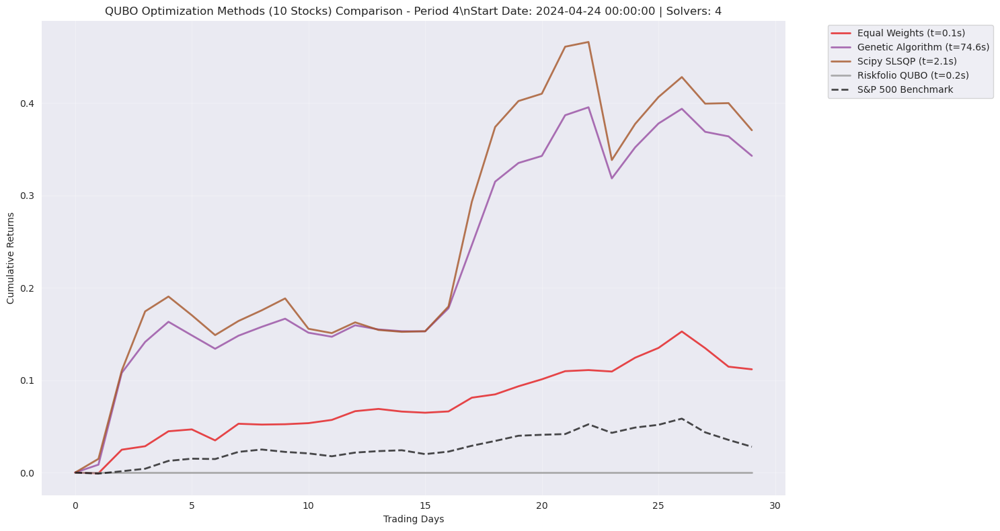

\nPeriod 4 Summary:
--------------------------------------------------
Equal Weights            :   0.1118 (  0.10s)
Genetic Algorithm        :   0.3428 ( 74.61s)
Scipy SLSQP              :   0.3705 (  2.13s)
Riskfolio QUBO           :   0.0000 (  0.16s)
Benchmark                :   0.0279



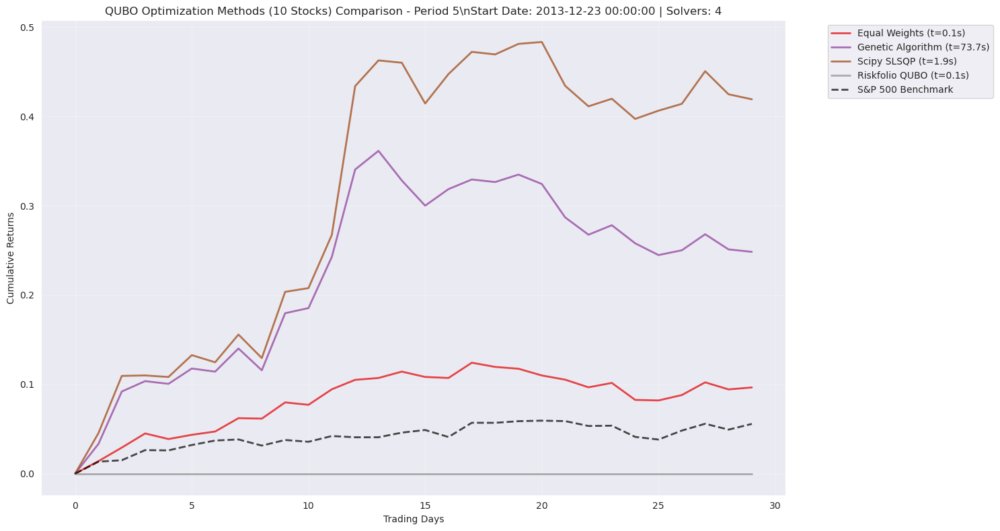

\nPeriod 5 Summary:
--------------------------------------------------
Equal Weights            :   0.0965 (  0.10s)
Genetic Algorithm        :   0.2483 ( 73.71s)
Scipy SLSQP              :   0.4192 (  1.87s)
Riskfolio QUBO           :   0.0000 (  0.13s)
Benchmark                :   0.0556



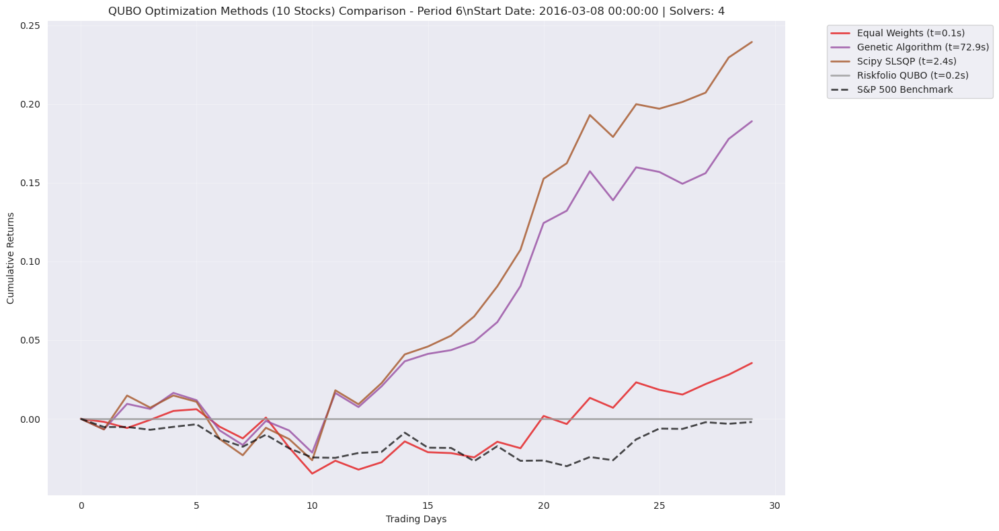

\nPeriod 6 Summary:
--------------------------------------------------
Equal Weights            :   0.0355 (  0.10s)
Genetic Algorithm        :   0.1890 ( 72.91s)
Scipy SLSQP              :   0.2394 (  2.44s)
Riskfolio QUBO           :   0.0000 (  0.15s)
Benchmark                :  -0.0020



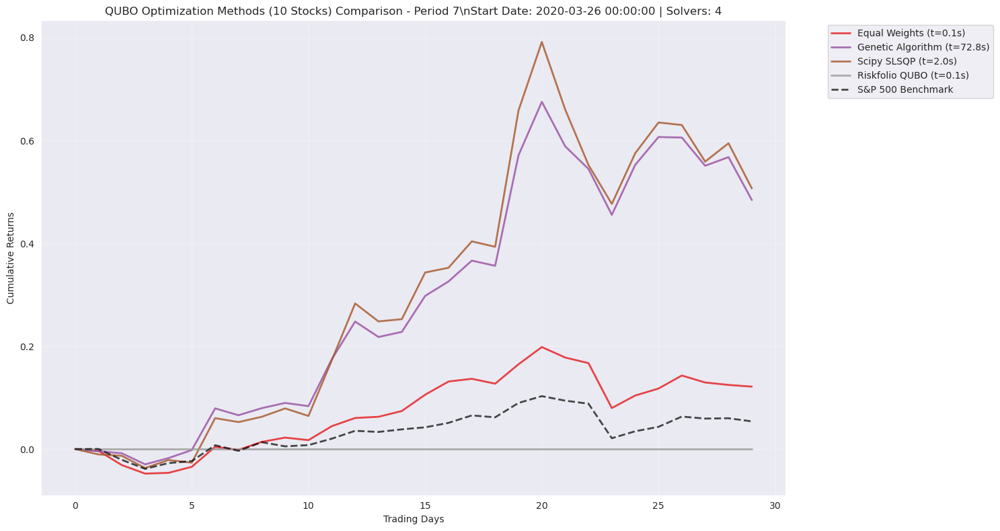

\nPeriod 7 Summary:
--------------------------------------------------
Equal Weights            :   0.1215 (  0.10s)
Genetic Algorithm        :   0.4842 ( 72.80s)
Scipy SLSQP              :   0.5069 (  2.03s)
Riskfolio QUBO           :   0.0000 (  0.15s)
Benchmark                :   0.0538



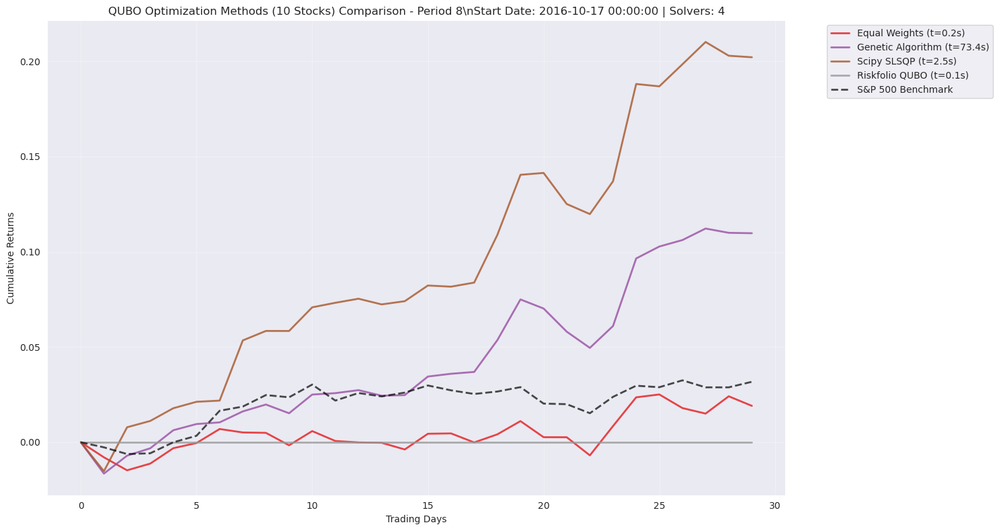

\nPeriod 8 Summary:
--------------------------------------------------
Equal Weights            :   0.0191 (  0.19s)
Genetic Algorithm        :   0.1097 ( 73.41s)
Scipy SLSQP              :   0.2021 (  2.49s)
Riskfolio QUBO           :   0.0000 (  0.13s)
Benchmark                :   0.0317



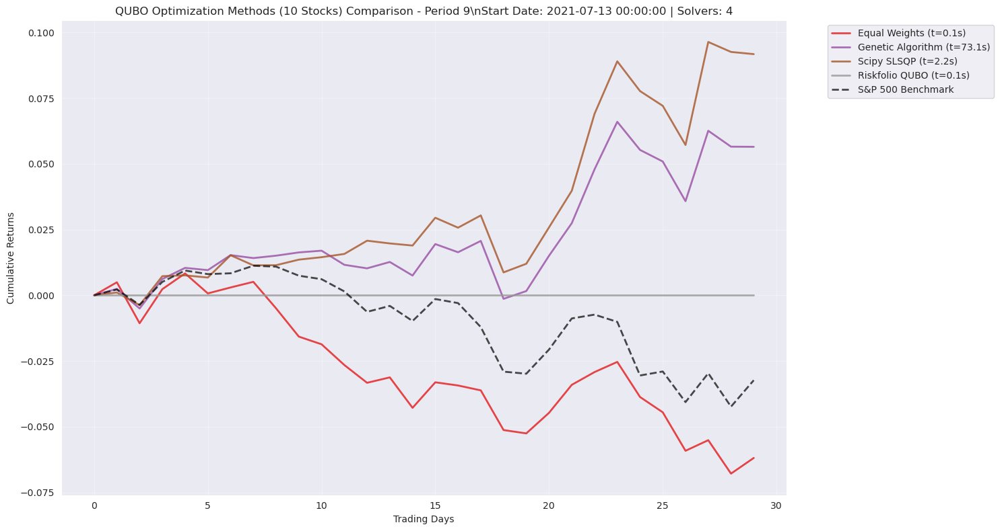

\nPeriod 9 Summary:
--------------------------------------------------
Equal Weights            :  -0.0619 (  0.11s)
Genetic Algorithm        :   0.0565 ( 73.12s)
Scipy SLSQP              :   0.0918 (  2.18s)
Riskfolio QUBO           :   0.0000 (  0.12s)
Benchmark                :  -0.0323

\n================================================================================
PERFORMANCE SUMMARY - QUBO Methods (10 Stocks)


,Solver,Periods,Avg_Return,Std_Return,Min_Return,Max_Return,Avg_Time,Std_Time,Success_Rate
2,Scipy SLSQP,10,0.2610,0.1484,0.0657,0.5069,2.0290,0.2816,100.0
1,Genetic Algorithm,10,0.2095,0.1383,0.0486,0.4842,75.6658,3.5007,100.0
0,Equal Weights,10,0.0432,0.0594,-0.0619,0.1215,0.1091,0.0282,100.0
3,Riskfolio QUBO,10,0.0000,0.0000,0.0000,0.0000,0.1408,0.0111,100.0


\nPerformance Analysis:
--------------------------------------------------
Methods compared: 4
Best performer: Scipy SLSQP (avg return: 0.2610)
Fastest method: Equal Weights (0.11s)
Most reliable: Equal Weights (100.0%)


In [30]:
# Complete comparison including Quantum for Easy Test (10 stocks)
easy_test_solvers = [
    {'path_template': '../../results/qubo_unrestricted/results_10_{}_ew.pkl', 'name': 'Equal Weights'},
    {'path_template': '../../results/qubo_unrestricted/results_10_{}_ga.pkl', 'name': 'Genetic Algorithm'},
    {'path_template': '../../results/qubo_unrestricted/results_10_{}_bf.pkl', 'name': 'Scipy SLSQP'},
    {'path_template': '../../results/qubo_unrestricted/results_10_{}_hrp.pkl', 'name': 'Riskfolio QUBO'},
]

n_periods = parameters['n_periods']
multi_comparison(easy_test_solvers, n_periods, "QUBO Optimization Methods (10 Stocks)")

# Generate performance summary
print("\\n" + "="*80)
print("PERFORMANCE SUMMARY - QUBO Methods (10 Stocks)")
print("="*80)
summary_df = performance_summary(easy_test_solvers, n_periods)
if not summary_df.empty:
    # Sort by average return for better readability
    summary_df_sorted = summary_df.sort_values('Avg_Return', ascending=False)
    display(summary_df_sorted)
    
    # Performance analysis
    print("\\nPerformance Analysis:")
    print("-" * 50)
    print(f"Methods compared: {len(summary_df)}")
    print(f"Best performer: {summary_df_sorted.iloc[0]['Solver']} (avg return: {summary_df_sorted.iloc[0]['Avg_Return']:.4f})")
    print(f"Fastest method: {summary_df.loc[summary_df['Avg_Time'].idxmin(), 'Solver']} ({summary_df['Avg_Time'].min():.2f}s)")
    print(f"Most reliable: {summary_df.loc[summary_df['Success_Rate'].idxmax(), 'Solver']} ({summary_df['Success_Rate'].max():.1f}%)")
else:
    print("No summary data available")

### Medium test: Optimization with 100 stocks

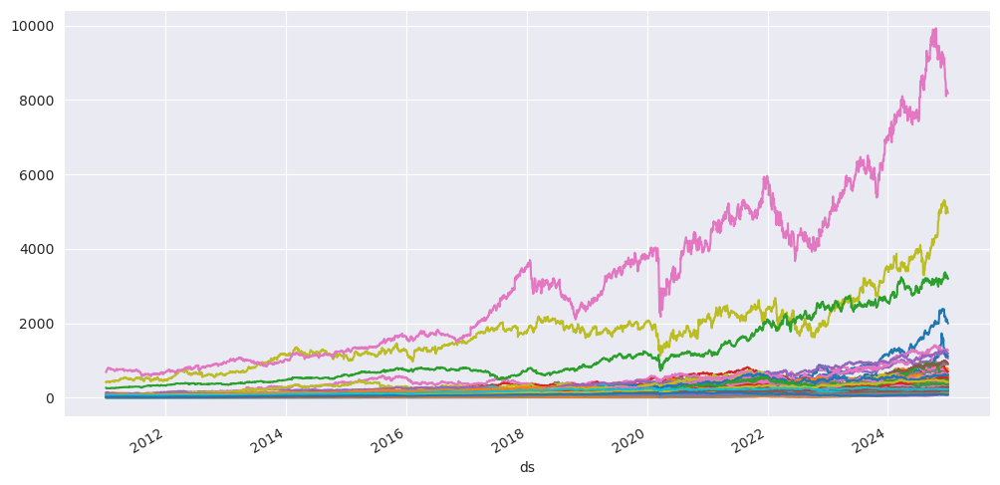

In [31]:
data_100 = source[select_100]
sns.set_style('darkgrid')
data_100.plot(figsize=(12,6))
plt.legend().remove()
plt.show()

#### Equal Weights Baseline

initial date: 2016-03-08 00:00:00


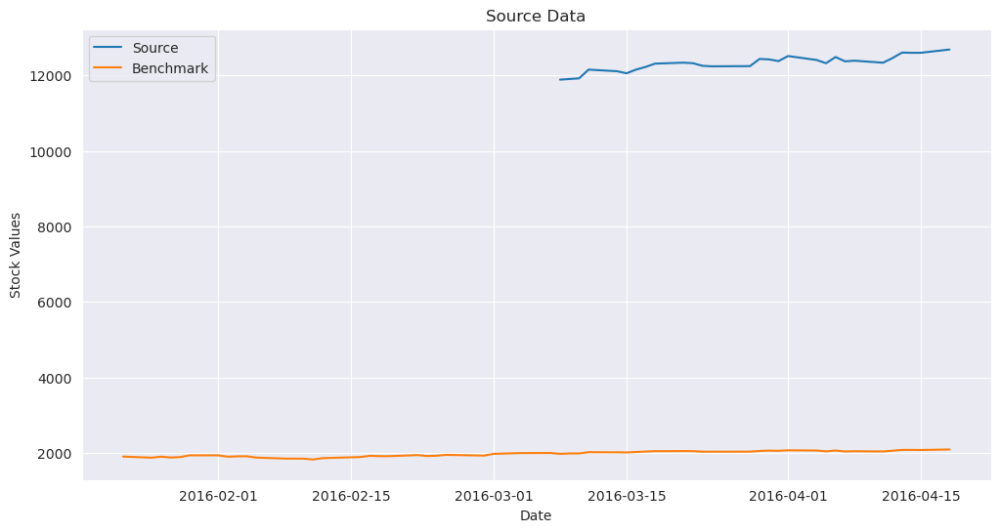


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

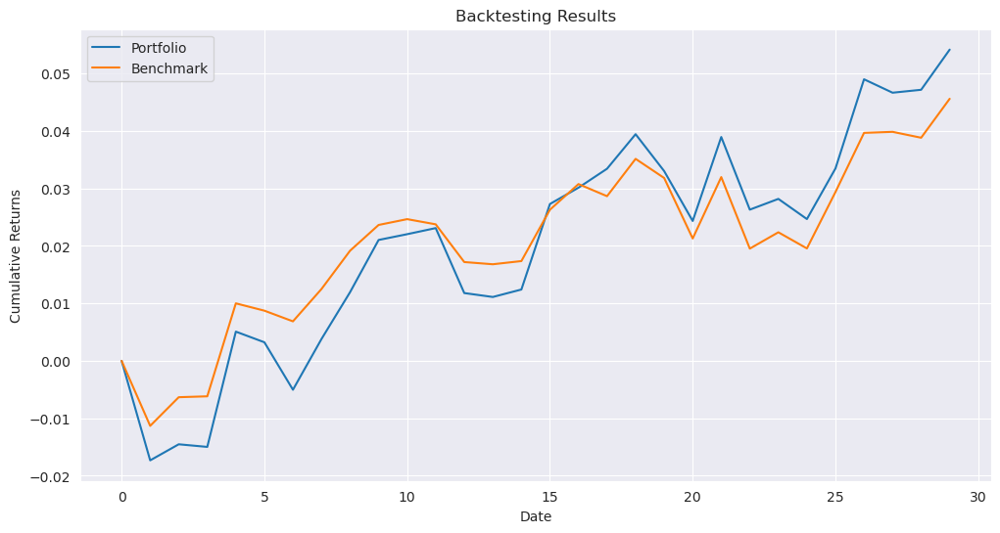

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_0_ew.pkl
initial date: 2021-06-04 00:00:00


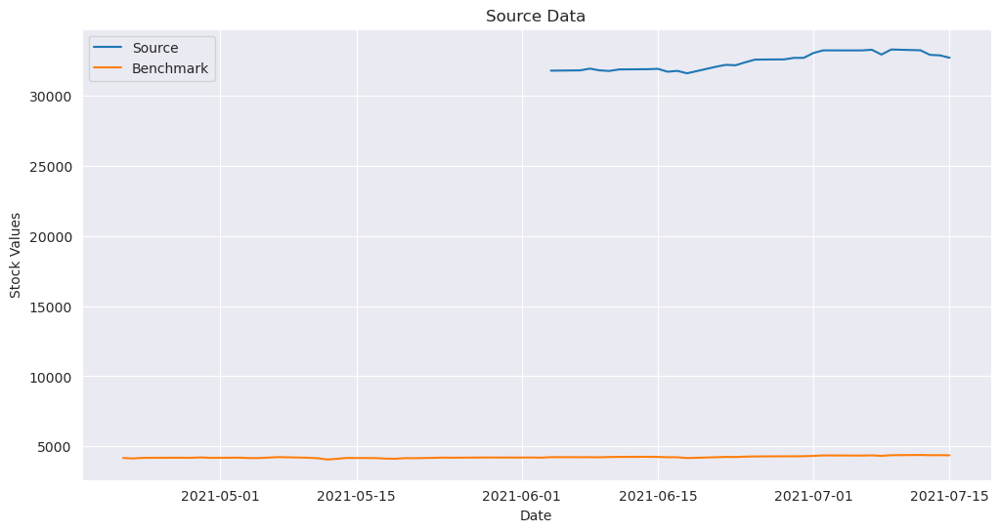


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

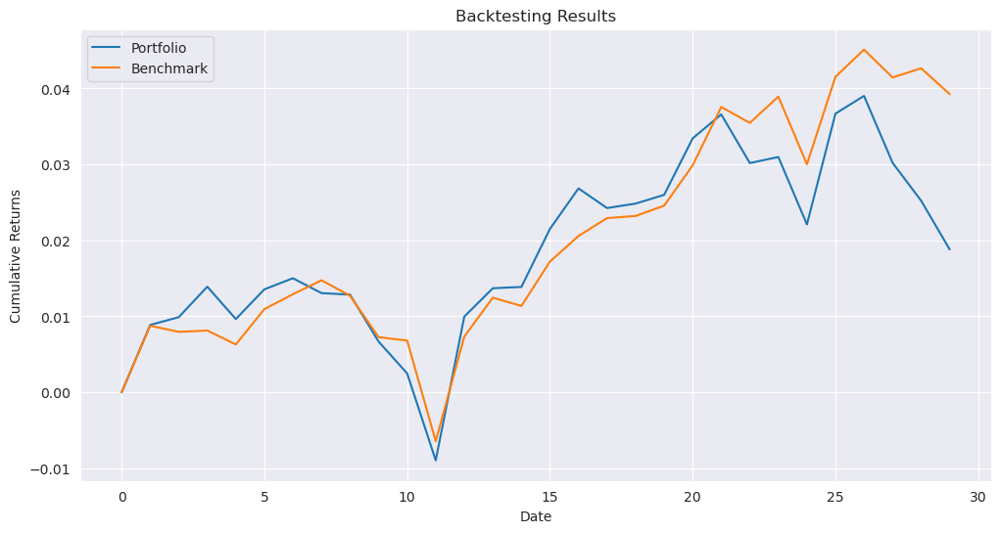

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_1_ew.pkl
initial date: 2024-03-05 00:00:00


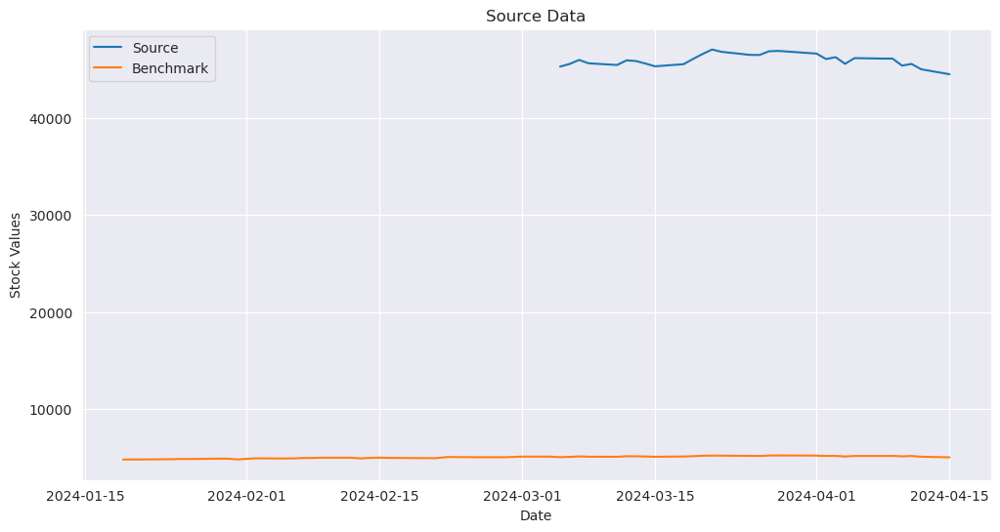


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

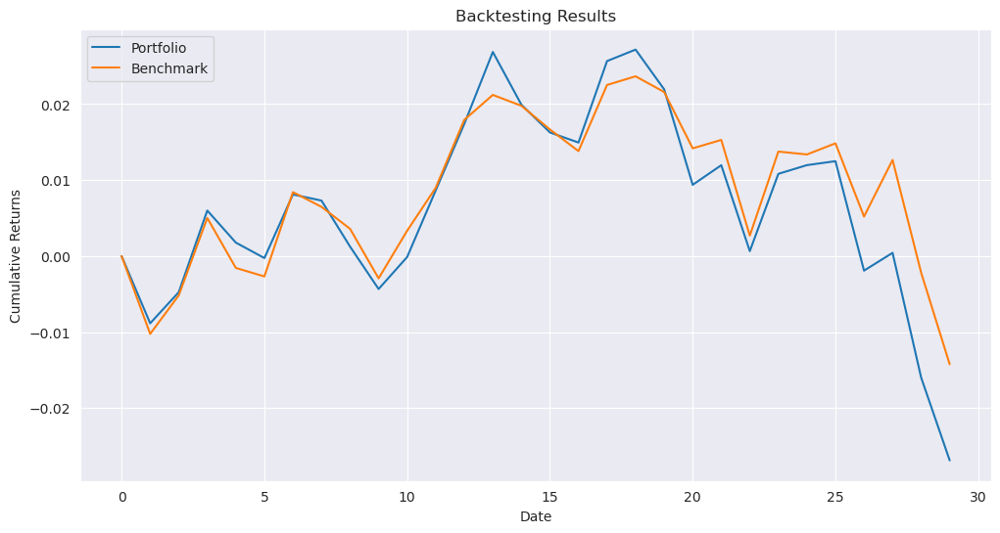

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_2_ew.pkl
initial date: 2020-06-25 00:00:00


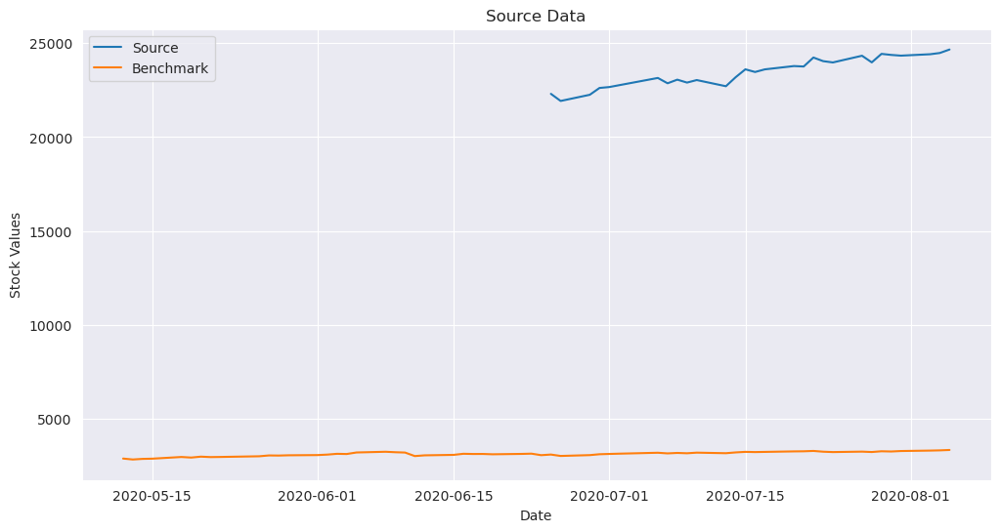


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

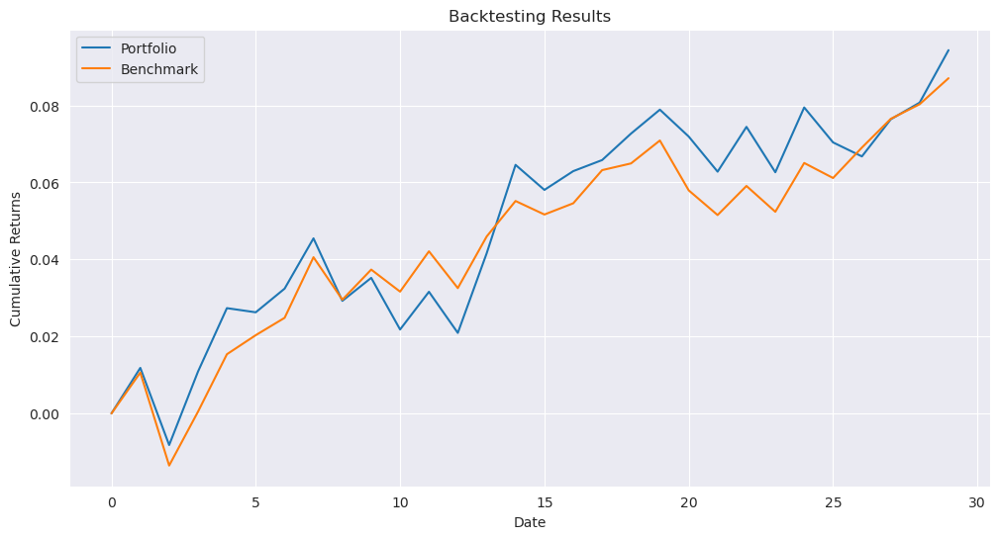

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_3_ew.pkl
initial date: 2024-06-07 00:00:00


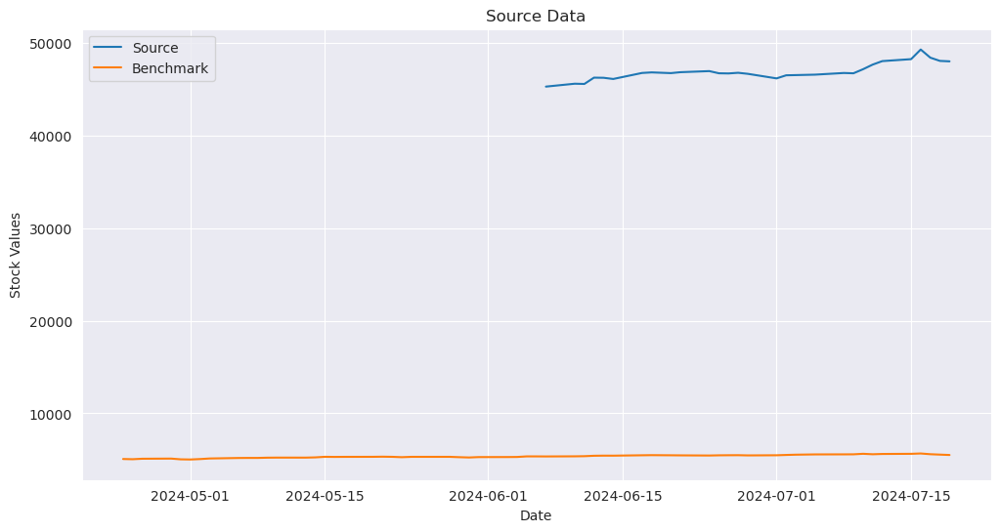


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

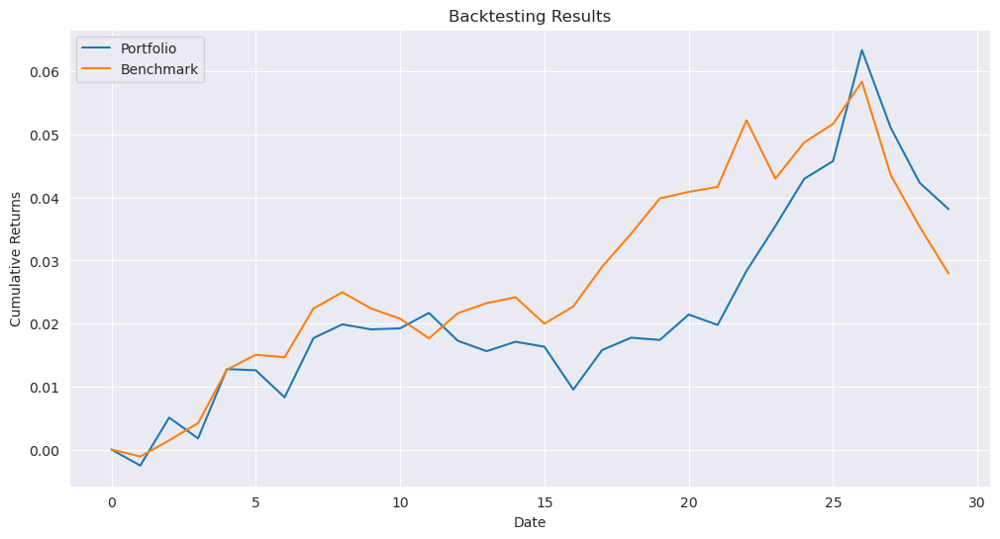

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_4_ew.pkl
initial date: 2014-02-07 00:00:00


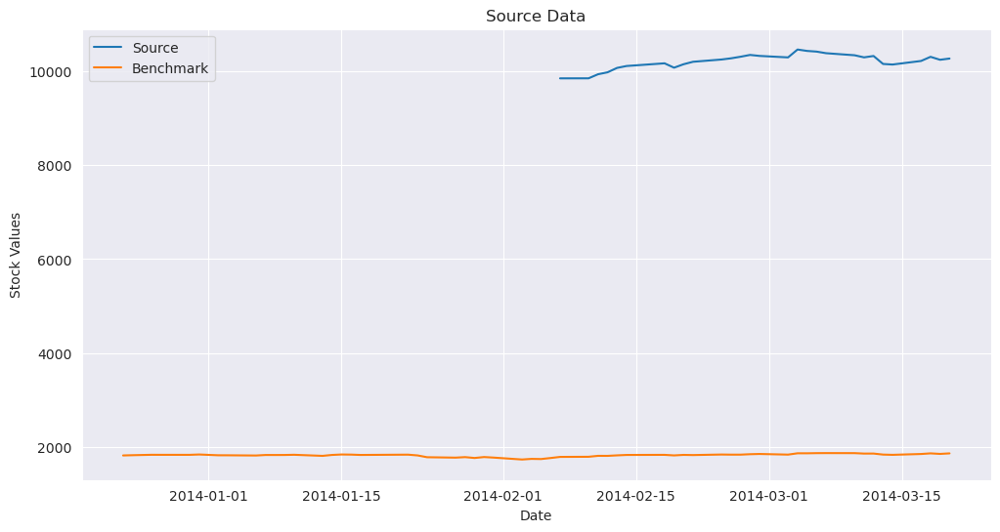


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

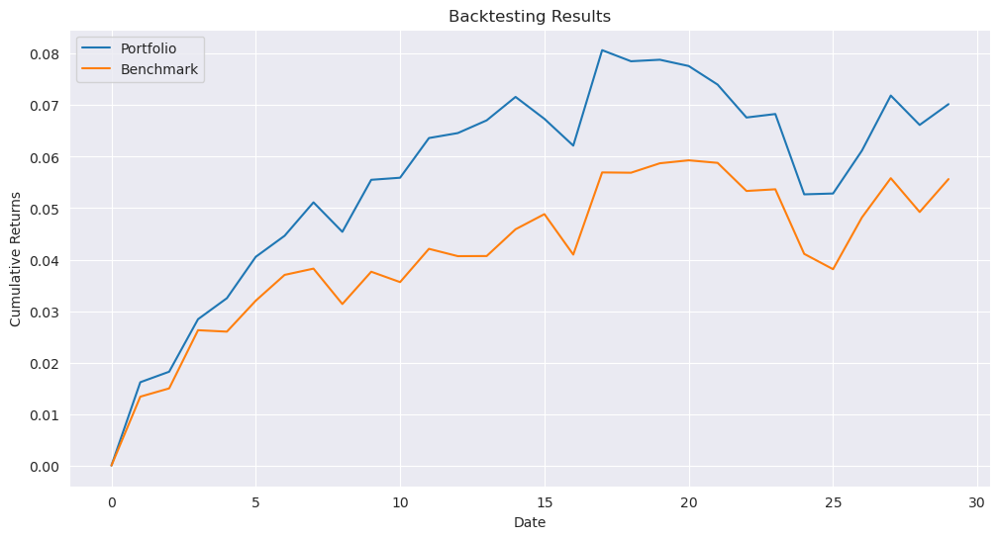

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_5_ew.pkl
initial date: 2016-04-21 00:00:00


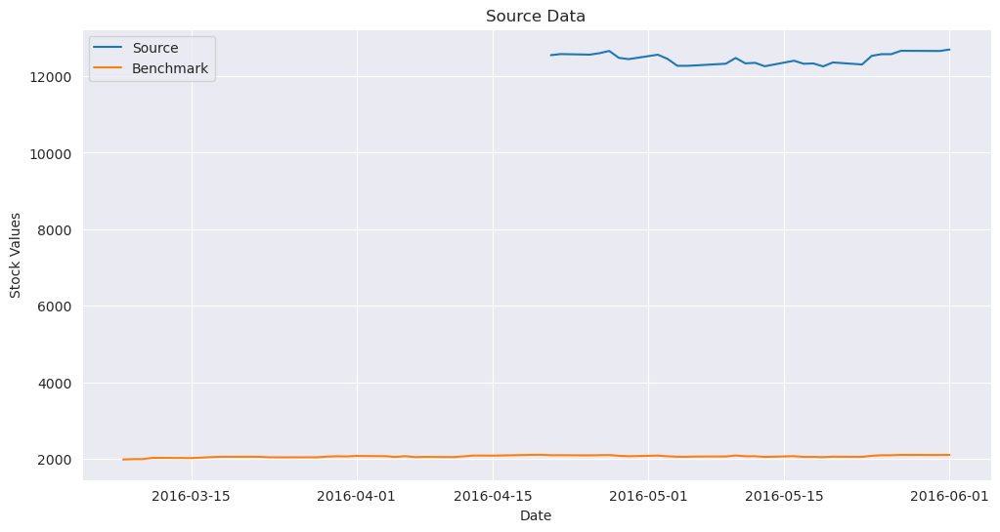


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

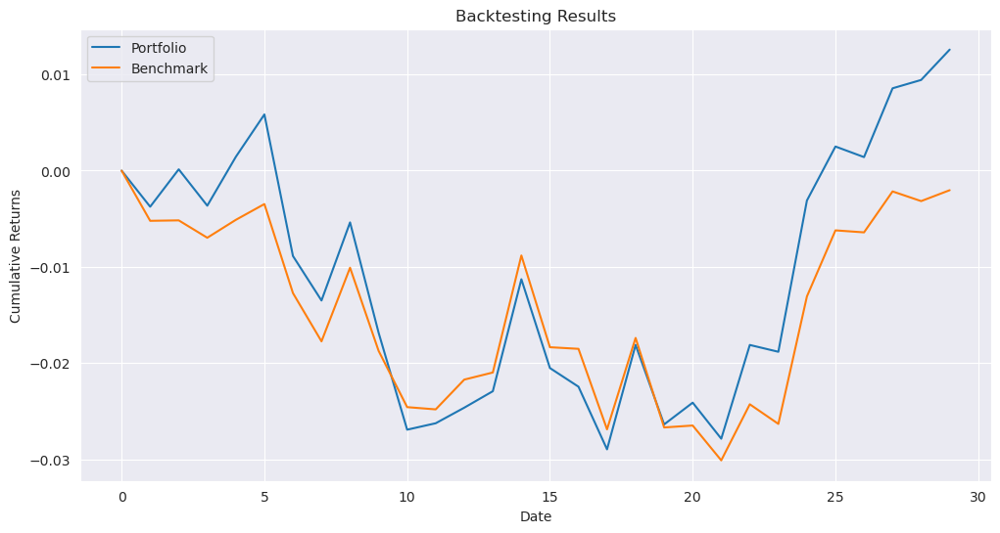

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_6_ew.pkl
initial date: 2020-05-11 00:00:00


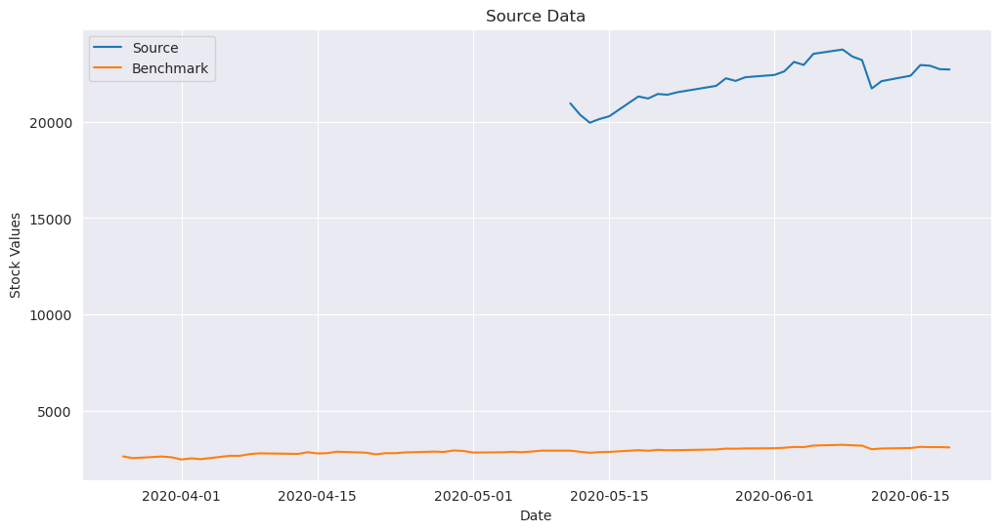


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

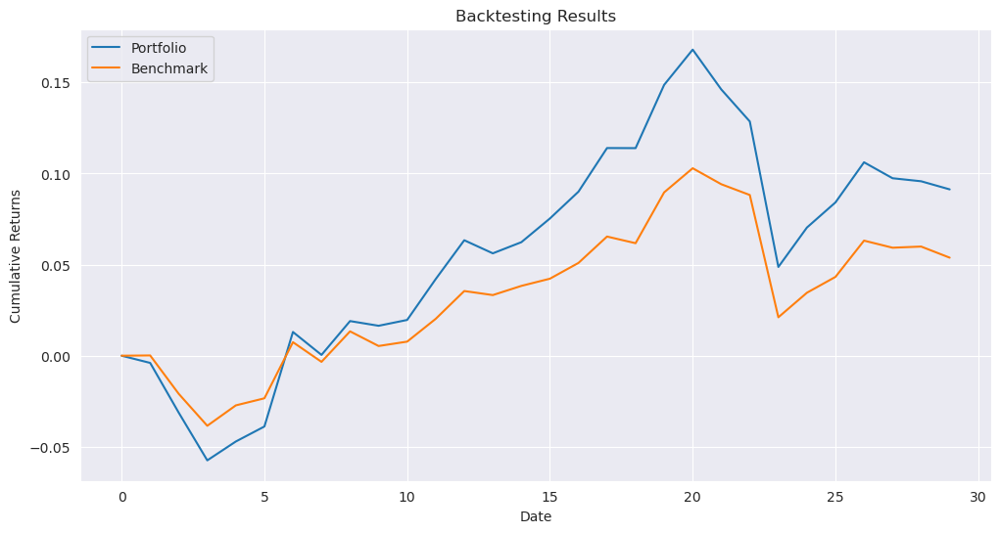

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_7_ew.pkl
initial date: 2016-11-30 00:00:00


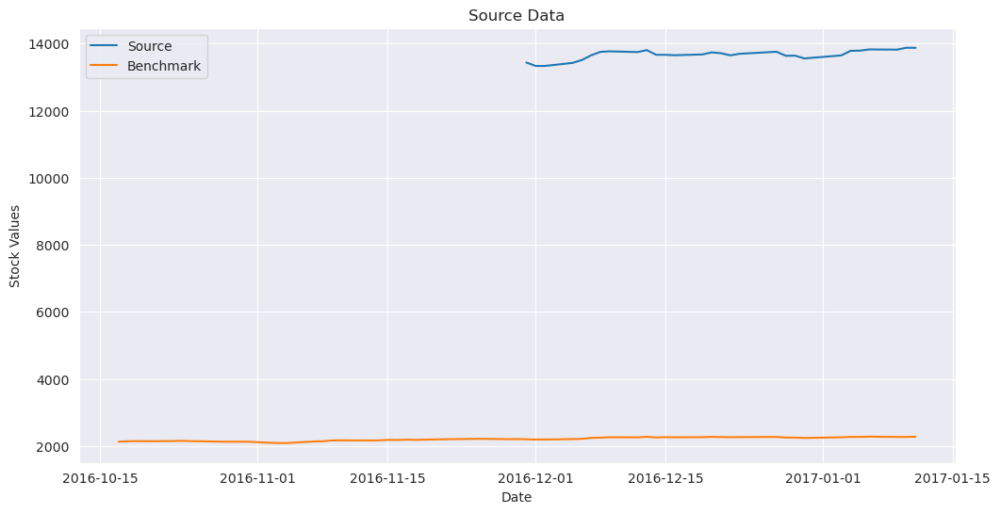


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

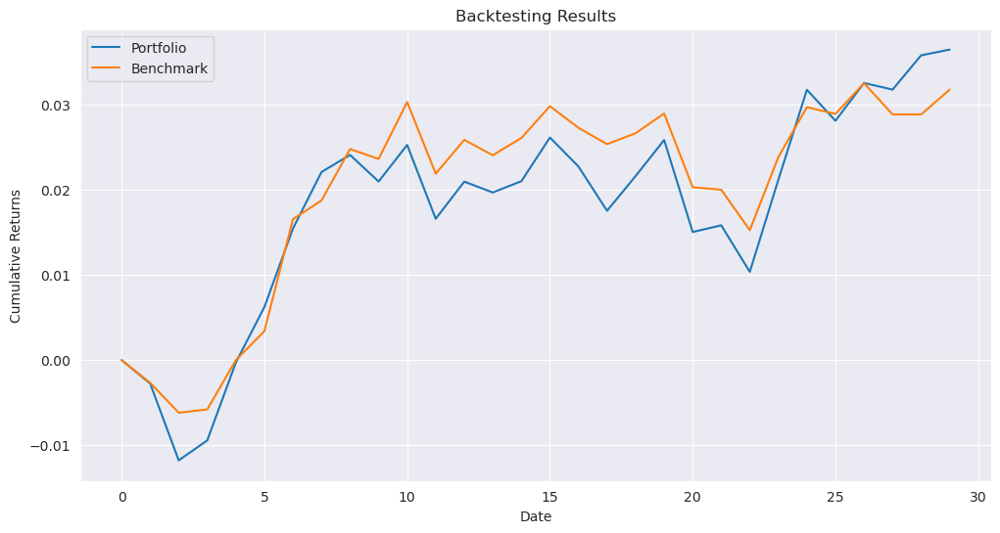

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_8_ew.pkl
initial date: 2021-08-25 00:00:00


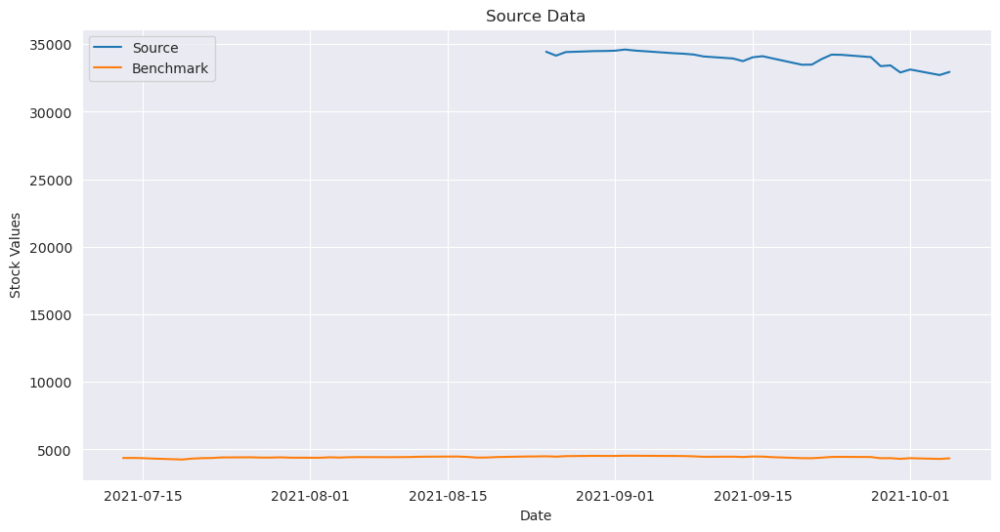


Time step 1/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.009901
  Max weight:     0.009901
  Average weight: 0.009901
  Non-zero count: 

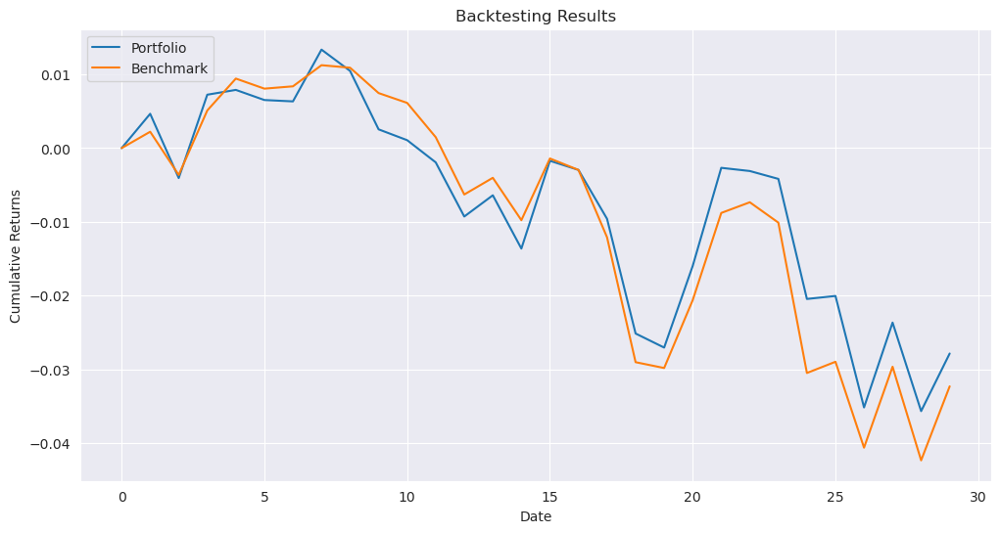

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_9_ew.pkl


In [32]:
results_path_ew_100 = '../../results/qubo_unrestricted/results_100_{}_ew.pkl'
_ = run_experiment(results_path_ew_100, data_100, benchmark, opt_fun_ew, parameters)

### GA

initial date: 2016-03-08 00:00:00


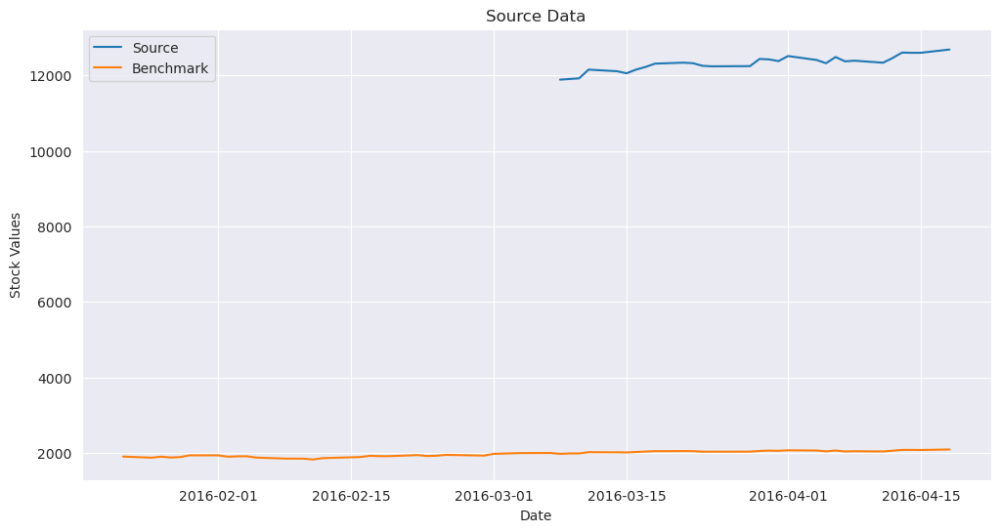


Time step 1/30 - Weight Statistics:
  Min weight:     0.000014
  Max weight:     0.068893
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000015
  Max weight:     0.051923
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000010
  Max weight:     0.070416
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000037
  Max weight:     0.037085
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000052
  Max weight:     0.057264
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000038
  Max weight:     0.063215
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000098
  Max weight:     0.056469
  Average weight: 0.009901
  Non-zero count: 

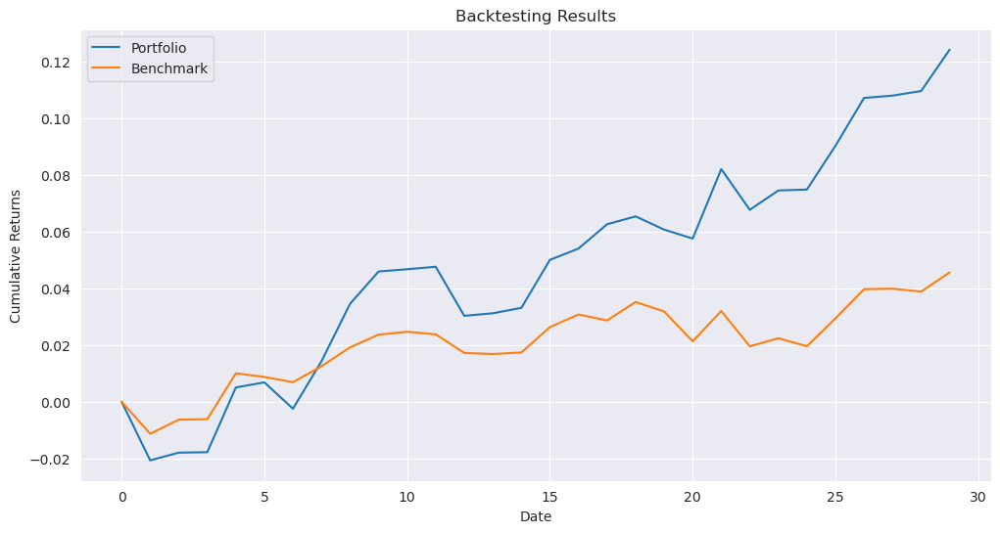

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_0_ga.pkl
initial date: 2021-06-04 00:00:00


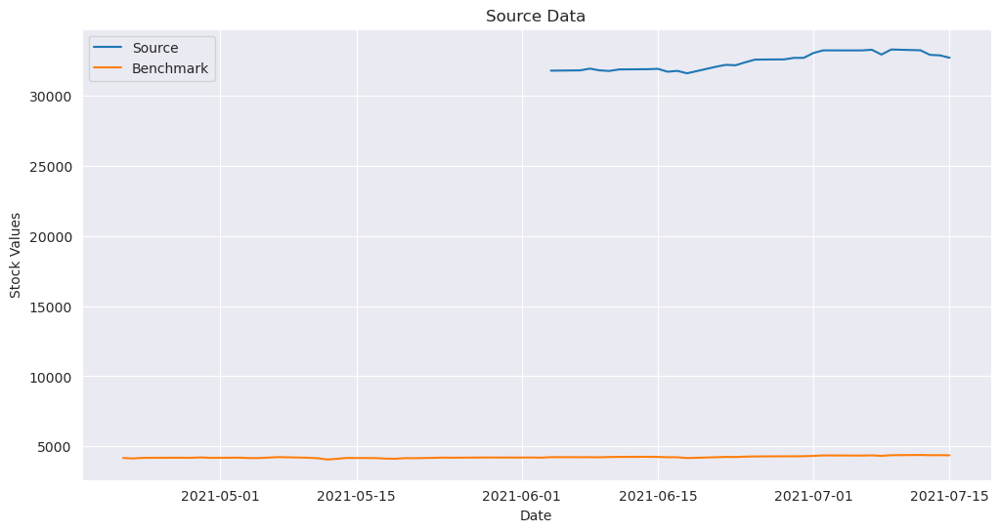


Time step 1/30 - Weight Statistics:
  Min weight:     0.000122
  Max weight:     0.045918
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000093
  Max weight:     0.041497
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000129
  Max weight:     0.056381
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000020
  Max weight:     0.076118
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000125
  Max weight:     0.063831
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000015
  Max weight:     0.070169
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000053
  Max weight:     0.067483
  Average weight: 0.009901
  Non-zero count: 

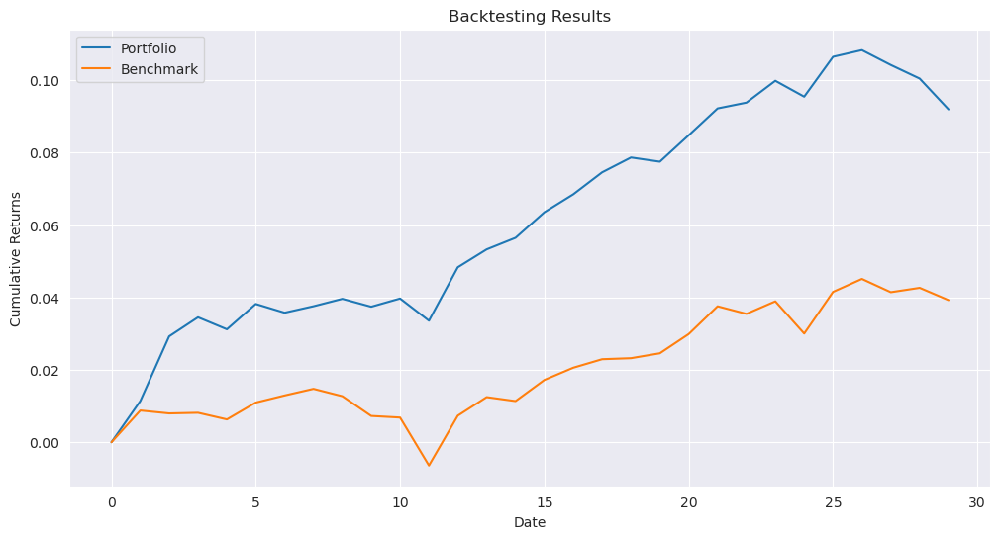

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_1_ga.pkl
initial date: 2024-03-05 00:00:00


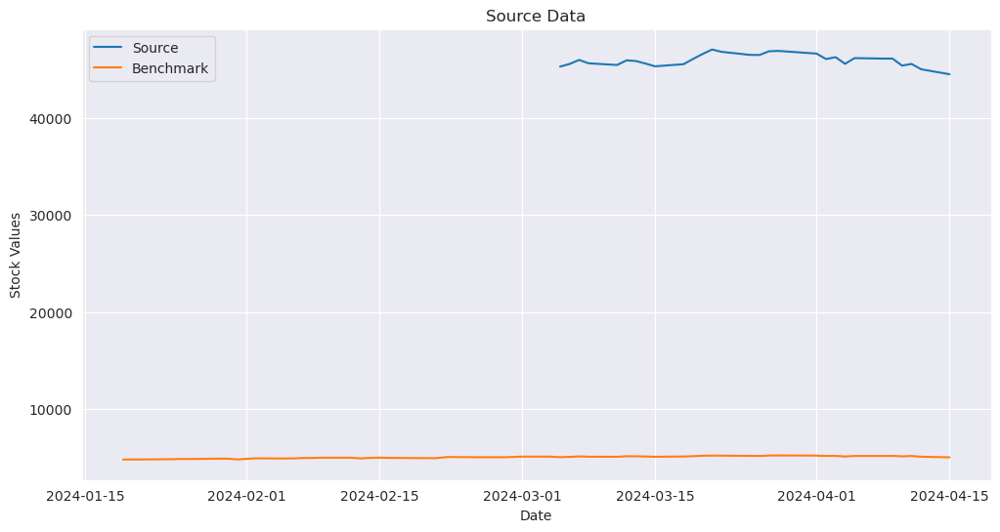


Time step 1/30 - Weight Statistics:
  Min weight:     0.000088
  Max weight:     0.034462
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000059
  Max weight:     0.056324
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000137
  Max weight:     0.044141
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000116
  Max weight:     0.086587
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000201
  Max weight:     0.059593
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000008
  Max weight:     0.051559
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000015
  Max weight:     0.036475
  Average weight: 0.009901
  Non-zero count: 

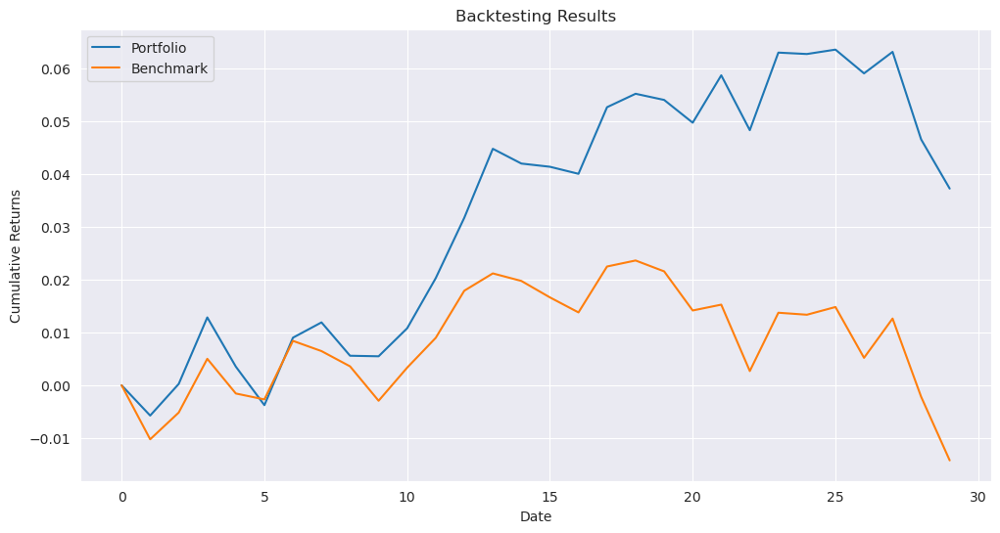

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_2_ga.pkl
initial date: 2020-06-25 00:00:00


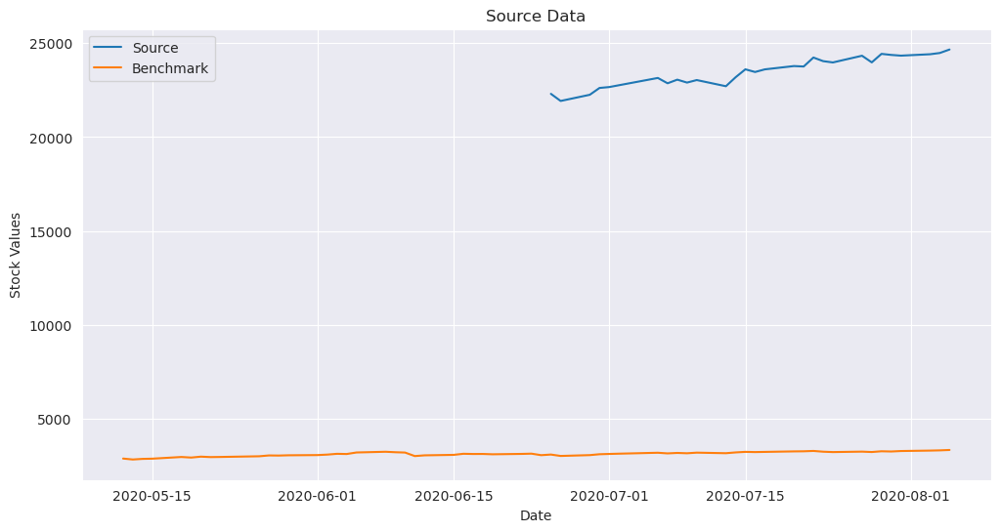


Time step 1/30 - Weight Statistics:
  Min weight:     0.000035
  Max weight:     0.058727
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000026
  Max weight:     0.089631
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000124
  Max weight:     0.054212
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000004
  Max weight:     0.078850
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000190
  Max weight:     0.058388
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000009
  Max weight:     0.067248
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000052
  Max weight:     0.057454
  Average weight: 0.009901
  Non-zero count: 

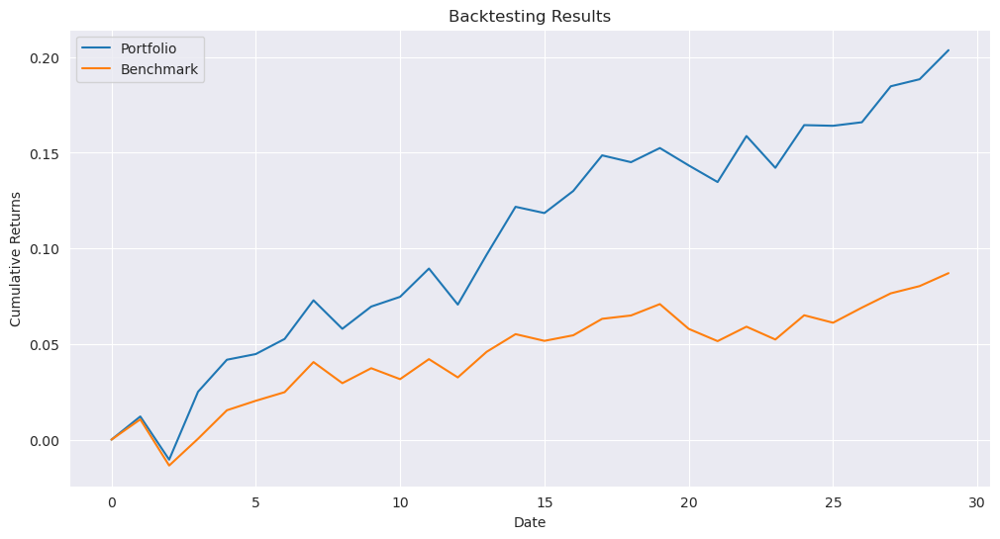

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_3_ga.pkl
initial date: 2024-06-07 00:00:00


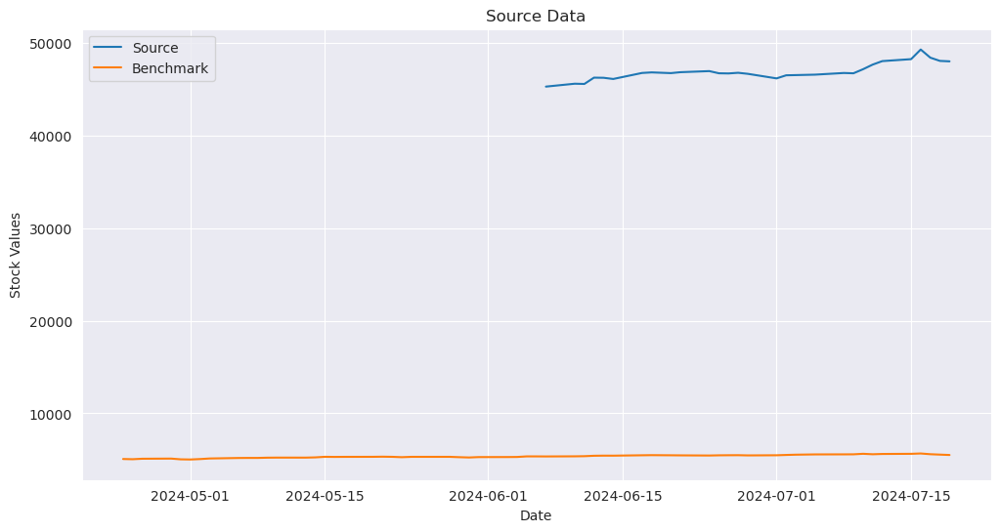


Time step 1/30 - Weight Statistics:
  Min weight:     0.000036
  Max weight:     0.055491
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000048
  Max weight:     0.066267
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000010
  Max weight:     0.036541
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000007
  Max weight:     0.075452
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000098
  Max weight:     0.064125
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000018
  Max weight:     0.046311
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000023
  Max weight:     0.049107
  Average weight: 0.009901
  Non-zero count: 

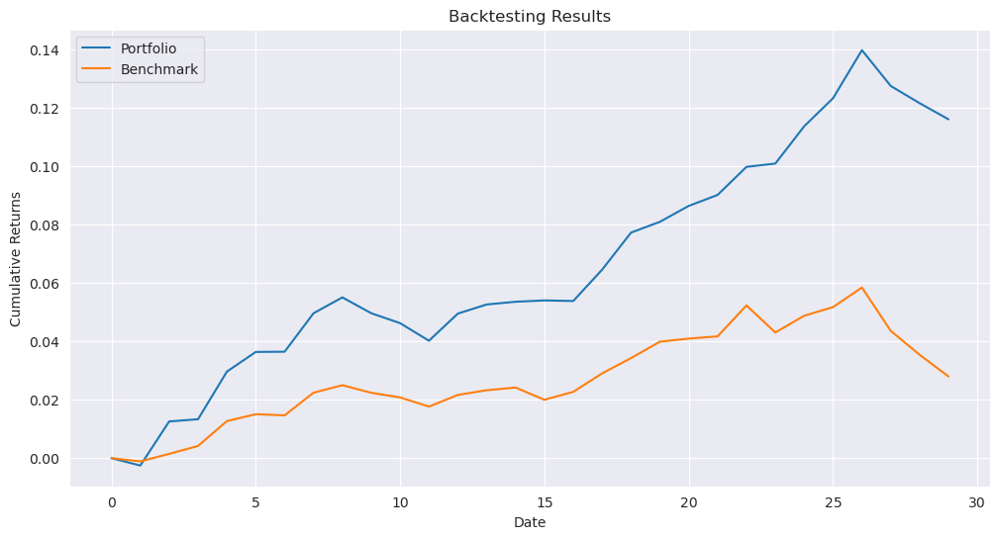

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_4_ga.pkl
initial date: 2014-02-07 00:00:00


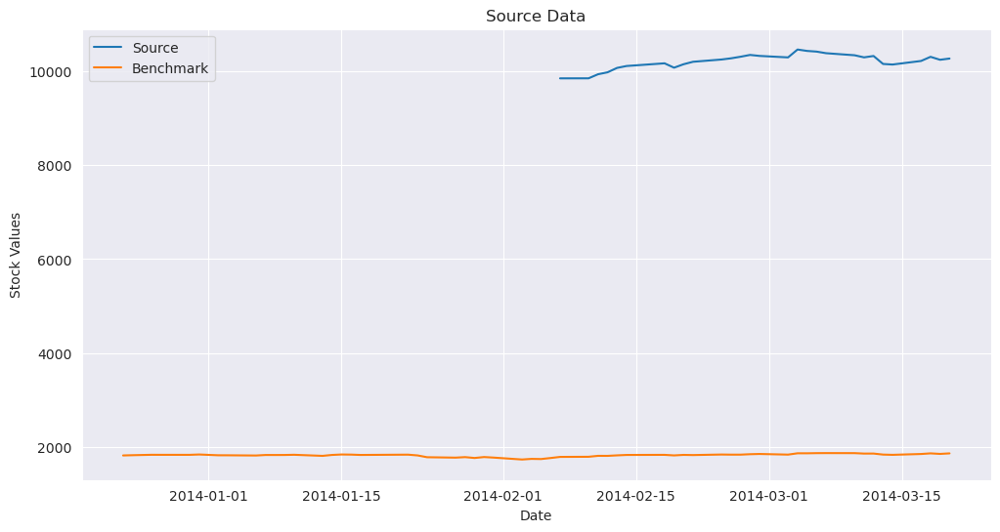


Time step 1/30 - Weight Statistics:
  Min weight:     0.000059
  Max weight:     0.055129
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000172
  Max weight:     0.051875
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000134
  Max weight:     0.091822
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000029
  Max weight:     0.092189
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000070
  Max weight:     0.050865
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000088
  Max weight:     0.057013
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000009
  Max weight:     0.049801
  Average weight: 0.009901
  Non-zero count: 

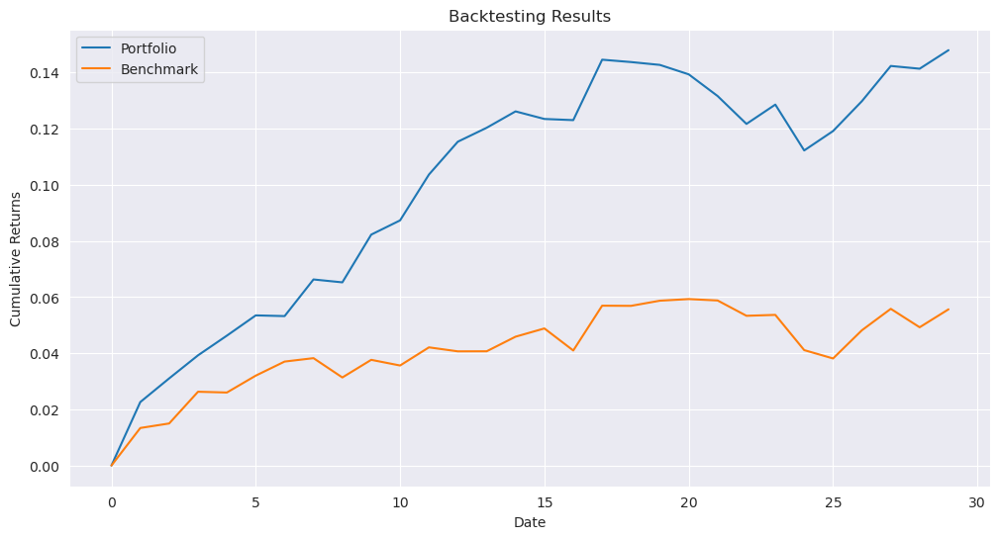

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_5_ga.pkl
initial date: 2016-04-21 00:00:00


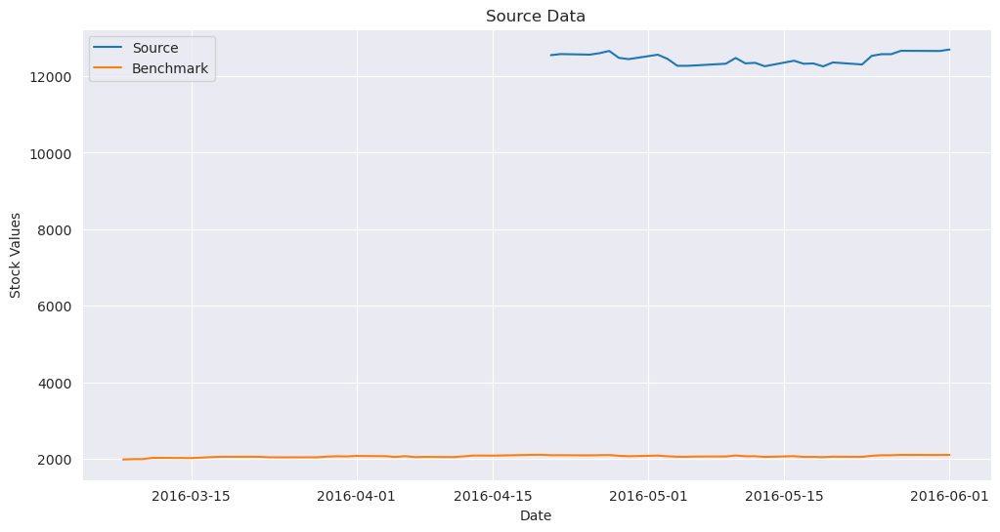


Time step 1/30 - Weight Statistics:
  Min weight:     0.000082
  Max weight:     0.086719
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000013
  Max weight:     0.090028
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000087
  Max weight:     0.065813
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000015
  Max weight:     0.056988
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000013
  Max weight:     0.061286
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000014
  Max weight:     0.059809
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000162
  Max weight:     0.056076
  Average weight: 0.009901
  Non-zero count: 

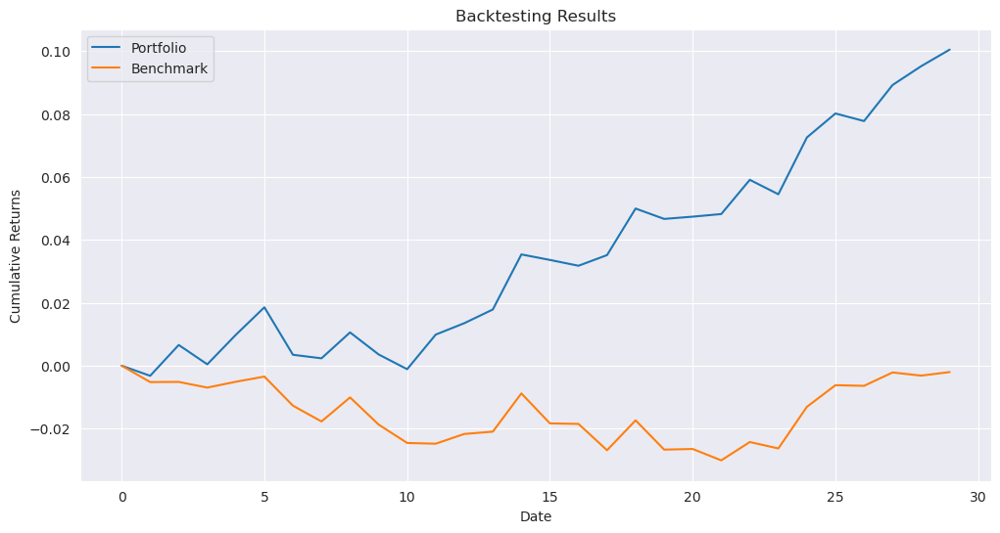

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_6_ga.pkl
initial date: 2020-05-11 00:00:00


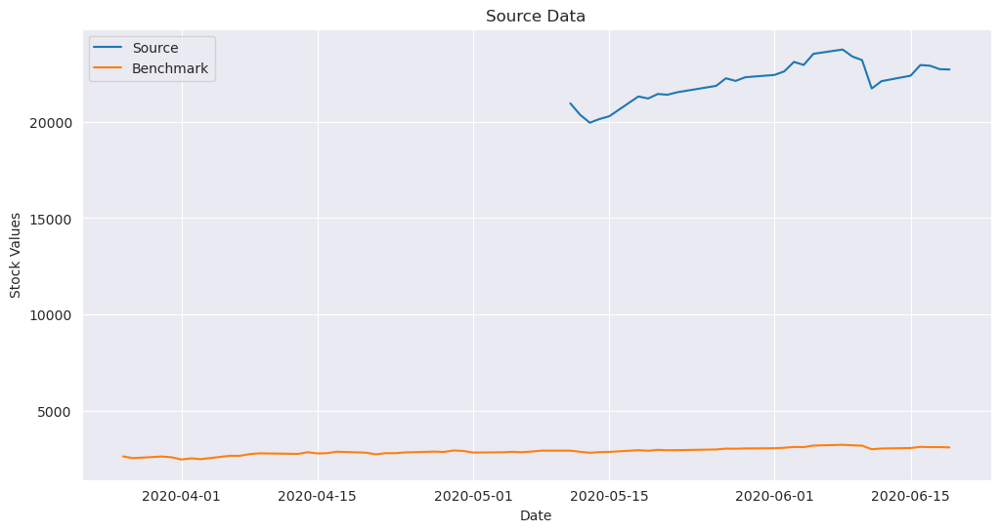


Time step 1/30 - Weight Statistics:
  Min weight:     0.000062
  Max weight:     0.050548
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000145
  Max weight:     0.064616
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000009
  Max weight:     0.092131
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000029
  Max weight:     0.060174
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000042
  Max weight:     0.061221
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000039
  Max weight:     0.052929
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000151
  Max weight:     0.078485
  Average weight: 0.009901
  Non-zero count: 

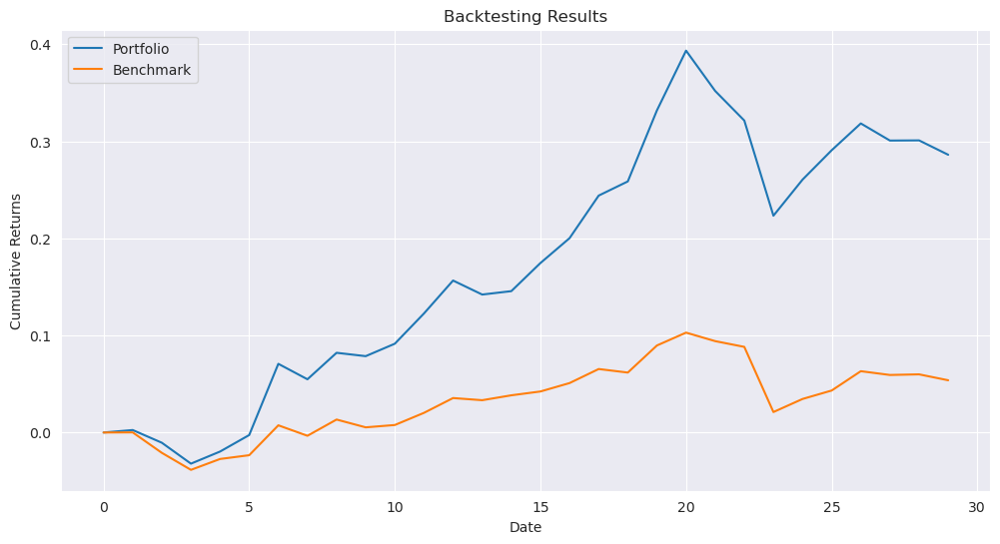

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_7_ga.pkl
initial date: 2016-11-30 00:00:00


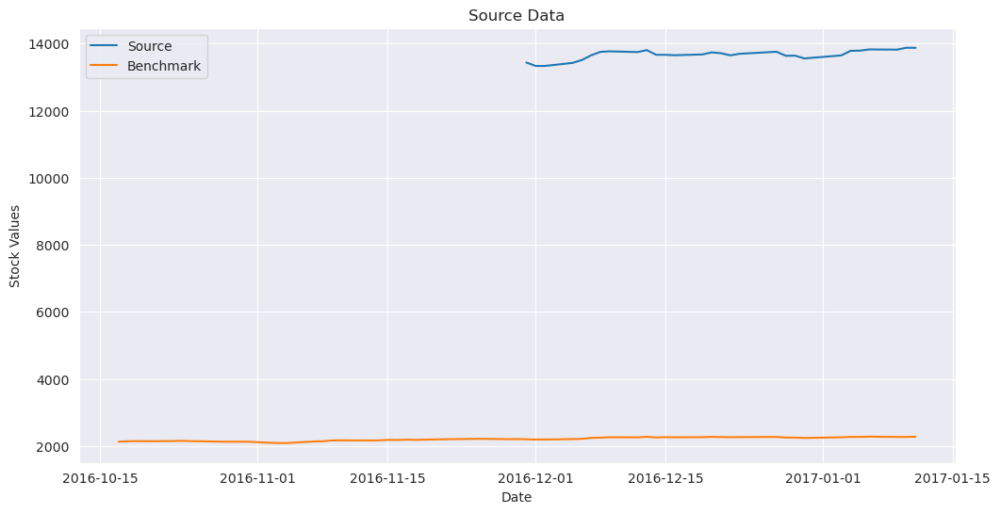


Time step 1/30 - Weight Statistics:
  Min weight:     0.000014
  Max weight:     0.053846
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000017
  Max weight:     0.079307
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000029
  Max weight:     0.050148
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000036
  Max weight:     0.048605
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000011
  Max weight:     0.127341
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000009
  Max weight:     0.047086
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000076
  Max weight:     0.047108
  Average weight: 0.009901
  Non-zero count: 

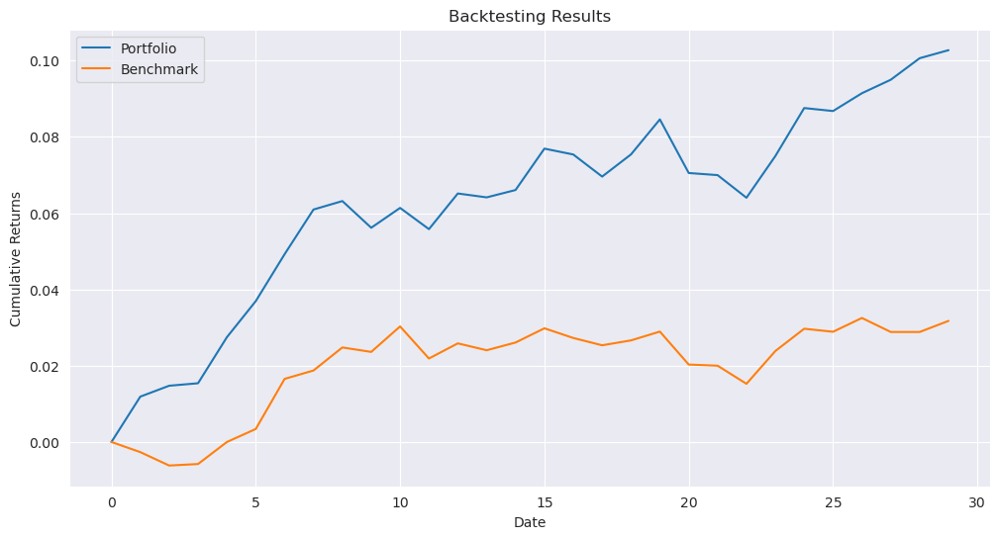

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_8_ga.pkl
initial date: 2021-08-25 00:00:00


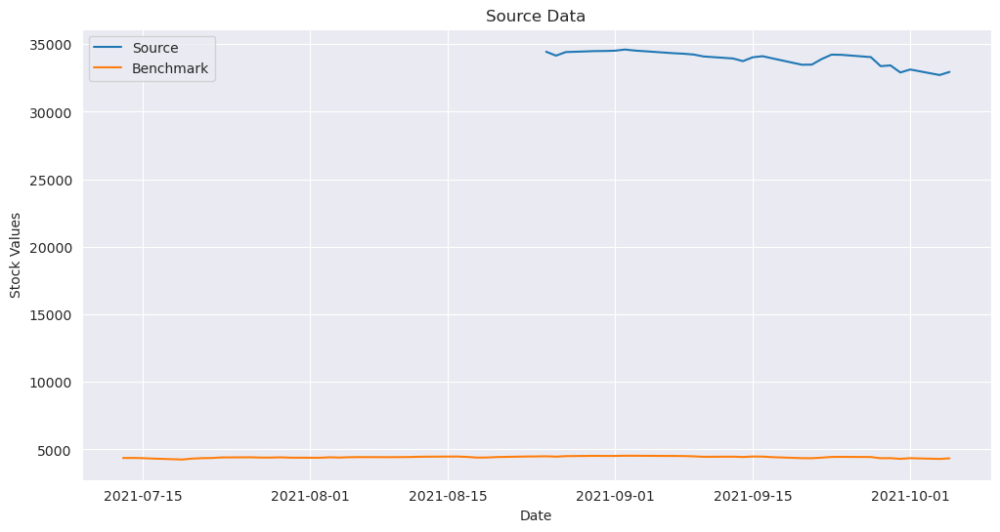


Time step 1/30 - Weight Statistics:
  Min weight:     0.000024
  Max weight:     0.051940
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.000011
  Max weight:     0.051177
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.000022
  Max weight:     0.055691
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.000029
  Max weight:     0.041872
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.000002
  Max weight:     0.083708
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.000031
  Max weight:     0.079498
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.000082
  Max weight:     0.052321
  Average weight: 0.009901
  Non-zero count: 

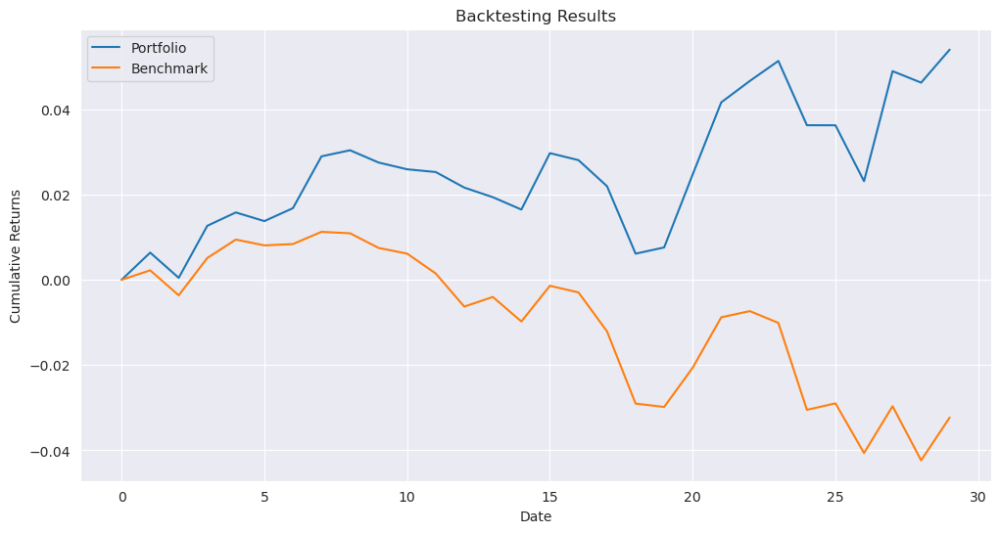

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_9_ga.pkl


In [33]:
results_path_ga_100 = '../../results/qubo_unrestricted/results_100_{}_ga.pkl'
_ = run_experiment(results_path_ga_100, data_100, benchmark, opt_fun_ga, parameters)

### BF

initial date: 2016-03-08 00:00:00


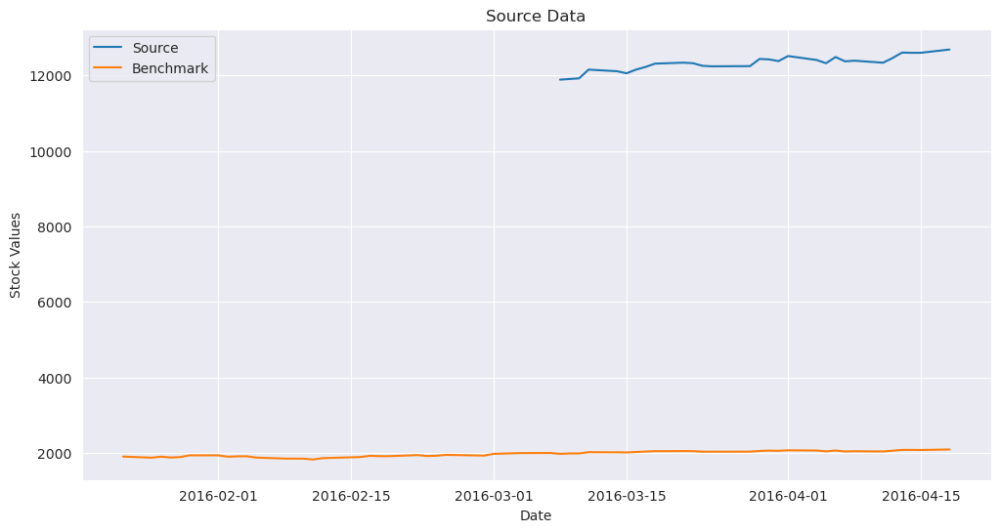


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.610170
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.883602
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.515156
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.495169
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.346001
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.336428
  Average weight: 0.009901
  Non-zero count: 

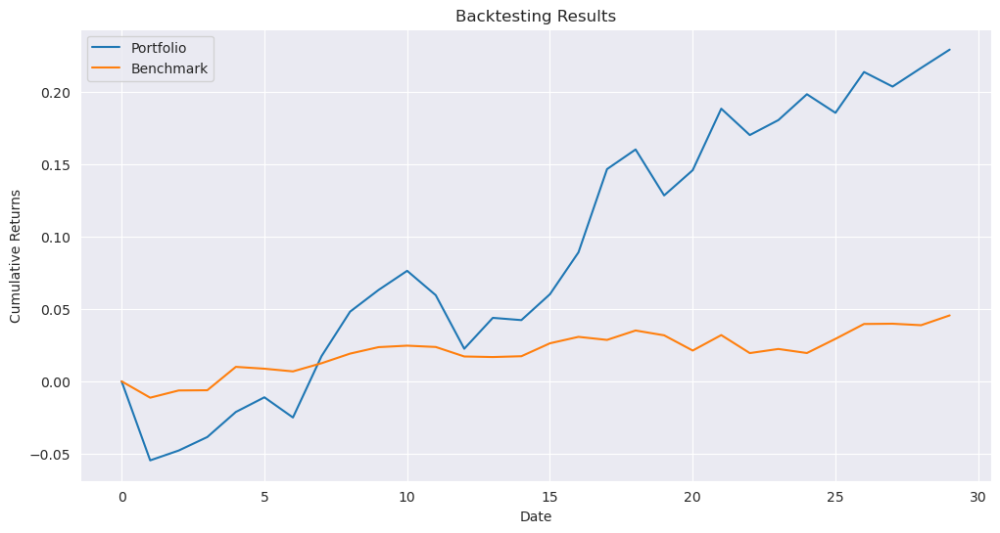

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_0_bf.pkl
initial date: 2021-06-04 00:00:00


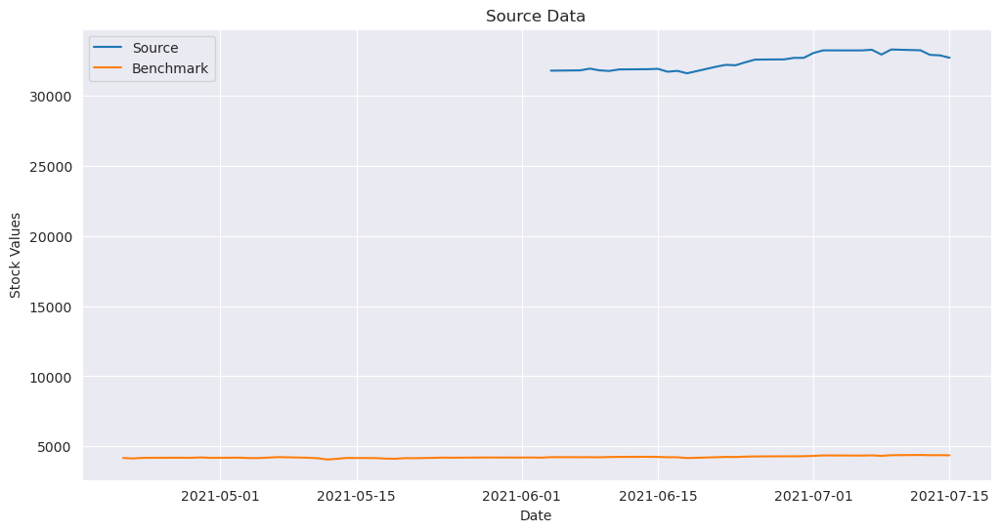


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.376955
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.590823
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.577169
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 

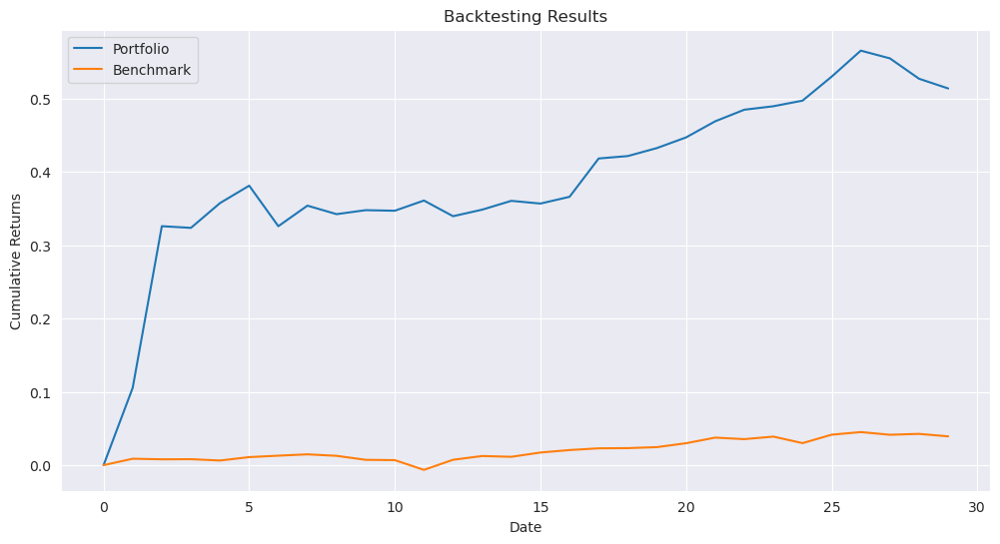

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_1_bf.pkl
initial date: 2024-03-05 00:00:00


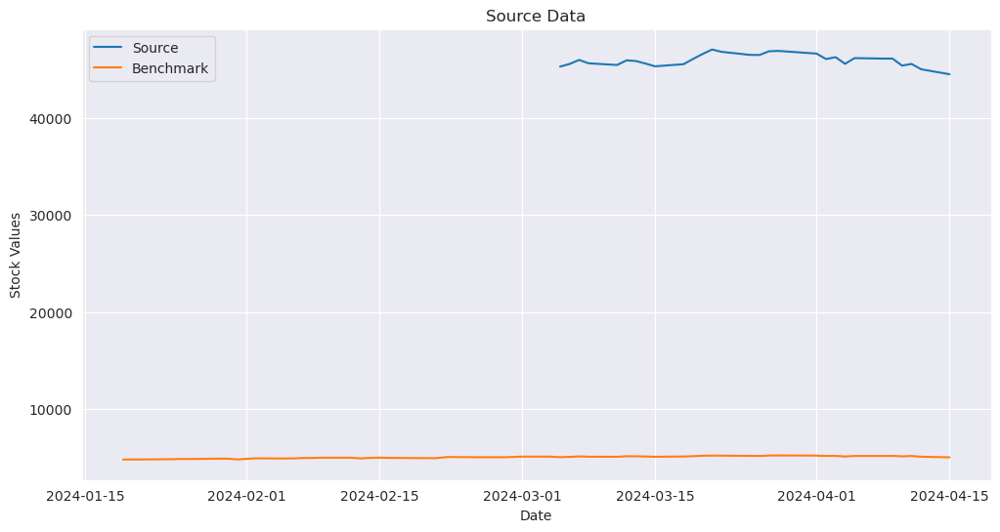


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 

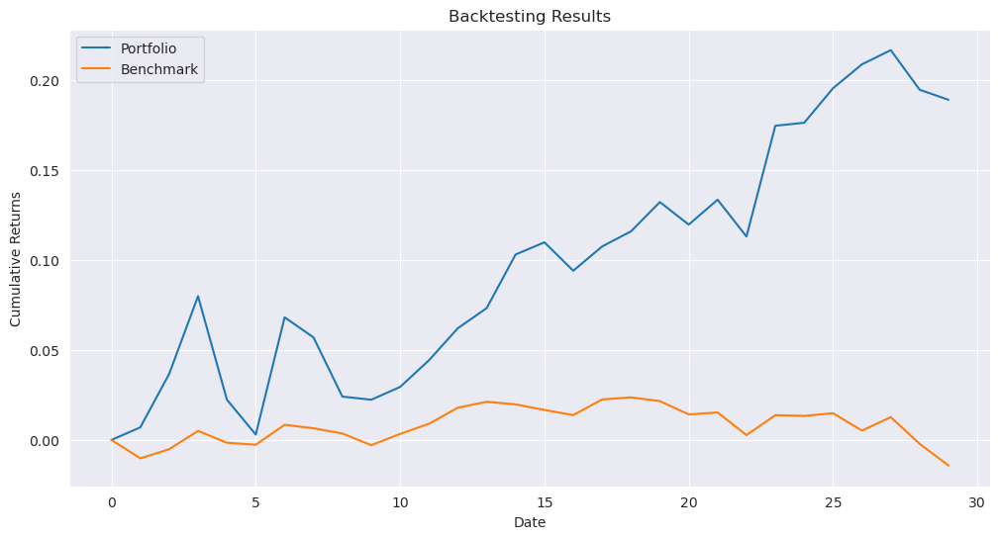

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_2_bf.pkl
initial date: 2020-06-25 00:00:00


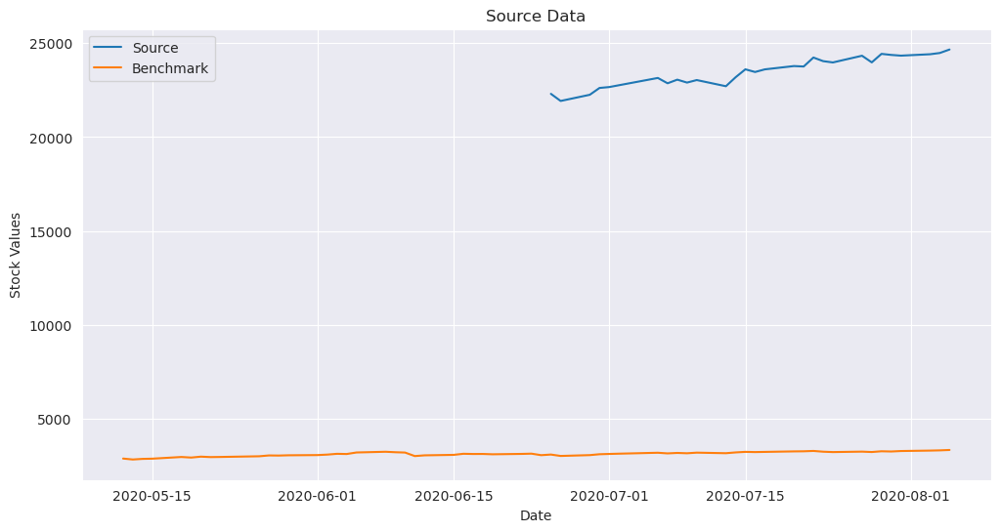


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.753391
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.643316
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.479503
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.398335
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 

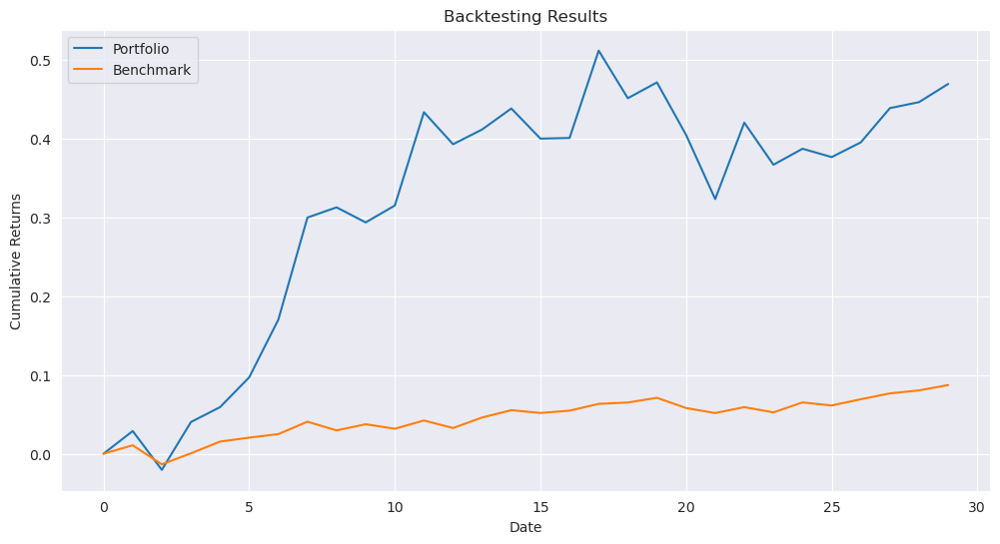

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_3_bf.pkl
initial date: 2024-06-07 00:00:00


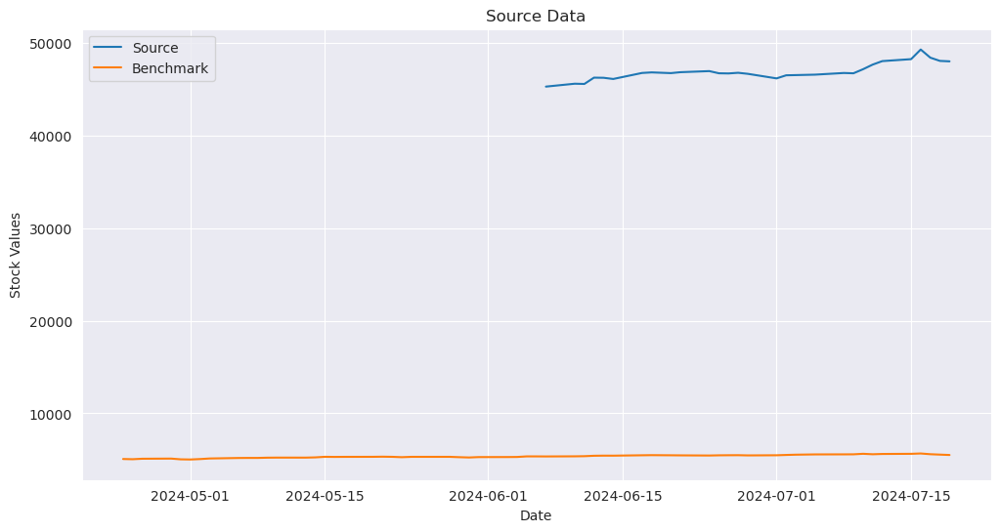


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 

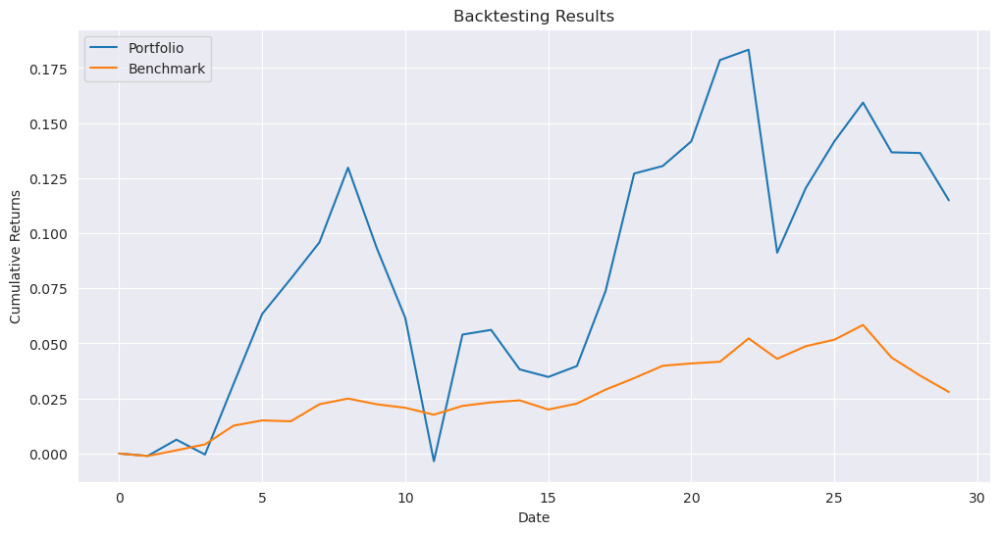

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_4_bf.pkl
initial date: 2014-02-07 00:00:00


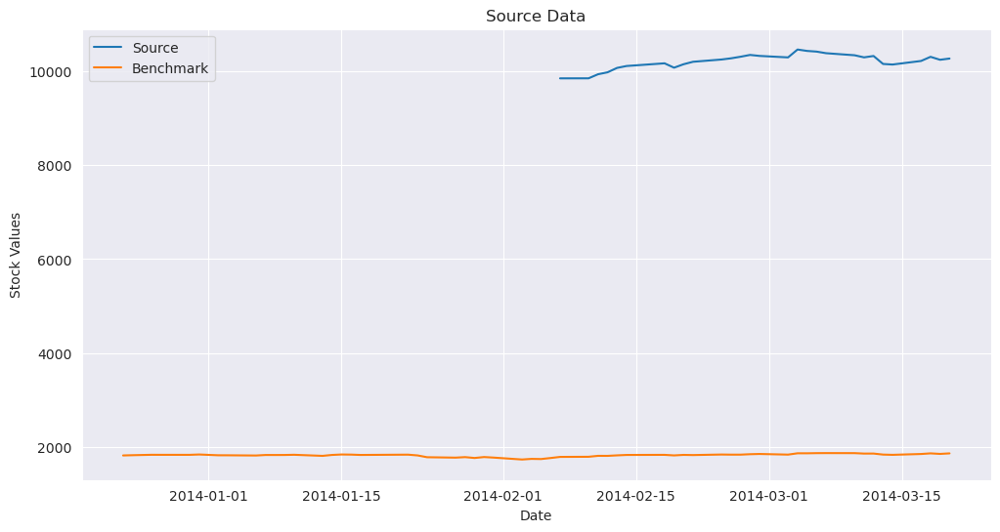


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.305420
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.634211
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.489176
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.718765
  Average weight: 0.009901
  Non-zero count: 

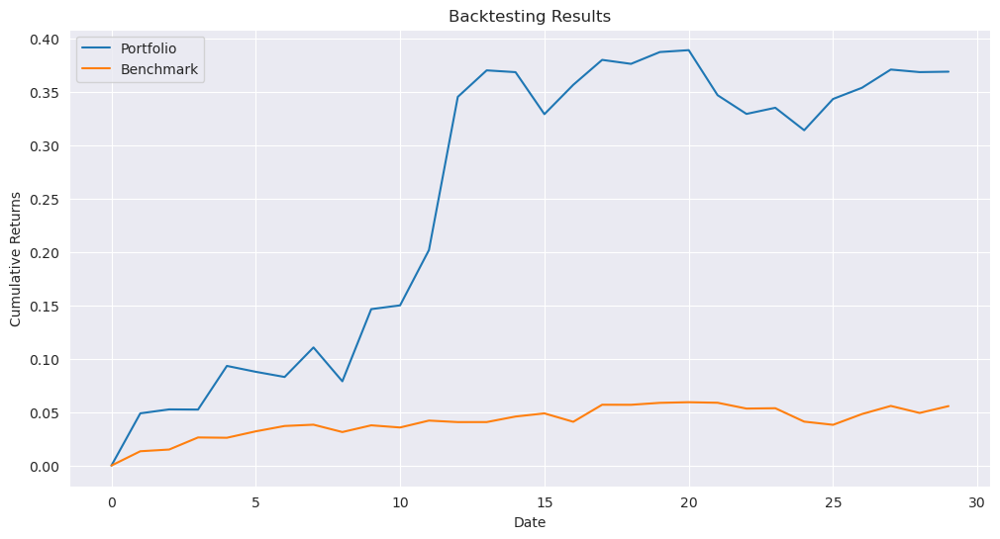

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_5_bf.pkl
initial date: 2016-04-21 00:00:00


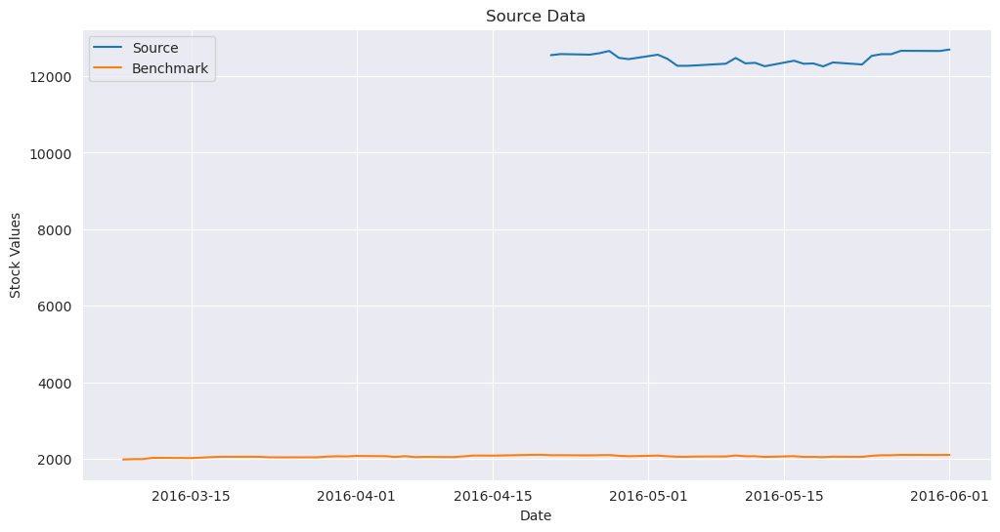


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.754751
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.466088
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.590133
  Average weight: 0.009901
  Non-zero count: 

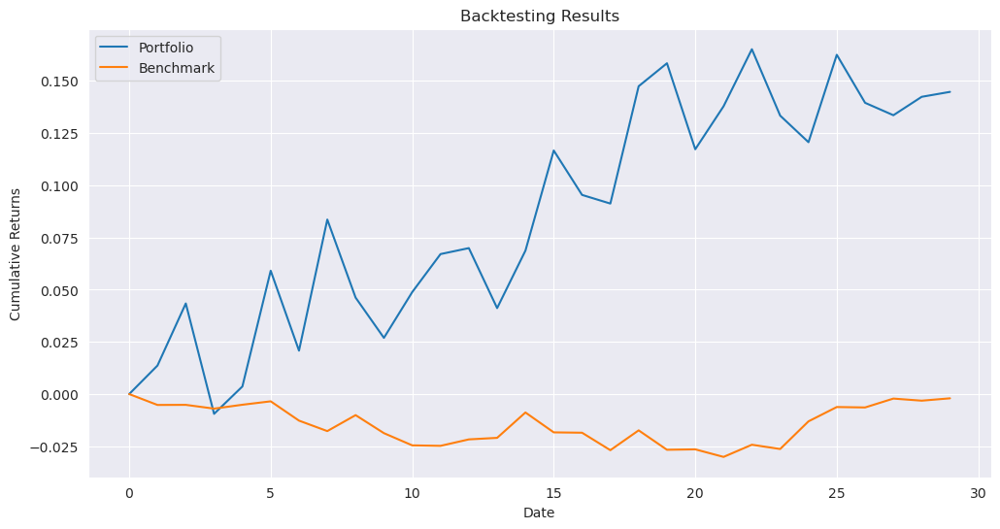

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_6_bf.pkl
initial date: 2020-05-11 00:00:00


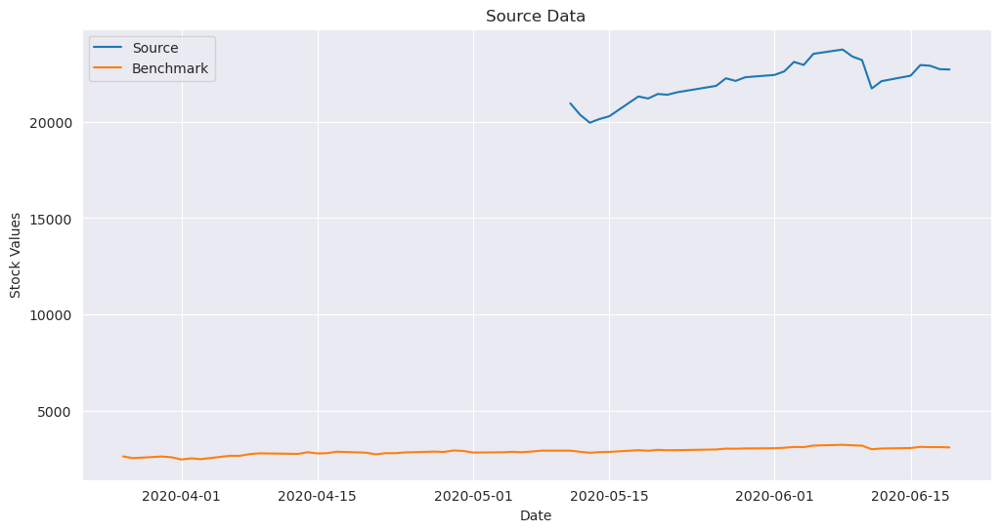


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 

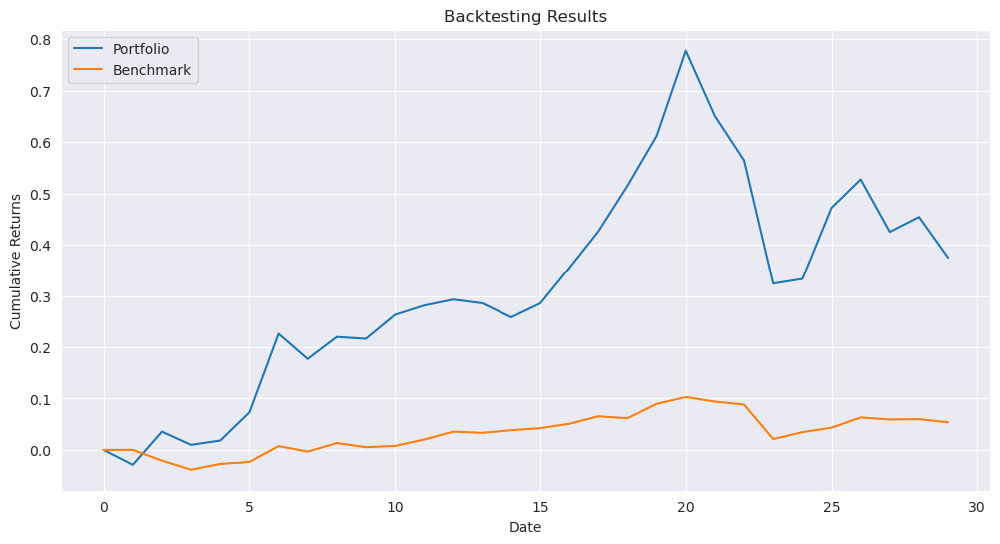

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_7_bf.pkl
initial date: 2016-11-30 00:00:00


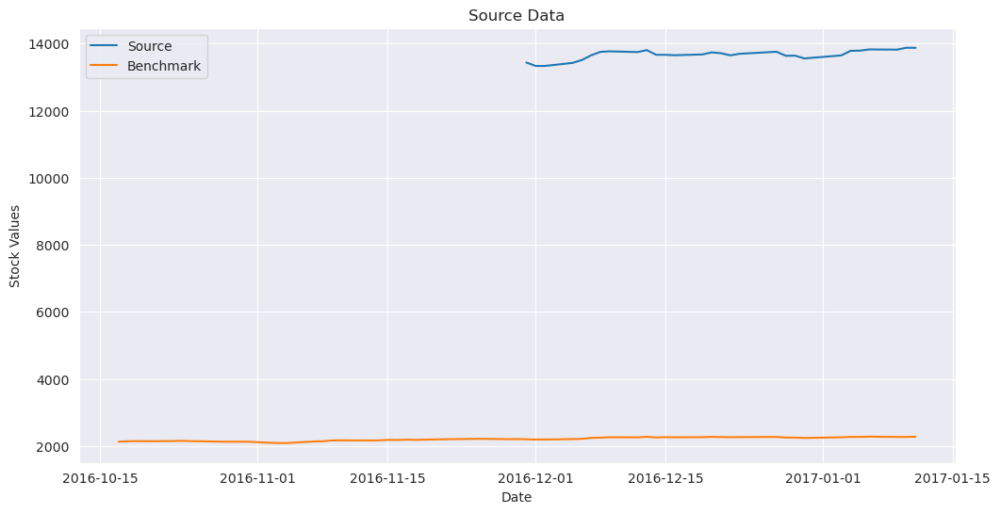


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.645533
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.639679
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.820161
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.378742
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.377620
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 

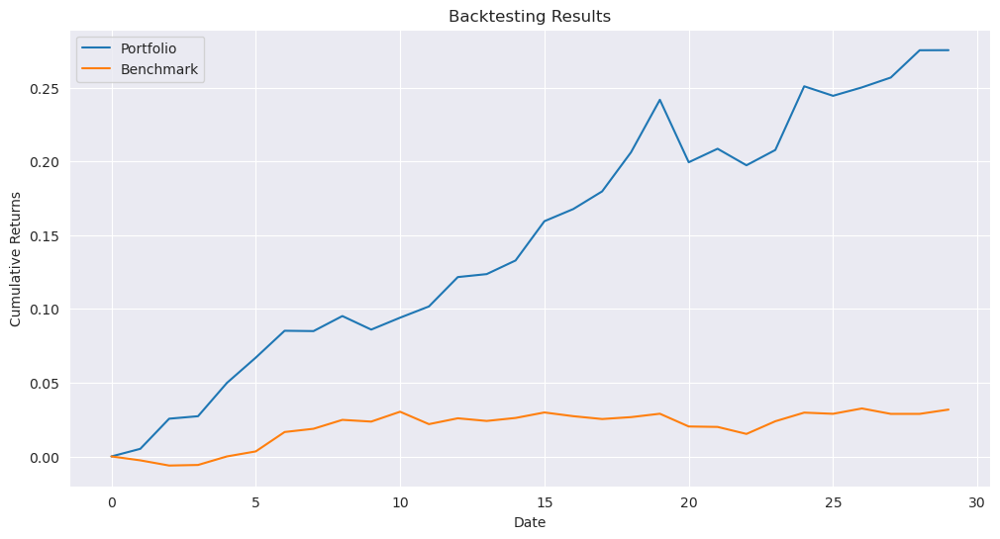

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_8_bf.pkl
initial date: 2021-08-25 00:00:00


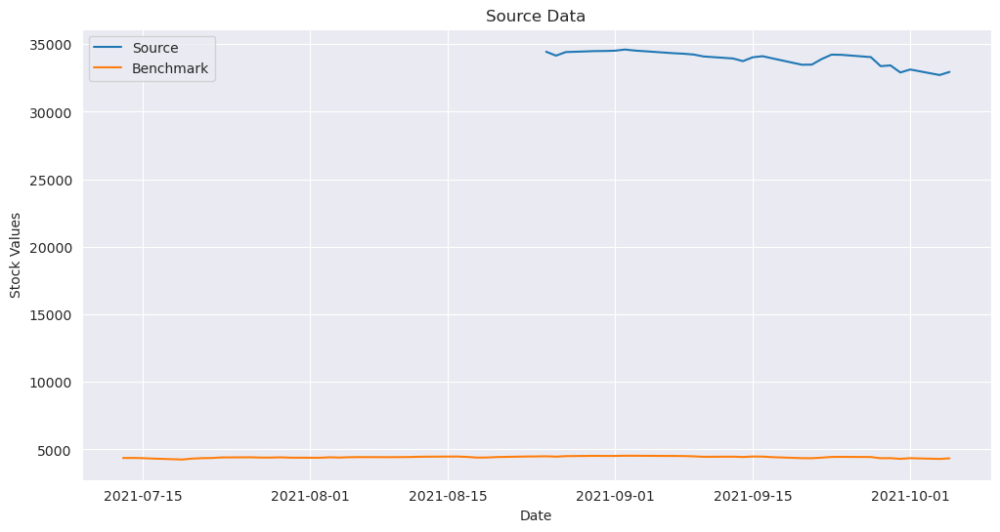


Time step 1/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 2/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.529646
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 3/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.900000
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 4/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.484251
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 5/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.460001
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 6/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.472997
  Average weight: 0.009901
  Non-zero count: 101/101

Time step 7/30 - Weight Statistics:
  Min weight:     0.001000
  Max weight:     0.464268
  Average weight: 0.009901
  Non-zero count: 

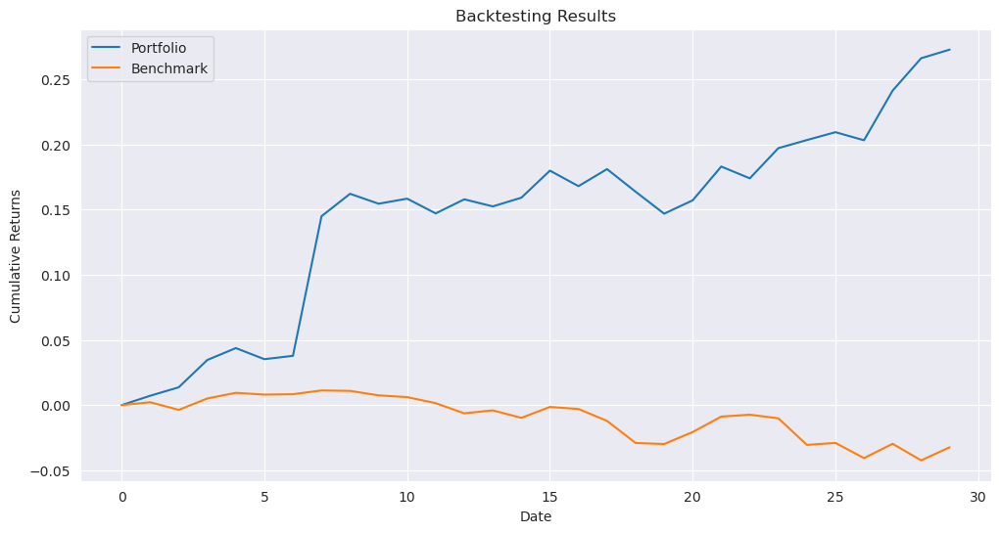

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_9_bf.pkl


In [34]:
results_path_bf_100 = '../../results/qubo_unrestricted/results_100_{}_bf.pkl'
_ = run_experiment(results_path_bf_100, data_100, benchmark, opt_fun_bf, parameters)

#### HRP

initial date: 2016-03-08 00:00:00


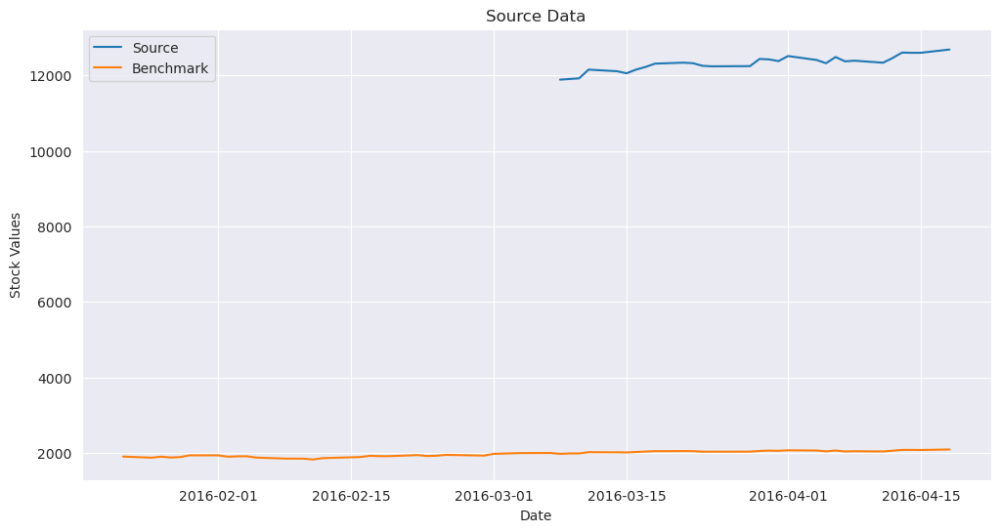

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


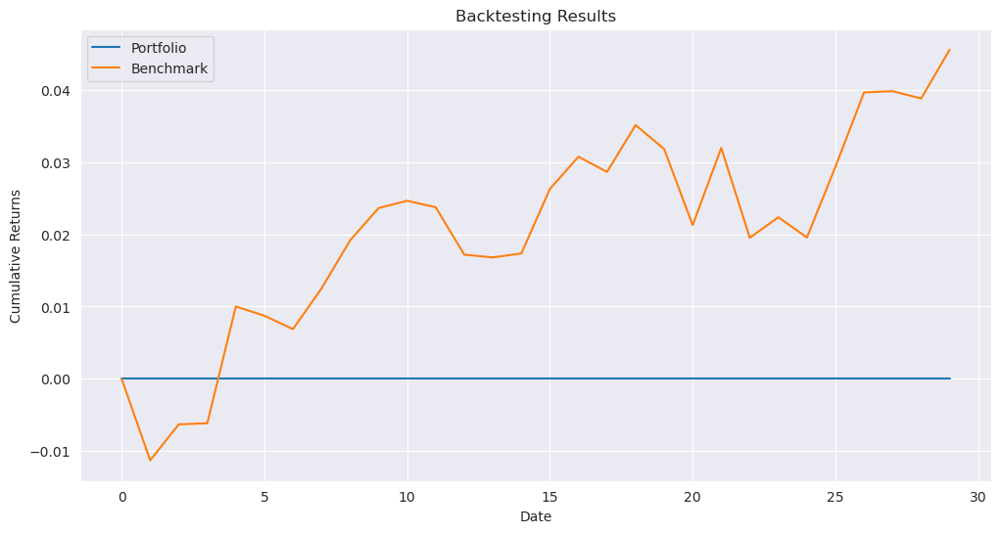

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_0_hrp.pkl
initial date: 2021-06-04 00:00:00


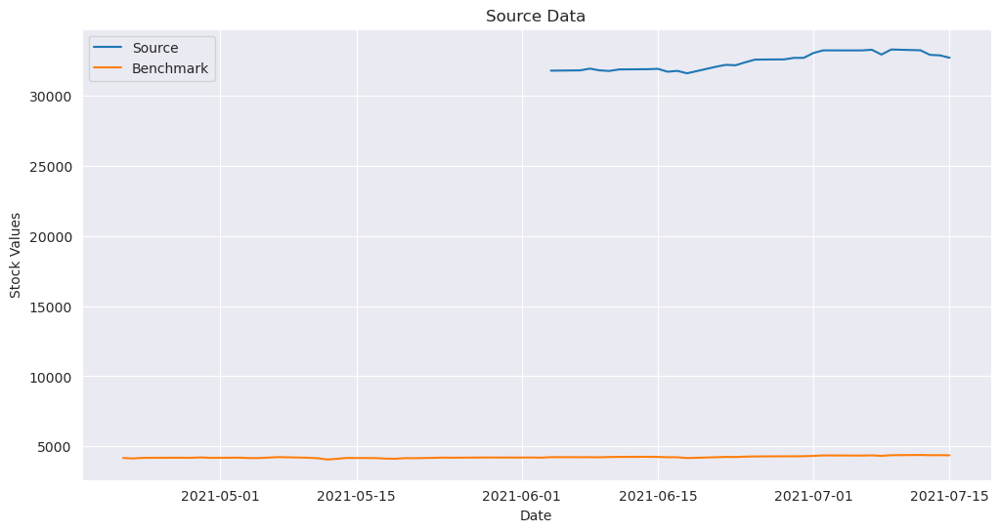

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'



Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


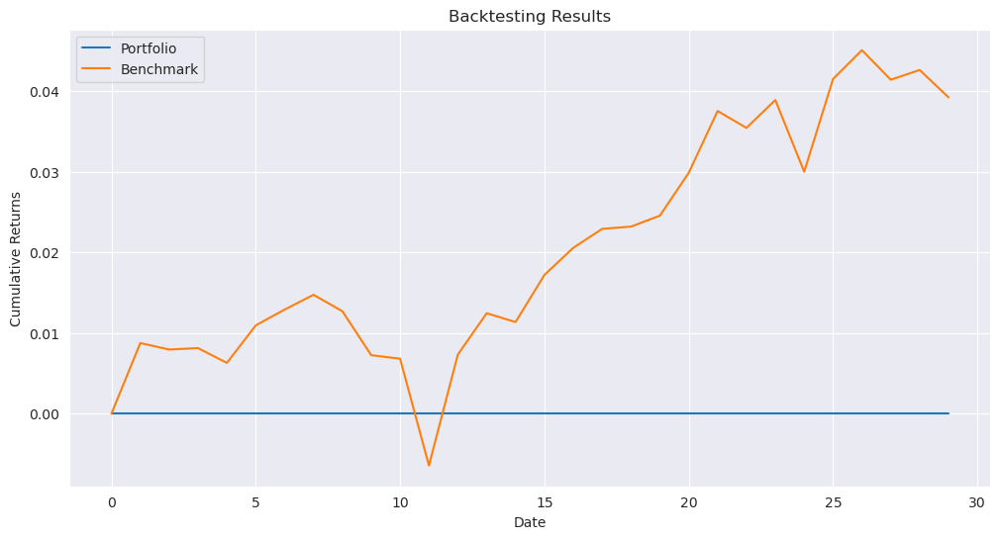

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_1_hrp.pkl
initial date: 2024-03-05 00:00:00


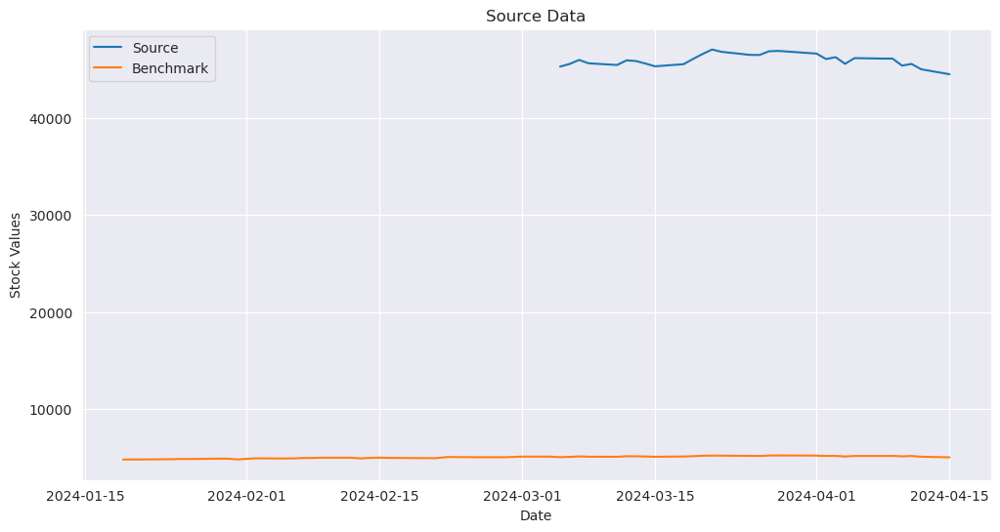

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


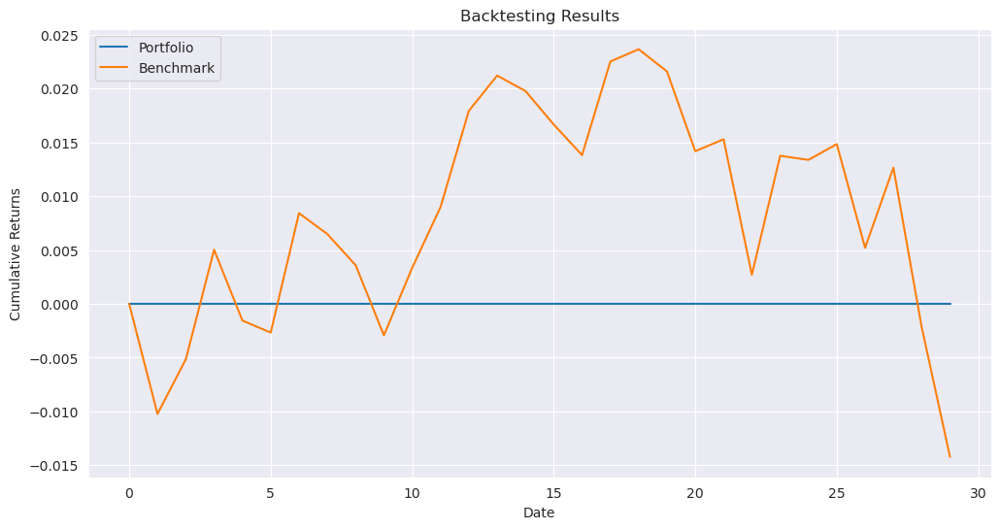

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_2_hrp.pkl
initial date: 2020-06-25 00:00:00


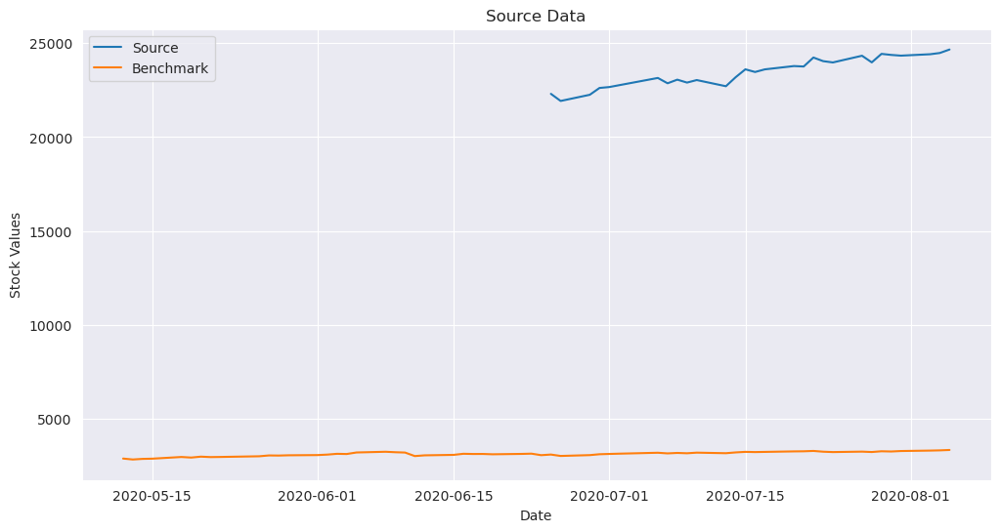

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


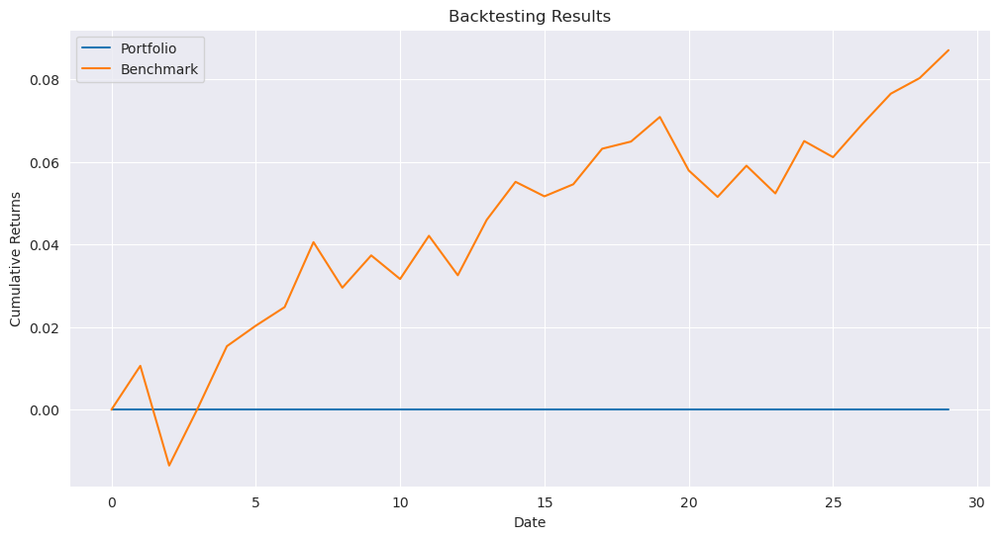

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_3_hrp.pkl
initial date: 2024-06-07 00:00:00


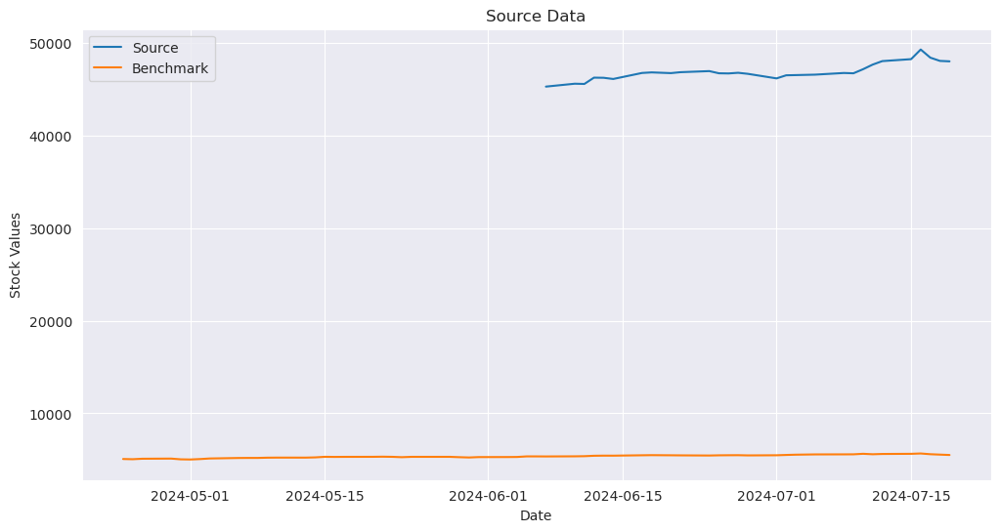

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


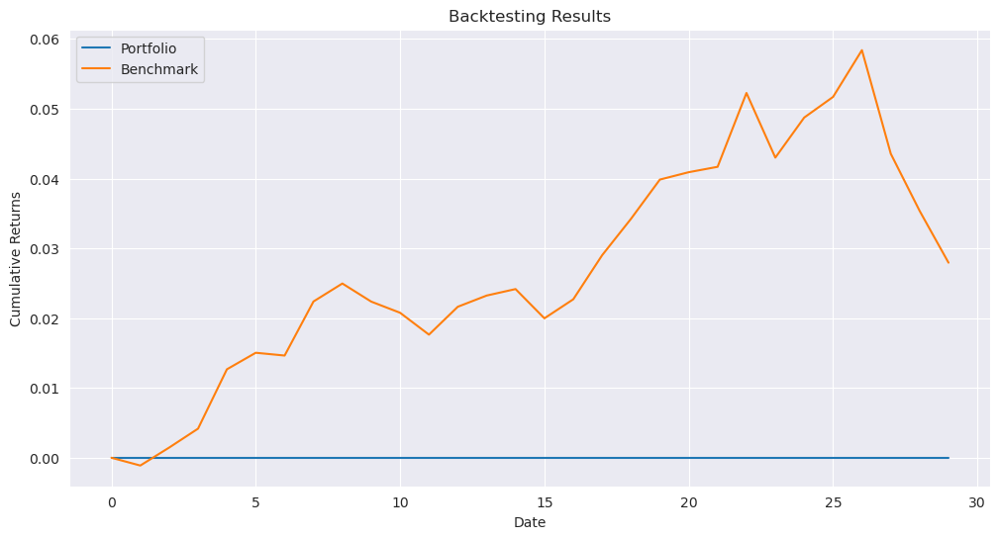

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_4_hrp.pkl
initial date: 2014-02-07 00:00:00


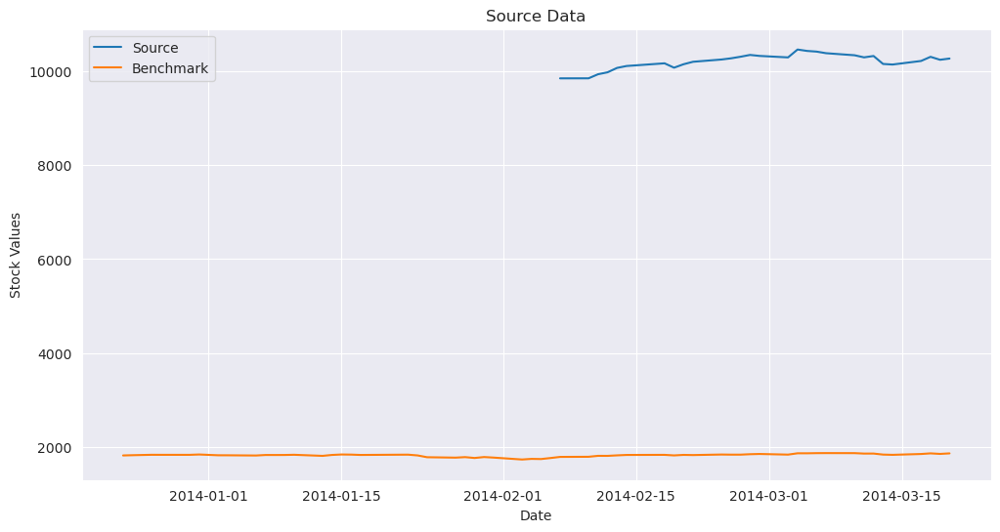

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


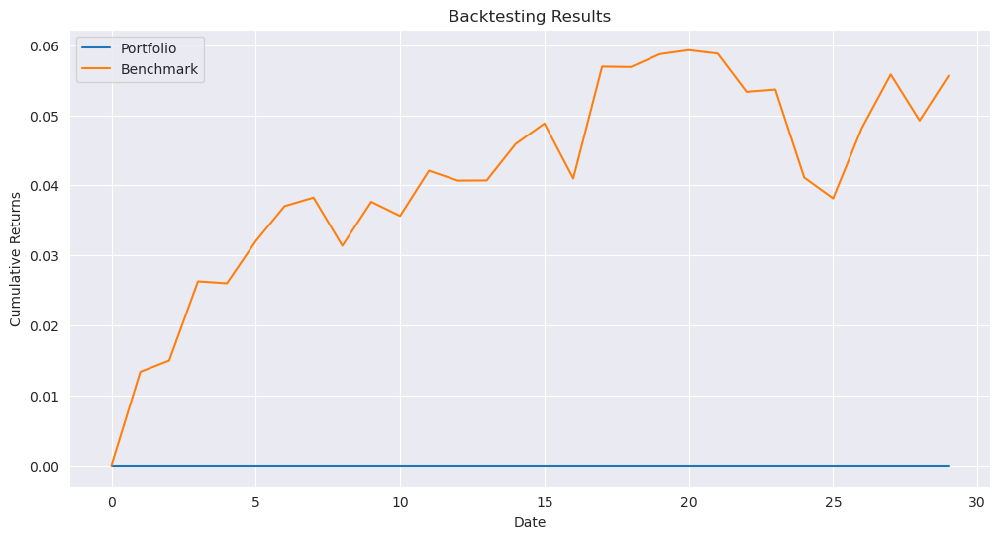

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_5_hrp.pkl
initial date: 2016-04-21 00:00:00


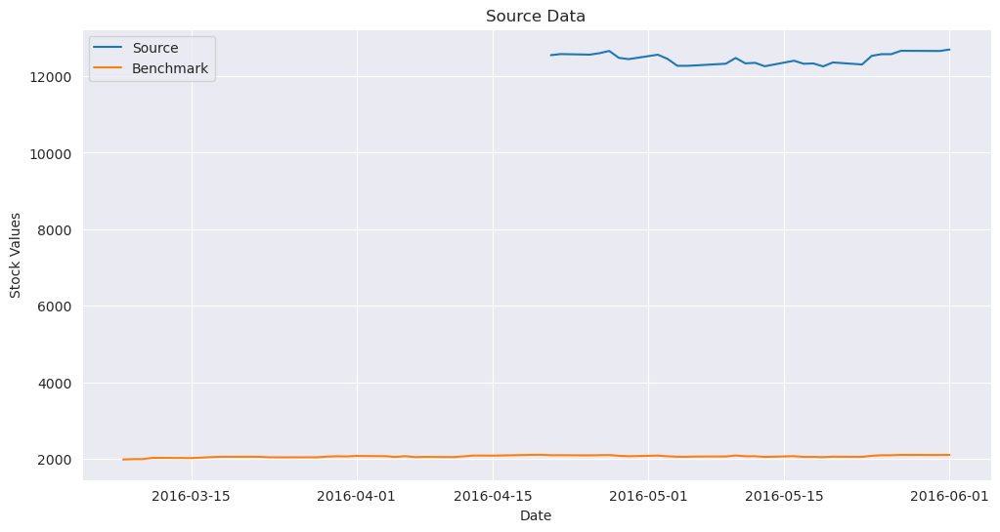

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


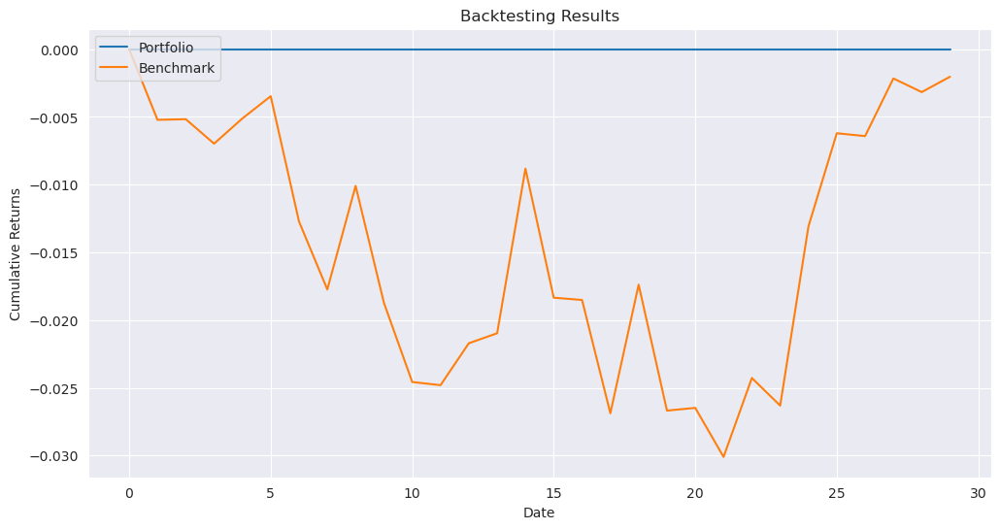

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_6_hrp.pkl
initial date: 2020-05-11 00:00:00


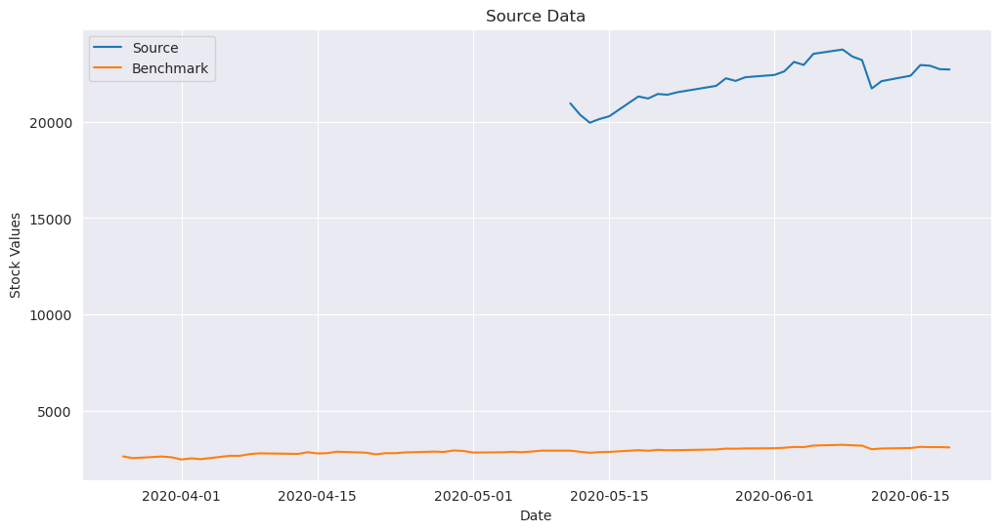

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


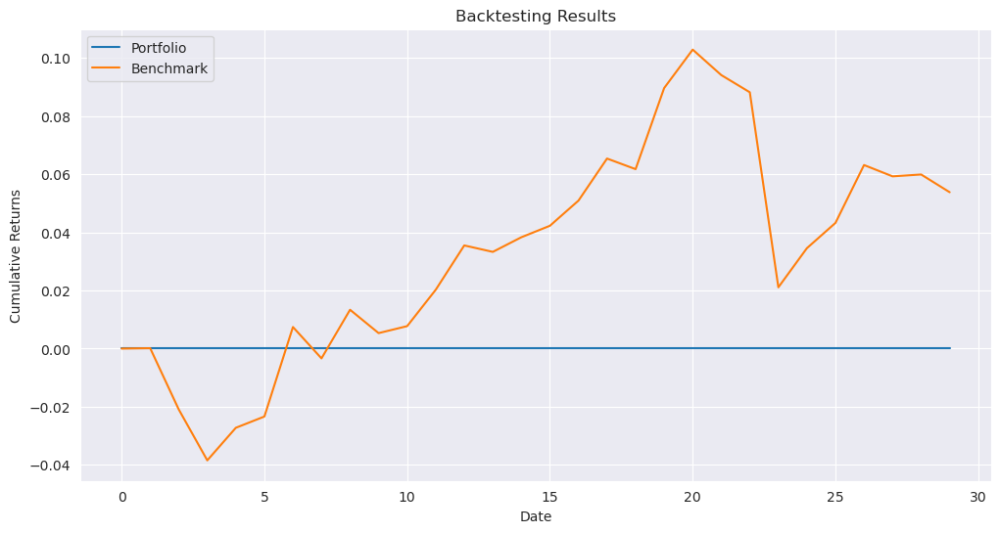

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_7_hrp.pkl
initial date: 2016-11-30 00:00:00


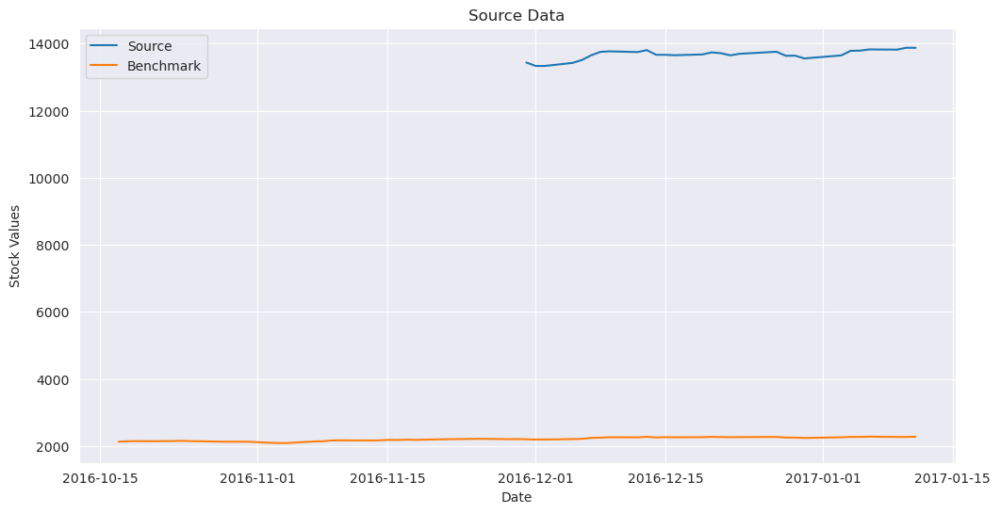

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'



Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


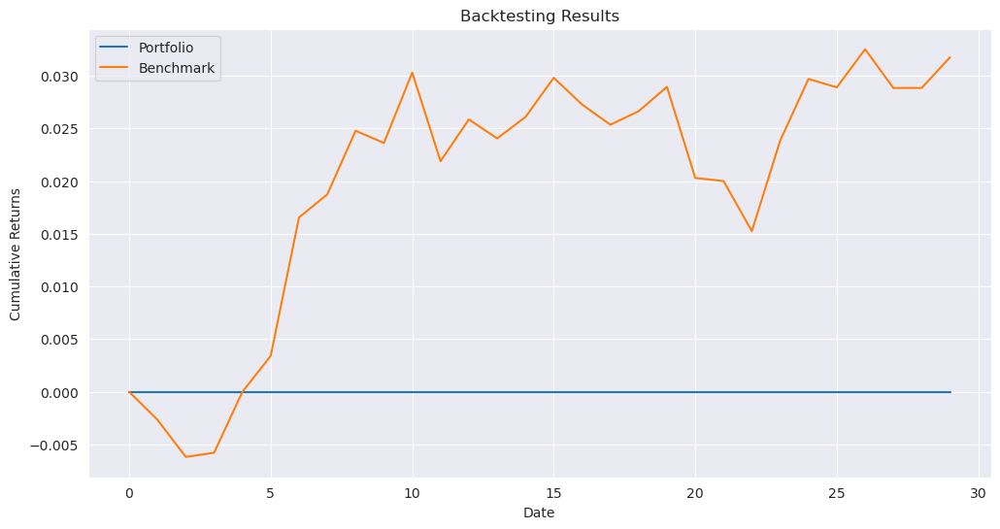

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_8_hrp.pkl
initial date: 2021-08-25 00:00:00


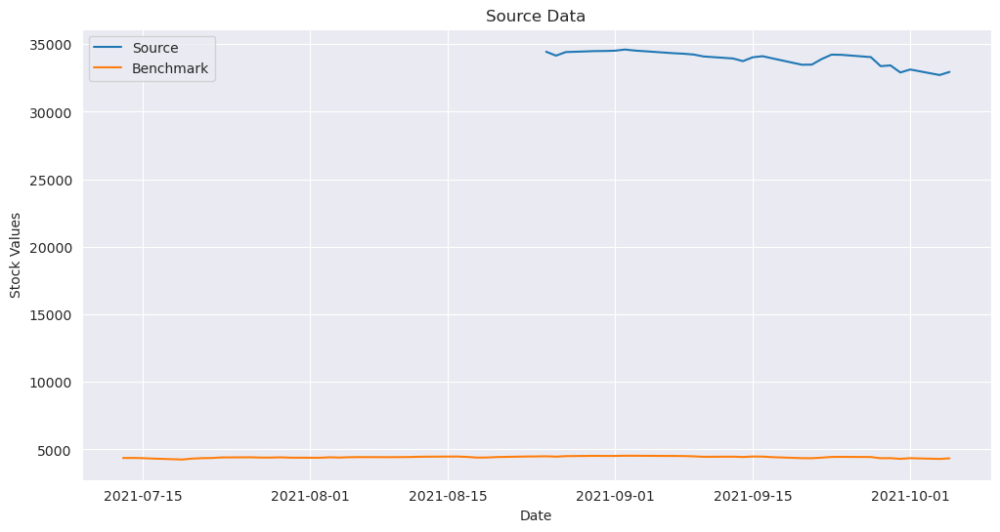

Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 1/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 2/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 3/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 4/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'



Time step 5/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 6/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 7/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 8/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 9/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'



Time step 10/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 11/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 12/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 13/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 14/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 15/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 16/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 17/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 18/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 19/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 20/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 21/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 22/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 23/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 24/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 25/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 26/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 27/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 28/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'
Riskfolio optimization error: Portfolio.optimization() got an unexpected keyword argument 'solver'


You must convert self.cov to a positive definite matrix

Time step 29/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101
You must convert self.cov to a positive definite matrix

Time step 30/30 - Weight Statistics:
  Min weight:     nan
  Max weight:     nan
  Average weight: nan
  Non-zero count: 0/101


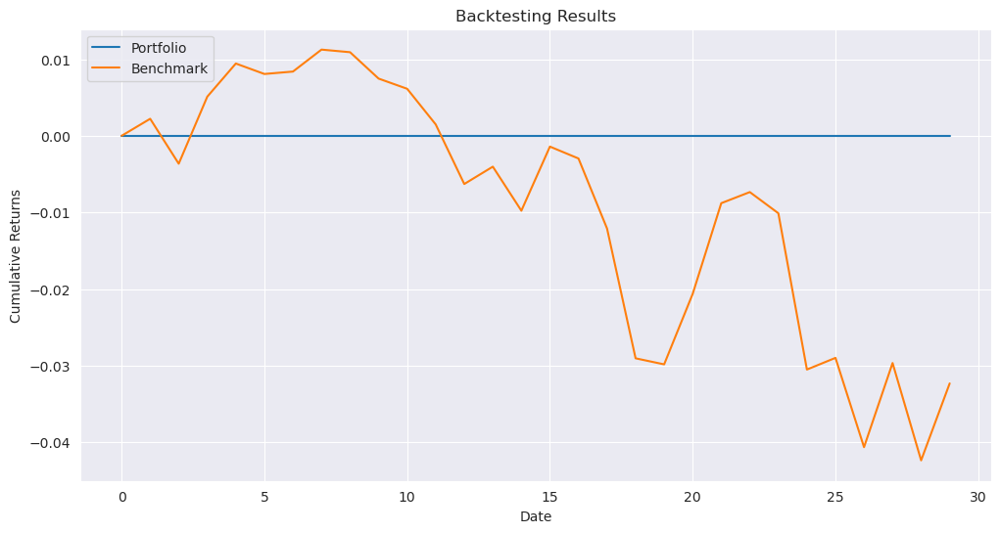

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_100_9_hrp.pkl


In [35]:
results_path_hrp_100 = '../../results/qubo_unrestricted/results_100_{}_hrp.pkl'
_ = run_experiment(results_path_hrp_100, data_100, benchmark, opt_fun_hrp, parameters)

#### Pair comparison for Medium test

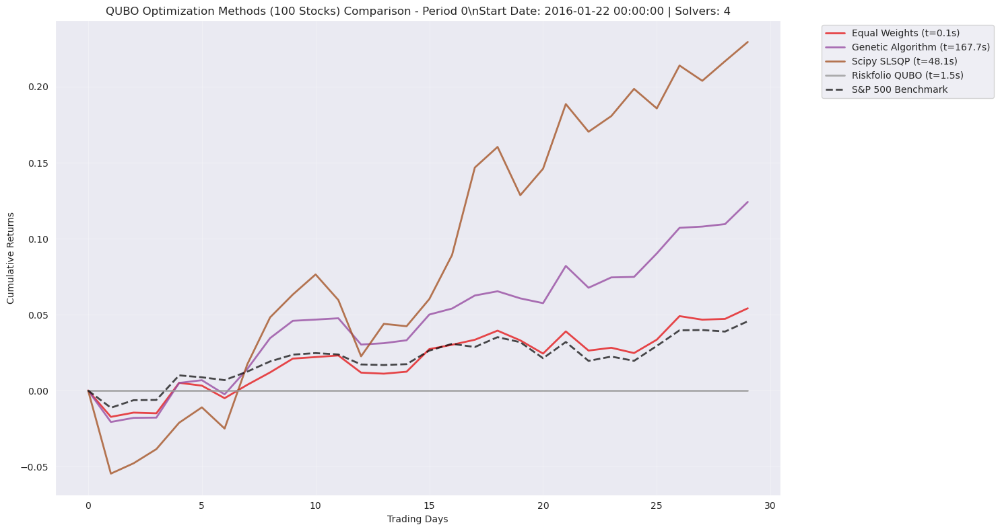

\nPeriod 0 Summary:
--------------------------------------------------
Equal Weights            :   0.0542 (  0.08s)
Genetic Algorithm        :   0.1242 (167.74s)
Scipy SLSQP              :   0.2294 ( 48.11s)
Riskfolio QUBO           :   0.0000 (  1.54s)
Benchmark                :   0.0456



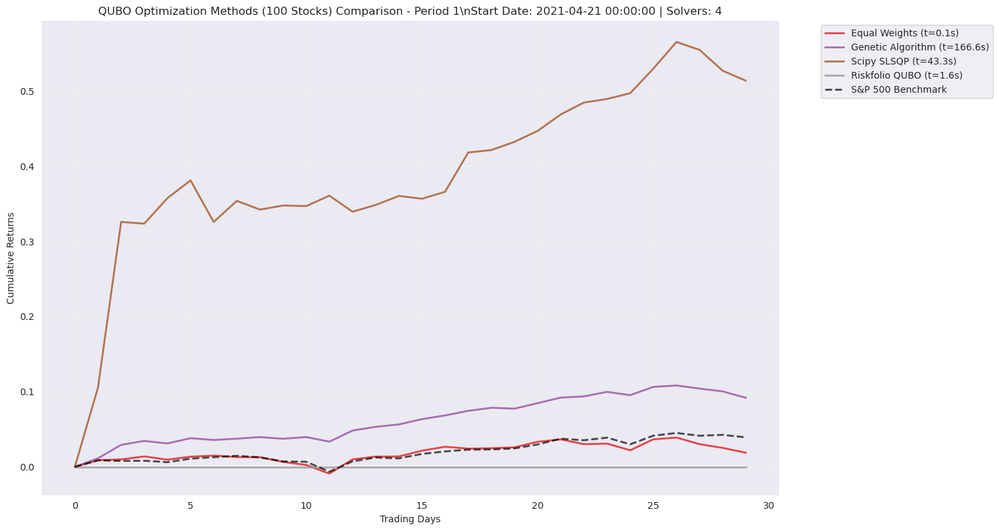

\nPeriod 1 Summary:
--------------------------------------------------
Equal Weights            :   0.0188 (  0.08s)
Genetic Algorithm        :   0.0919 (166.56s)
Scipy SLSQP              :   0.5138 ( 43.30s)
Riskfolio QUBO           :   0.0000 (  1.62s)
Benchmark                :   0.0392



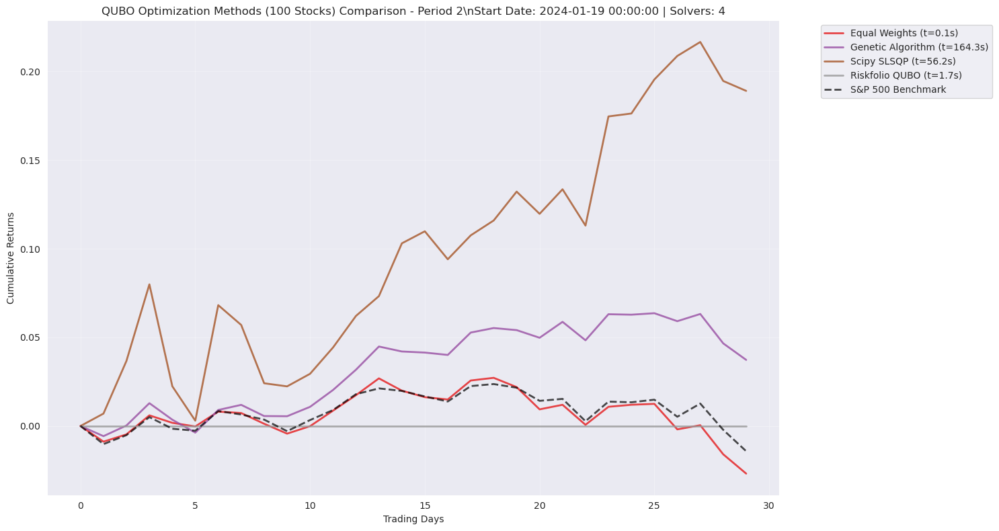

\nPeriod 2 Summary:
--------------------------------------------------
Equal Weights            :  -0.0269 (  0.08s)
Genetic Algorithm        :   0.0373 (164.33s)
Scipy SLSQP              :   0.1891 ( 56.16s)
Riskfolio QUBO           :   0.0000 (  1.72s)
Benchmark                :  -0.0142



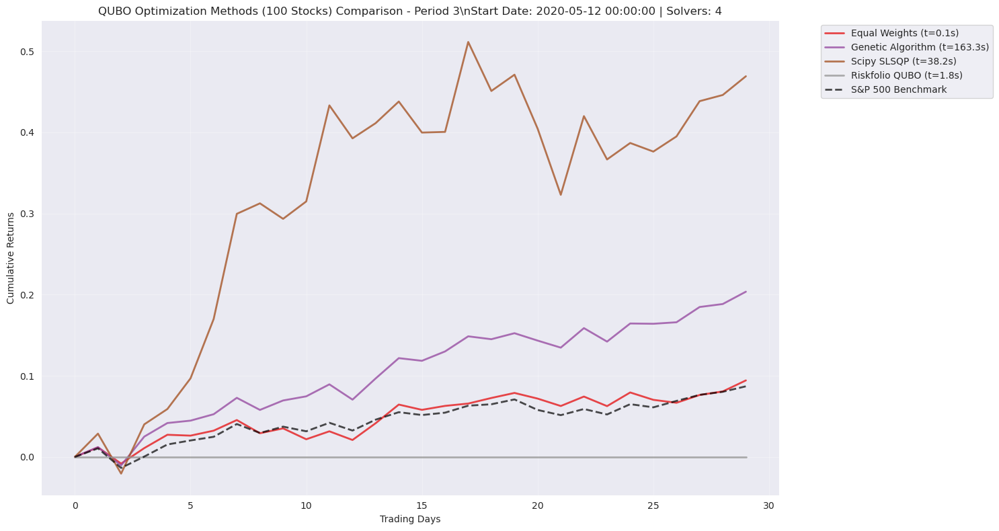

\nPeriod 3 Summary:
--------------------------------------------------
Equal Weights            :   0.0943 (  0.08s)
Genetic Algorithm        :   0.2036 (163.26s)
Scipy SLSQP              :   0.4691 ( 38.21s)
Riskfolio QUBO           :   0.0000 (  1.77s)
Benchmark                :   0.0870



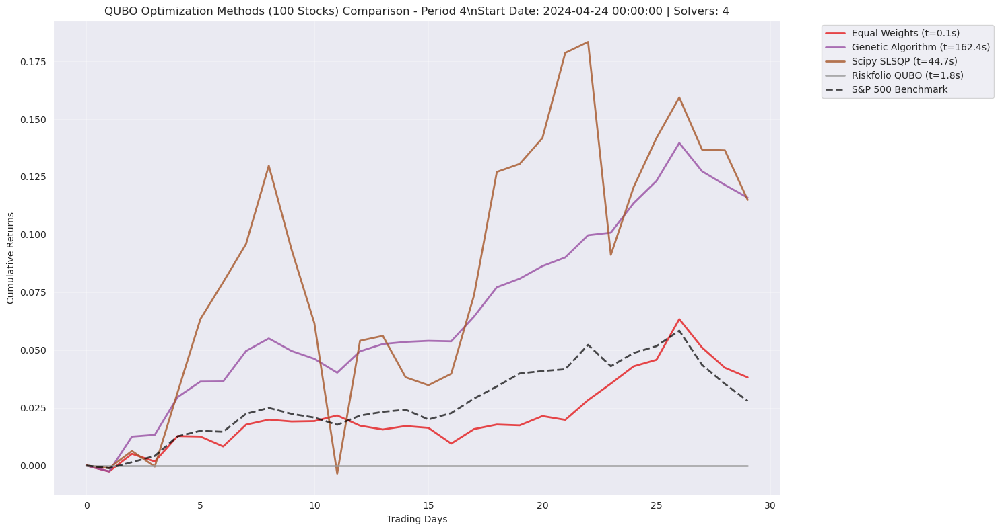

\nPeriod 4 Summary:
--------------------------------------------------
Equal Weights            :   0.0382 (  0.08s)
Genetic Algorithm        :   0.1160 (162.38s)
Scipy SLSQP              :   0.1150 ( 44.74s)
Riskfolio QUBO           :   0.0000 (  1.79s)
Benchmark                :   0.0279



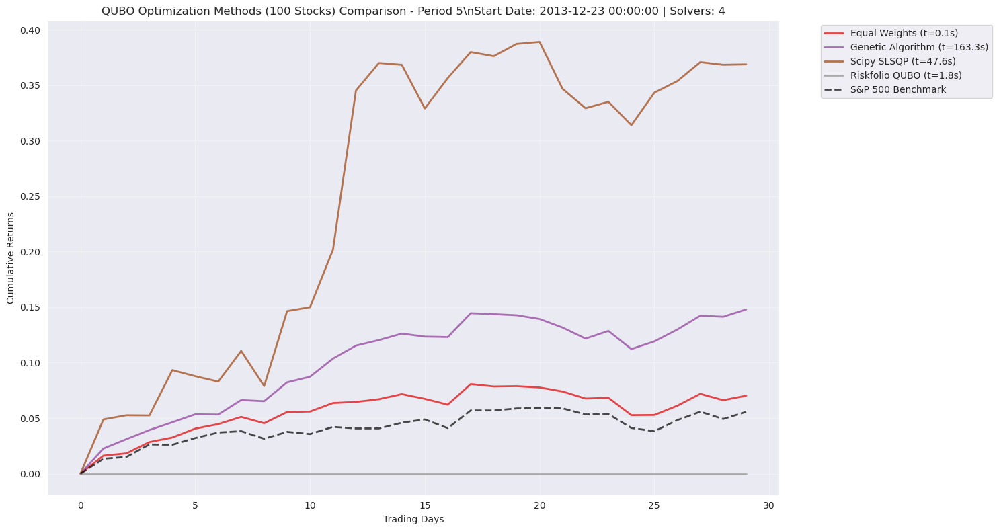

\nPeriod 5 Summary:
--------------------------------------------------
Equal Weights            :   0.0702 (  0.08s)
Genetic Algorithm        :   0.1480 (163.33s)
Scipy SLSQP              :   0.3688 ( 47.55s)
Riskfolio QUBO           :   0.0000 (  1.81s)
Benchmark                :   0.0556



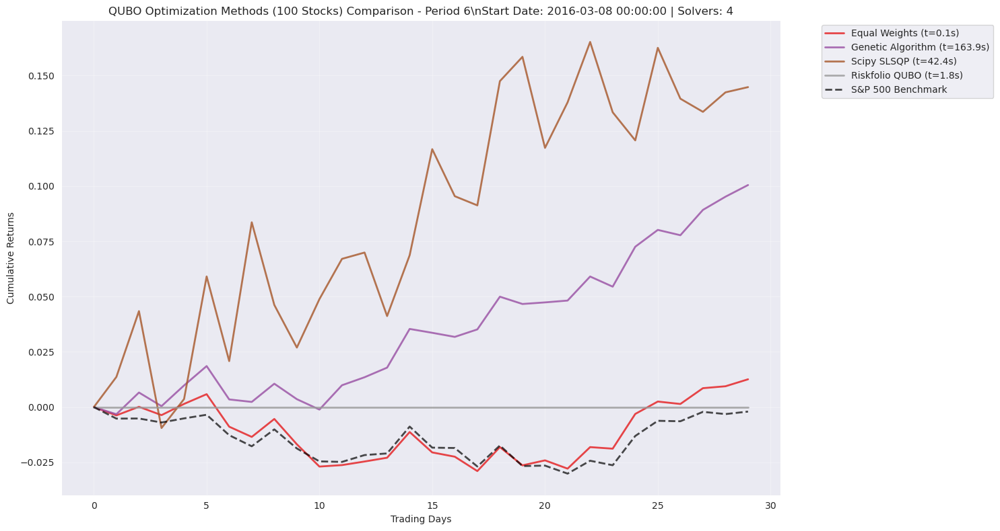

\nPeriod 6 Summary:
--------------------------------------------------
Equal Weights            :   0.0126 (  0.11s)
Genetic Algorithm        :   0.1005 (163.95s)
Scipy SLSQP              :   0.1448 ( 42.39s)
Riskfolio QUBO           :   0.0000 (  1.75s)
Benchmark                :  -0.0020



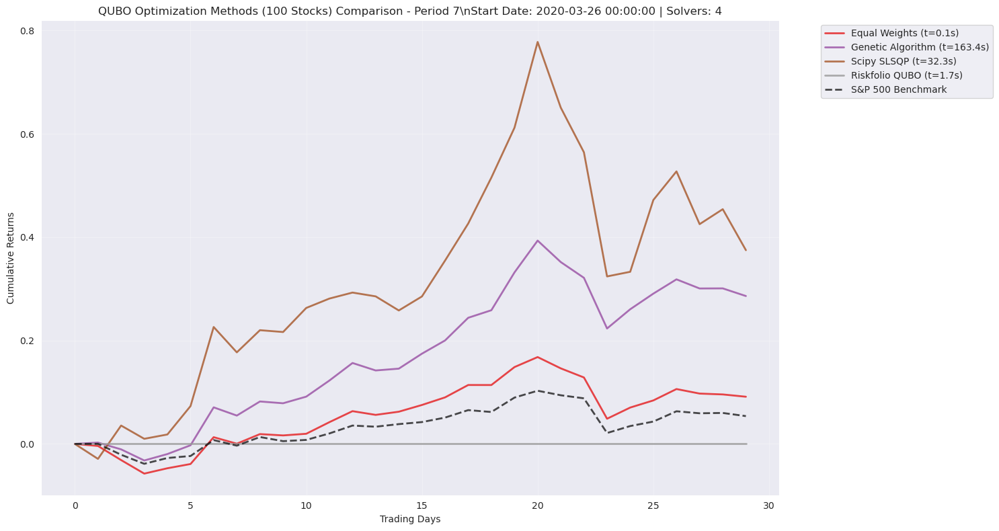

\nPeriod 7 Summary:
--------------------------------------------------
Equal Weights            :   0.0913 (  0.10s)
Genetic Algorithm        :   0.2862 (163.42s)
Scipy SLSQP              :   0.3749 ( 32.28s)
Riskfolio QUBO           :   0.0000 (  1.75s)
Benchmark                :   0.0538



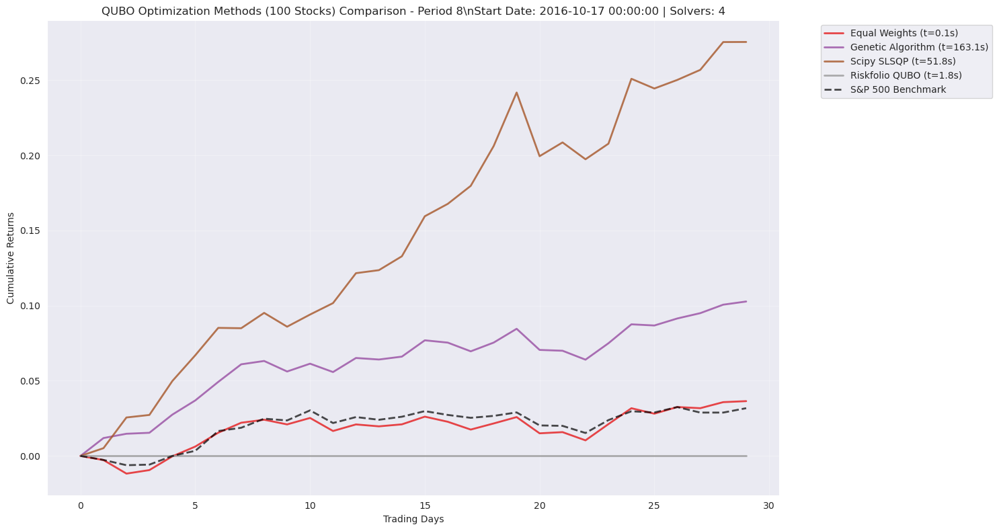

\nPeriod 8 Summary:
--------------------------------------------------
Equal Weights            :   0.0364 (  0.08s)
Genetic Algorithm        :   0.1027 (163.12s)
Scipy SLSQP              :   0.2754 ( 51.83s)
Riskfolio QUBO           :   0.0000 (  1.81s)
Benchmark                :   0.0317



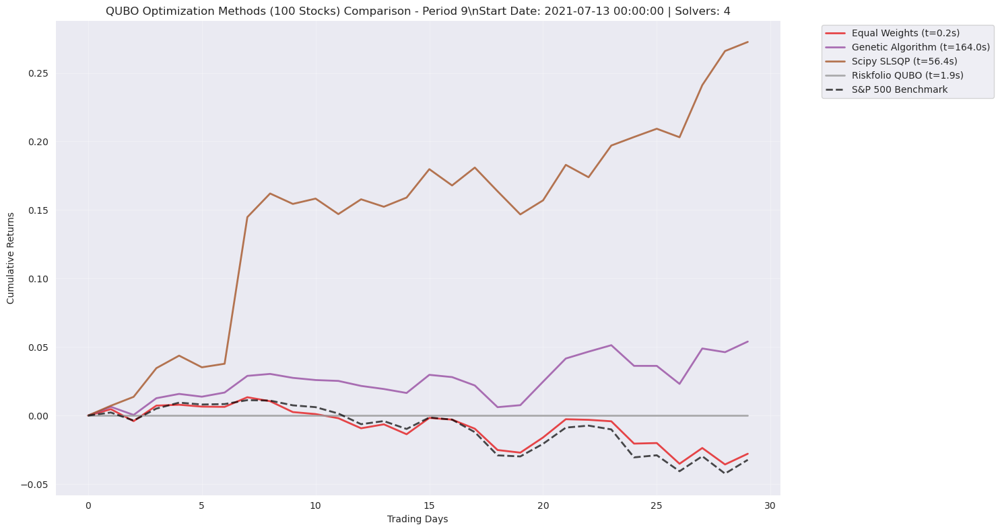

\nPeriod 9 Summary:
--------------------------------------------------
Equal Weights            :  -0.0279 (  0.21s)
Genetic Algorithm        :   0.0540 (163.99s)
Scipy SLSQP              :   0.2726 ( 56.38s)
Riskfolio QUBO           :   0.0000 (  1.94s)
Benchmark                :  -0.0323

\n================================================================================
PERFORMANCE SUMMARY - QUBO Methods (100 Stocks)


,Solver,Periods,Avg_Return,Std_Return,Min_Return,Max_Return,Avg_Time,Std_Time,Success_Rate
2,Scipy SLSQP,10,0.2953,0.127,0.1150,0.5138,46.0967,7.2289,100.0
1,Genetic Algorithm,10,0.1264,0.069,0.0373,0.2862,164.2073,1.5794,100.0
0,Equal Weights,10,0.0361,0.041,-0.0279,0.0943,0.0990,0.0385,100.0
3,Riskfolio QUBO,10,0.0000,0.000,0.0000,0.0000,1.7503,0.1038,100.0


\nPerformance Analysis:
--------------------------------------------------
Methods compared: 4
Best performer: Scipy SLSQP (avg return: 0.2953)
Fastest method: Equal Weights (0.10s)
Most reliable: Equal Weights (100.0%)


In [36]:
# Complete comparison including Quantum for Medium Test (100 stocks)
medium_test_solvers = [
    {'path_template': '../../results/qubo_unrestricted/results_100_{}_ew.pkl', 'name': 'Equal Weights'},
    {'path_template': '../../results/qubo_unrestricted/results_100_{}_ga.pkl', 'name': 'Genetic Algorithm'},
    {'path_template': '../../results/qubo_unrestricted/results_100_{}_bf.pkl', 'name': 'Scipy SLSQP'},
    {'path_template': '../../results/qubo_unrestricted/results_100_{}_hrp.pkl', 'name': 'Riskfolio QUBO'},
]

n_periods = parameters['n_periods']
multi_comparison(medium_test_solvers, n_periods, "QUBO Optimization Methods (100 Stocks)")

# Generate performance summary
print("\\n" + "="*80)
print("PERFORMANCE SUMMARY - QUBO Methods (100 Stocks)")
print("="*80)
summary_df = performance_summary(medium_test_solvers, n_periods)
if not summary_df.empty:
    # Sort by average return for better readability
    summary_df_sorted = summary_df.sort_values('Avg_Return', ascending=False)
    display(summary_df_sorted)
    
    # Performance analysis
    print("\\nPerformance Analysis:")
    print("-" * 50)
    print(f"Methods compared: {len(summary_df)}")
    print(f"Best performer: {summary_df_sorted.iloc[0]['Solver']} (avg return: {summary_df_sorted.iloc[0]['Avg_Return']:.4f})")
    print(f"Fastest method: {summary_df.loc[summary_df['Avg_Time'].idxmin(), 'Solver']} ({summary_df['Avg_Time'].min():.2f}s)")
    print(f"Most reliable: {summary_df.loc[summary_df['Success_Rate'].idxmax(), 'Solver']} ({summary_df['Success_Rate'].max():.1f}%)")
else:
    print("No summary data available")

### Full dataset

#### Equal Weights Baseline

initial date: 2016-03-08 00:00:00


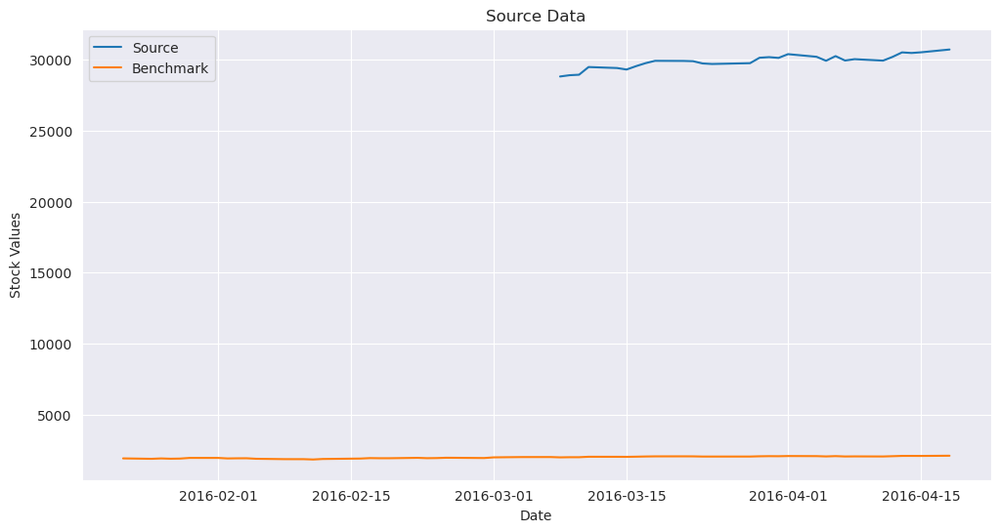


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

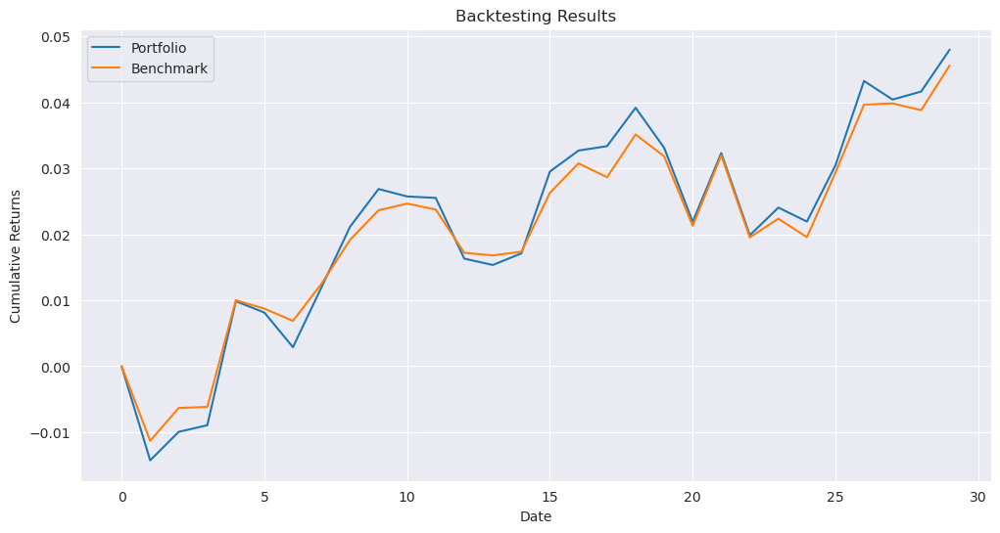

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_0_ew.pkl
initial date: 2021-06-04 00:00:00


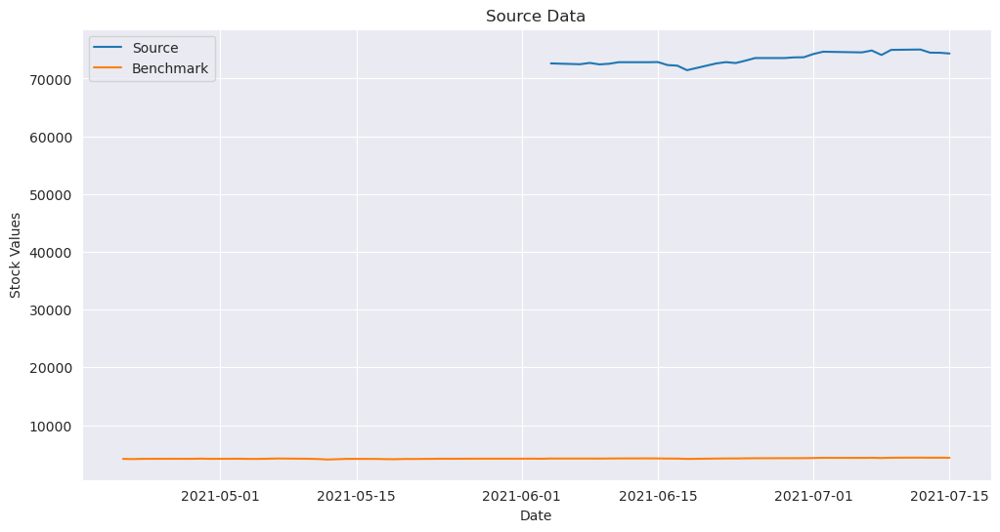


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

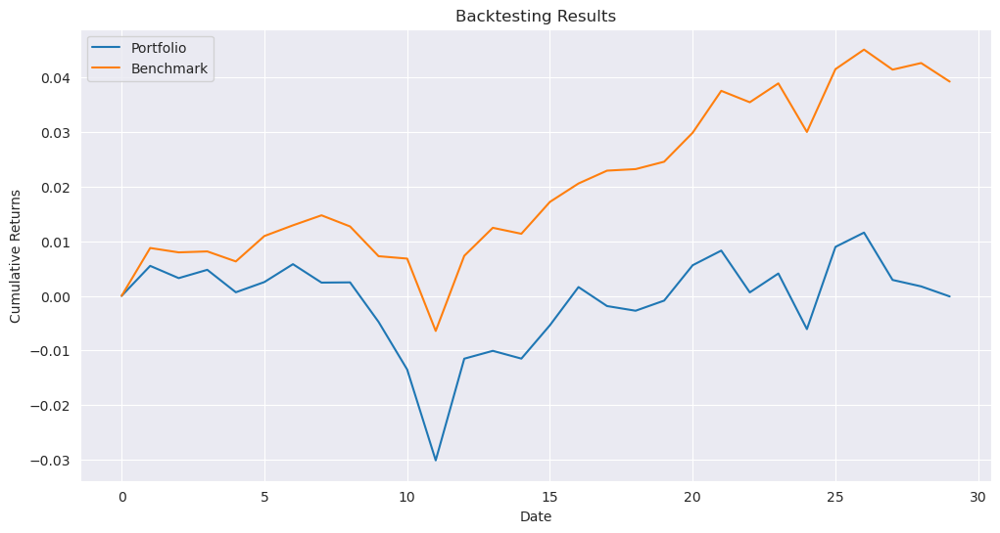

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_1_ew.pkl
initial date: 2024-03-05 00:00:00


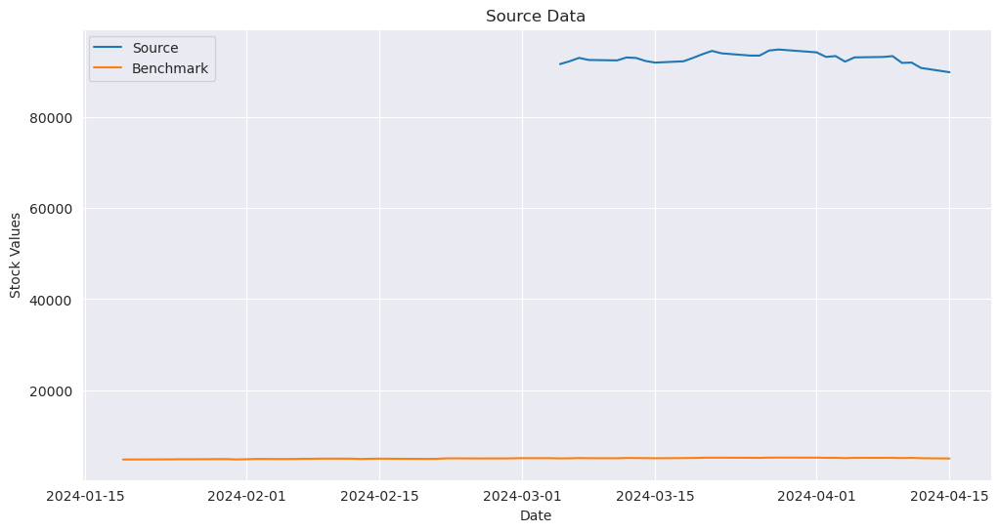


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

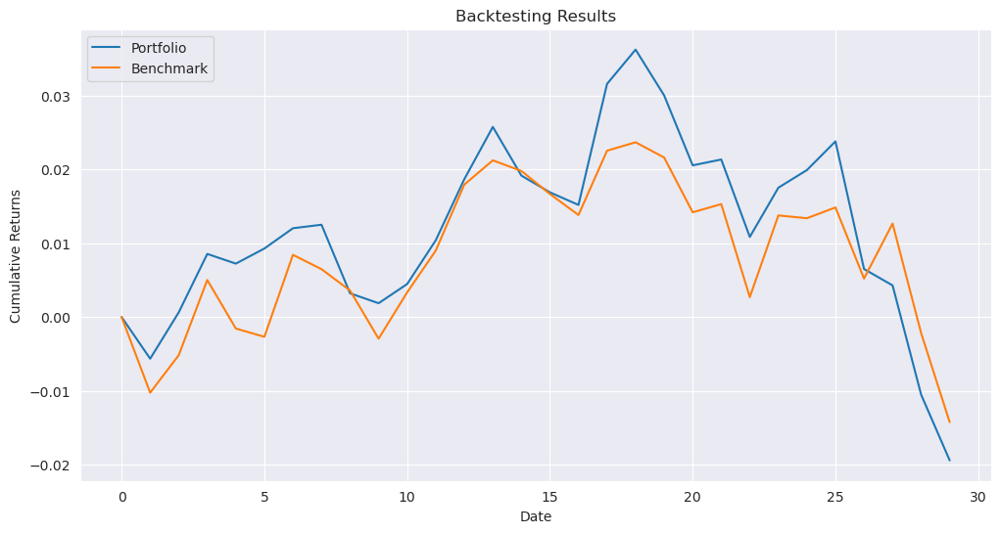

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_2_ew.pkl
initial date: 2020-06-25 00:00:00


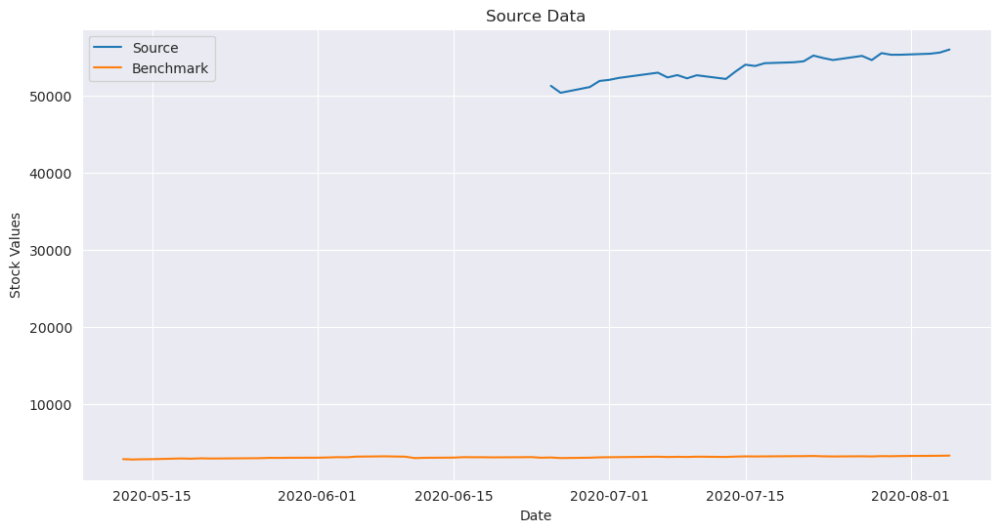


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

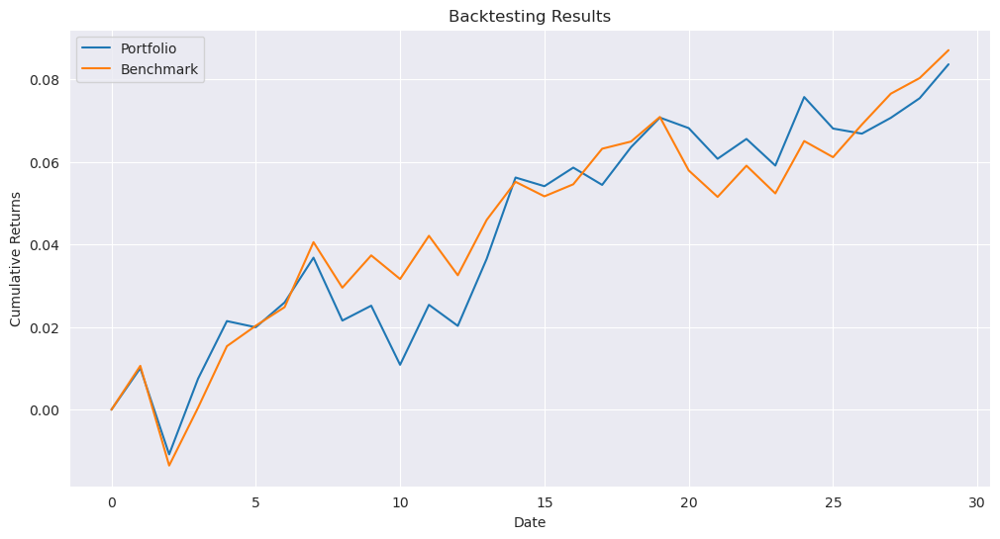

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_3_ew.pkl
initial date: 2024-06-07 00:00:00


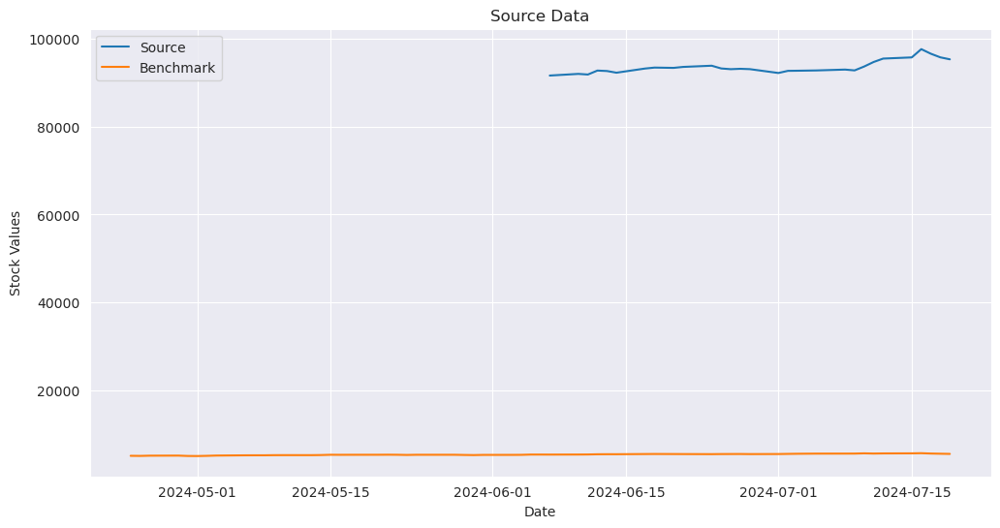


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

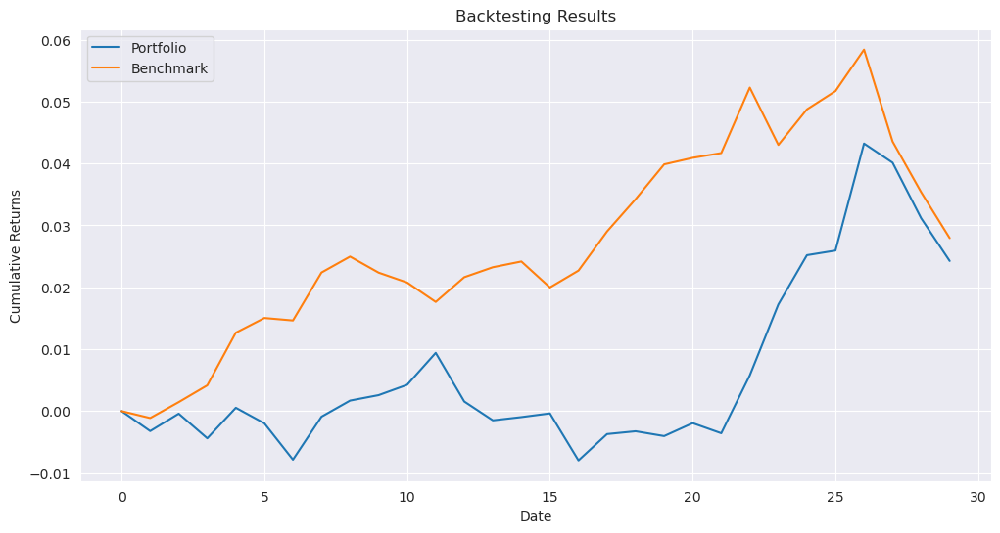

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_4_ew.pkl
initial date: 2014-02-07 00:00:00


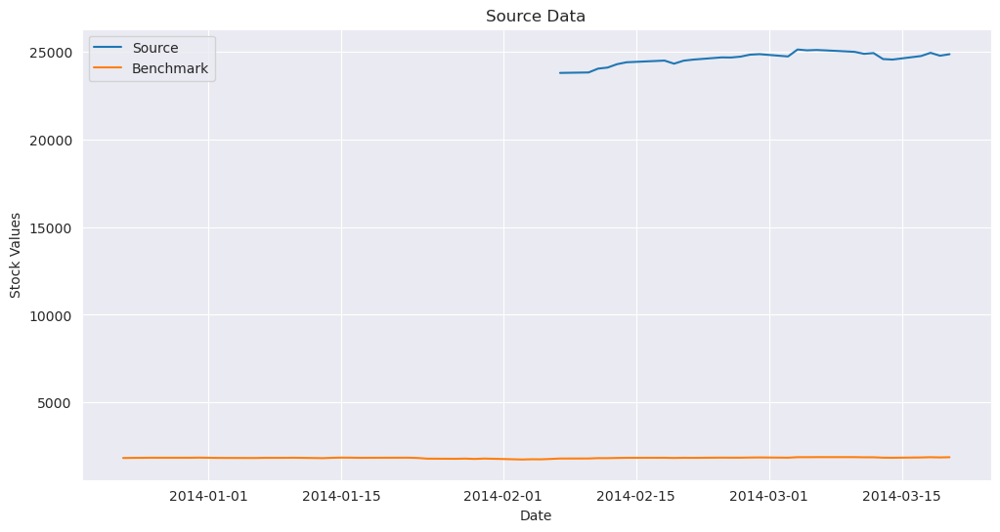


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

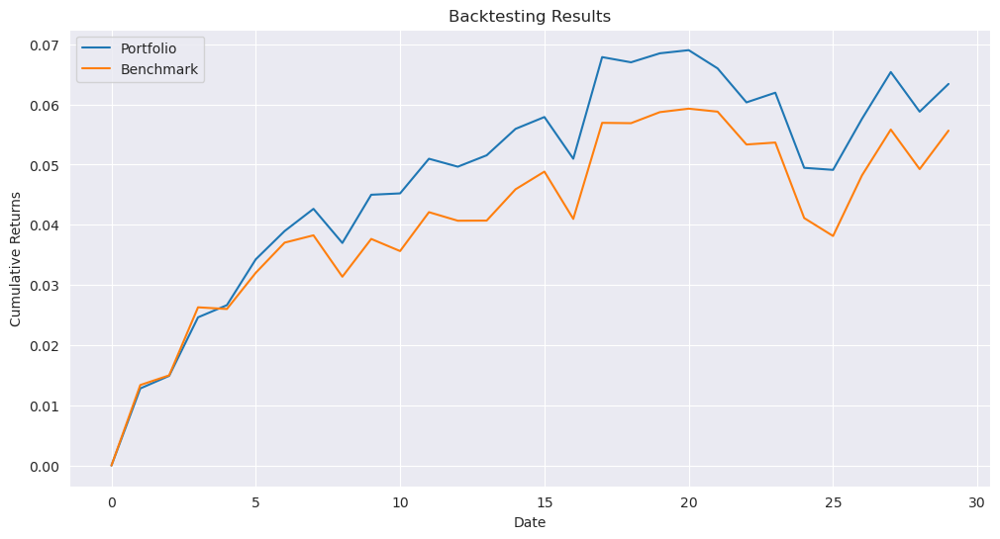

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_5_ew.pkl
initial date: 2016-04-21 00:00:00


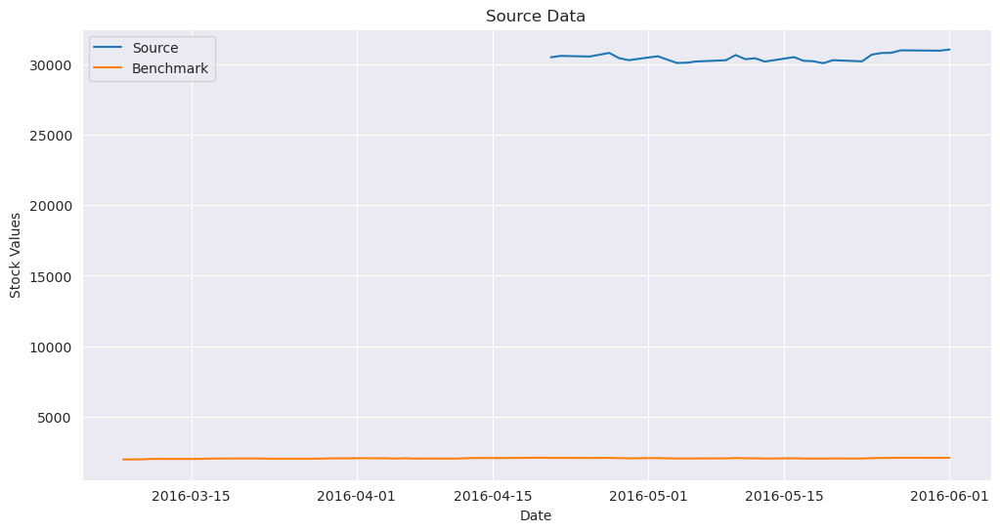


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

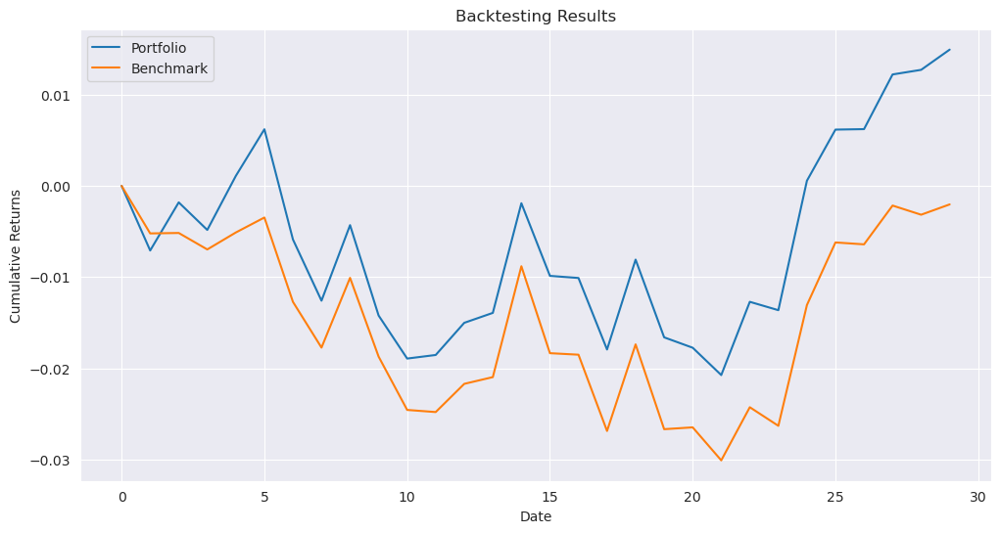

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_6_ew.pkl
initial date: 2020-05-11 00:00:00


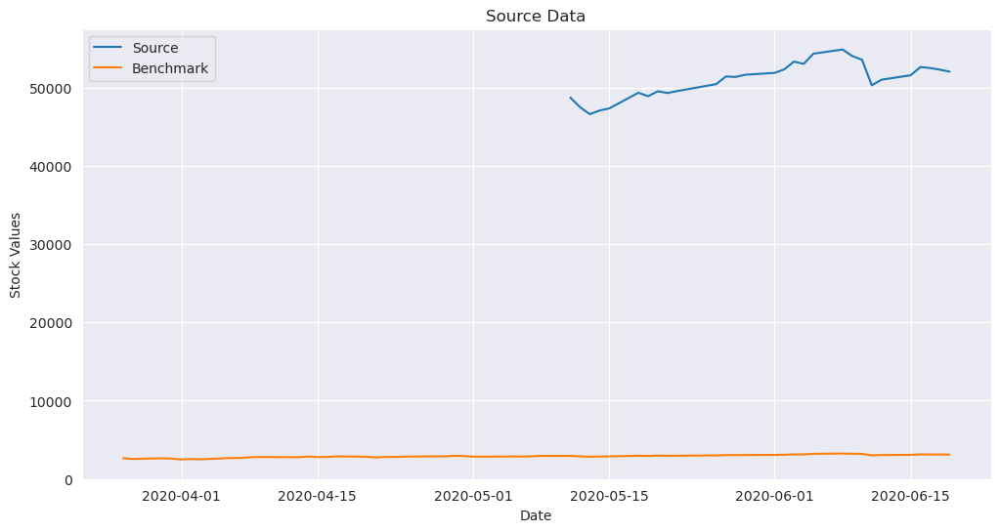


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

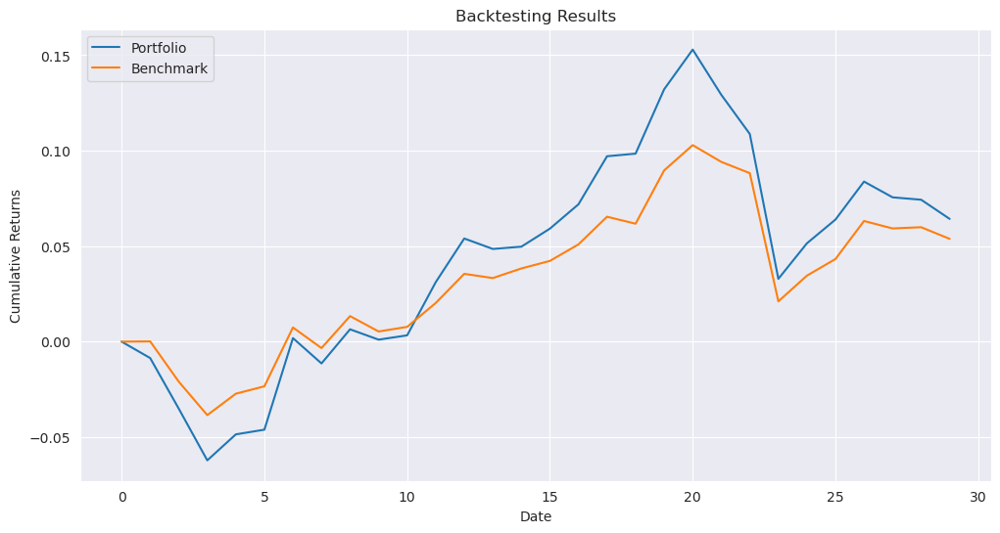

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_7_ew.pkl
initial date: 2016-11-30 00:00:00


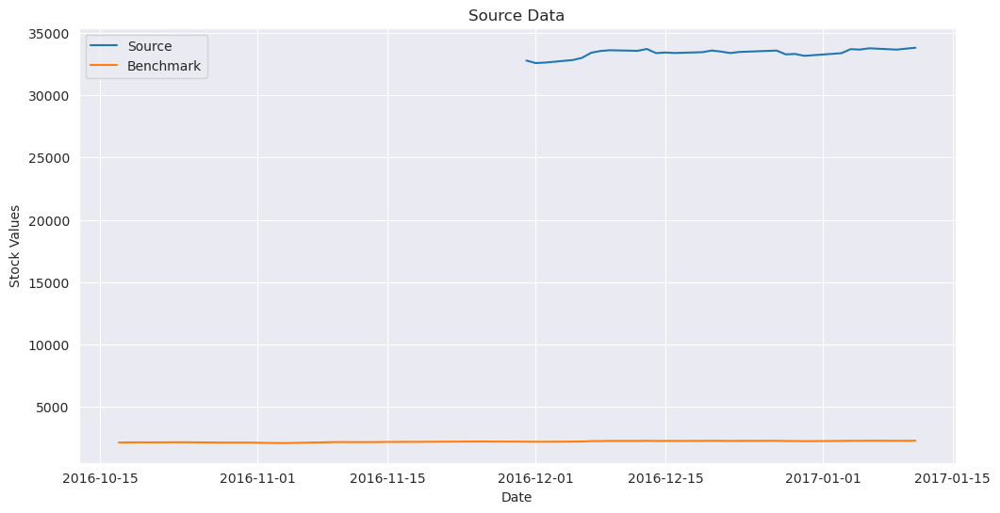


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

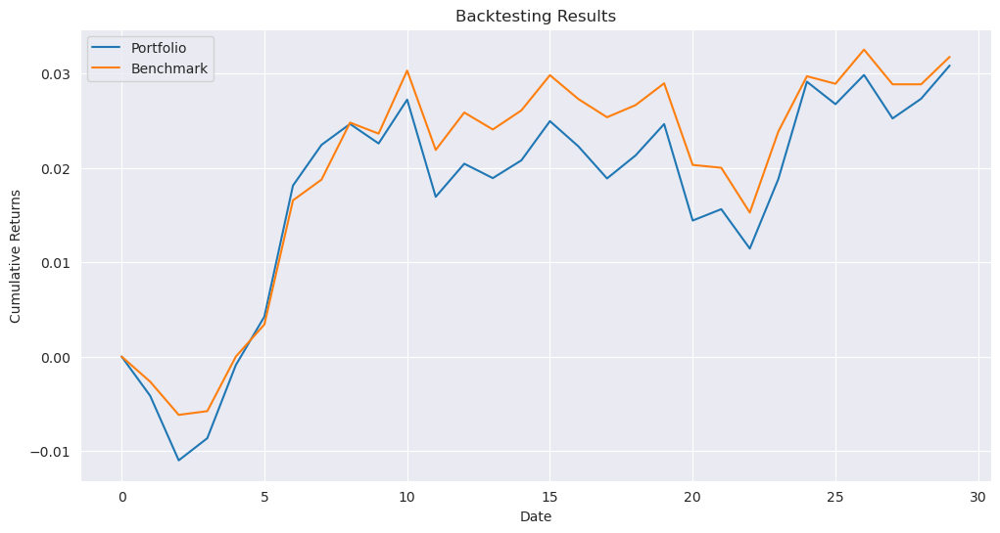

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_8_ew.pkl
initial date: 2021-08-25 00:00:00


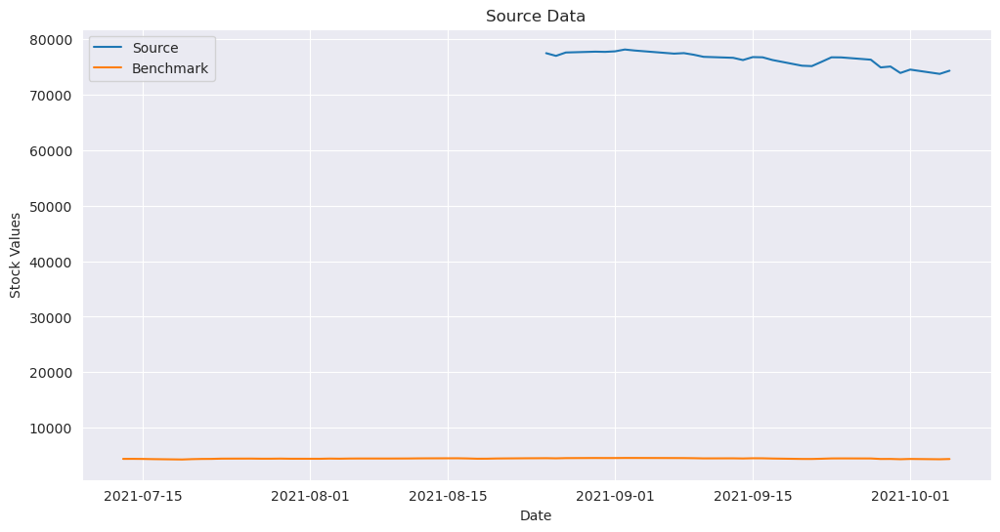


Time step 1/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.002278
  Max weight:     0.002278
  Average weight: 0.002278
  Non-zero count: 

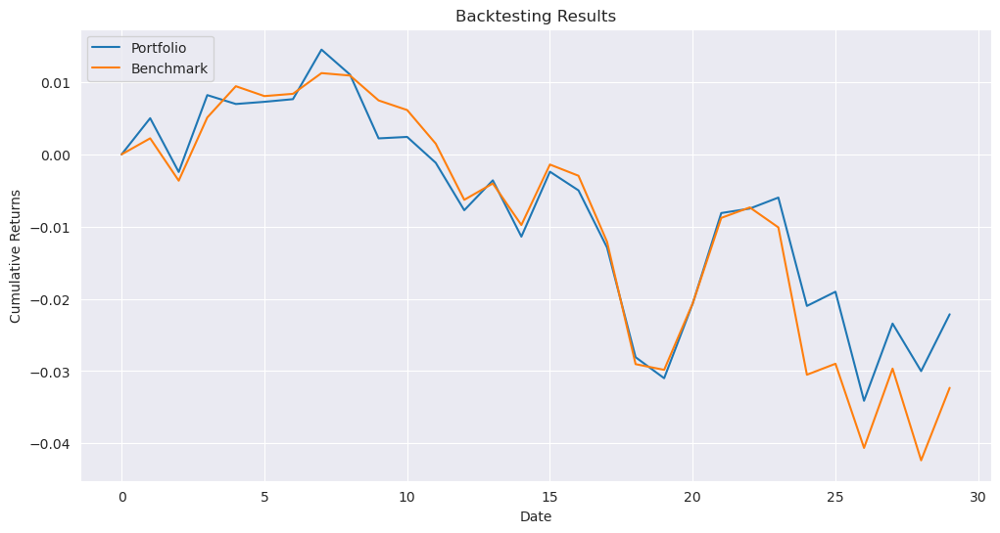

Dictionary pickled and saved to ../../results/qubo_unrestricted/results_full_9_ew.pkl


In [37]:
results_path_ew_full = '../../results/qubo_unrestricted/results_full_{}_ew.pkl'
_ = run_experiment(results_path_ew_full, source, benchmark, opt_fun_ew, parameters)

initial date: 2016-03-08 00:00:00


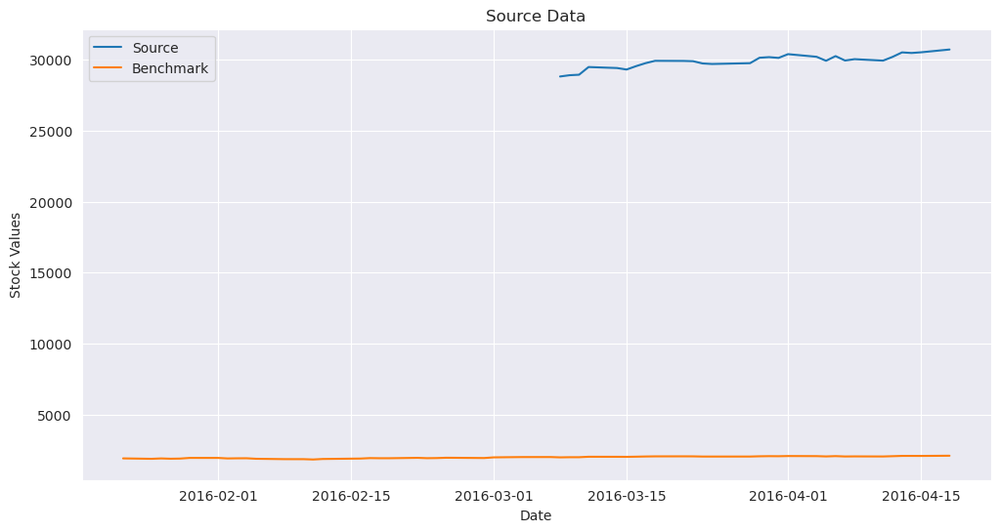


Time step 1/30 - Weight Statistics:
  Min weight:     0.000000
  Max weight:     0.010049
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 2/30 - Weight Statistics:
  Min weight:     0.000001
  Max weight:     0.010509
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 3/30 - Weight Statistics:
  Min weight:     0.000004
  Max weight:     0.011392
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 4/30 - Weight Statistics:
  Min weight:     0.000004
  Max weight:     0.010592
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 5/30 - Weight Statistics:
  Min weight:     0.000000
  Max weight:     0.007198
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 6/30 - Weight Statistics:
  Min weight:     0.000005
  Max weight:     0.014281
  Average weight: 0.002278
  Non-zero count: 439/439

Time step 7/30 - Weight Statistics:
  Min weight:     0.000021
  Max weight:     0.012821
  Average weight: 0.002278
  Non-zero count: 

KeyboardInterrupt: 

In [38]:
results_path_ga_full = '../../results/qubo_unrestricted/results_full_{}_ga.pkl'
_ = run_experiment(results_path_ga_full, source, benchmark, opt_fun_ga, parameters)

### BF

In [ ]:
results_path_bf_full = '../../results/qubo_unrestricted/results_full_{}_bf.pkl'
_ = run_experiment(results_path_bf_full, source, benchmark, opt_fun_bf, parameters)

#### HRP

In [ ]:
results_path_hrp_full = '../../results/qubo_unrestricted/results_full_{}_hrp.pkl'
_ = run_experiment(results_path_hrp_full, source, benchmark, opt_fun_hrp, parameters)

### Comparison for full dataset

In [ ]:
# Comprehensive comparison of ALL optimization methods for Full Dataset including Quantum
full_dataset_solvers = [
    {'path_template': '../../results/qubo_unrestricted/results_full_{}_ew.pkl', 'name': 'Equal Weights'},
    {'path_template': '../../results/qubo_unrestricted/results_full_{}_ga.pkl', 'name': 'Genetic Algorithm'},
    {'path_template': '../../results/qubo_unrestricted/results_full_{}_bf.pkl', 'name': 'Scipy SLSQP'},
    {'path_template': '../../results/qubo_unrestricted/results_full_{}_hrp.pkl', 'name': 'Riskfolio QUBO'},
]

n_periods = parameters['n_periods']
multi_comparison(full_dataset_solvers, n_periods, "QUBO Optimization Methods (Full Dataset)")

# Generate comprehensive performance summary
print("\\n" + "="*100)
print("COMPREHENSIVE PERFORMANCE SUMMARY - QUBO Methods (Full Dataset)")
print("="*100)
summary_df = performance_summary(full_dataset_solvers, n_periods)
if not summary_df.empty:
    # Sort by average return for better readability
    summary_df_sorted = summary_df.sort_values('Avg_Return', ascending=False)
    display(summary_df_sorted)
    
    # Performance analysis
    print("\\nPerformance Analysis:")
    print("-" * 50)
    print(f"Methods compared: {len(summary_df)}")
    print(f"Best performer: {summary_df_sorted.iloc[0]['Solver']} (avg return: {summary_df_sorted.iloc[0]['Avg_Return']:.4f})")
    print(f"Fastest method: {summary_df.loc[summary_df['Avg_Time'].idxmin(), 'Solver']} ({summary_df['Avg_Time'].min():.2f}s)")
    print(f"Most reliable: {summary_df.loc[summary_df['Success_Rate'].idxmax(), 'Solver']} ({summary_df['Success_Rate'].max():.1f}%)")
else:
    print("No summary data available")

## Wide dataset

In [ ]:
source_path_extended = '../../data/etfs_close.pkl'

In [ ]:
source_extended = pd.read_pickle(source_path_extended)
source_extended.head()

In [ ]:
source_wide = pd.merge(source, source_extended, on='ds', how='left').set_index('ds').dropna()
print(source_wide.shape)
# Check if any row contains at least one NaN
#print(source_wide.isnull().any(axis=1))
# Check if any value in the DataFrame is null
has_any_nan = source_wide.isnull().values.any()
print("Any NaN in source_wide:", has_any_nan)
source_wide.head()

In [ ]:
df = source_wide.copy()
days_to_avg = parameters['days_to_avg']
display(df.head())
print(f'initial date: {df.iloc[days_to_avg+1, :].index}')

In [ ]:
df.sum(axis=1).plot()

#### Equal Weights Baseline

In [ ]:
results_path_ew_wide = '../../results/qubo_unrestricted/results_wide_{}_ew.pkl'
_ = run_experiment(results_path_ew_wide, df, benchmark, opt_fun_ew, parameters)

### GA

In [ ]:
results_path_ga_wide = '../../results/qubo_unrestricted/results_wide_{}_ga.pkl'
_ = run_experiment(results_path_ga_wide, df, benchmark, opt_fun_ga, parameters)

### BF

In [ ]:
opt_fun_bf = partial(scipy_slsqp_qubo)
results_path_bf = '../../results/qubo_unrestricted/results_wide_{}_bf.pkl'
_ = run_experiment(results_path_bf, df, benchmark, opt_fun_bf, parameters)

### HRP

In [ ]:
opt_fun_hrp = partial(riskfolio_qubo)
results_path = '../../results/qubo_unrestricted/results_wide_{}_hrp.pkl'
_ = run_experiment(results_path, df, benchmark, opt_fun_hrp, parameters)

### Method comparison 

In [ ]:
# Comprehensive comparison of ALL optimization methods for Wide Dataset including Quantum
wide_dataset_solvers = [
    {'path_template': '../../results/qubo_unrestricted/results_wide_{}_ew.pkl', 'name': 'Equal Weights'},
    {'path_template': '../../results/qubo_unrestricted/results_wide_{}_ga.pkl', 'name': 'Genetic Algorithm'},
    {'path_template': '../../results/qubo_unrestricted/results_wide_{}_bf.pkl', 'name': 'Scipy SLSQP'},
    {'path_template': '../../results/qubo_unrestricted/results_wide_{}_hrp.pkl', 'name': 'Riskfolio QUBO'},
]

n_periods = parameters['n_periods']
multi_comparison(wide_dataset_solvers, n_periods, "QUBO Optimization Methods (Wide Dataset - Stocks + ETFs)")

# Generate comprehensive performance summary
print("\\n" + "="*100)
print("COMPREHENSIVE PERFORMANCE SUMMARY - QUBO Methods (Wide Dataset - Stocks + ETFs)")
print("="*100)
summary_df = performance_summary(wide_dataset_solvers, n_periods)
if not summary_df.empty:
    # Sort by average return for better readability
    summary_df_sorted = summary_df.sort_values('Avg_Return', ascending=False)
    display(summary_df_sorted)
    
    # Performance analysis
    print("\\nPerformance Analysis:")
    print("-" * 50)
    print(f"Methods compared: {len(summary_df)}")
    print(f"Best performer: {summary_df_sorted.iloc[0]['Solver']} (avg return: {summary_df_sorted.iloc[0]['Avg_Return']:.4f})")
    print(f"Fastest method: {summary_df.loc[summary_df['Avg_Time'].idxmin(), 'Solver']} ({summary_df['Avg_Time'].min():.2f}s)")
    print(f"Most reliable: {summary_df.loc[summary_df['Success_Rate'].idxmax(), 'Solver']} ({summary_df['Success_Rate'].max():.1f}%)")
else:
    print("No summary data available")

## Synthetic Dataset

In [ ]:
source_synth_path = "../../data/synthetic_close.pkl"

In [ ]:
source_synth = pd.read_pickle(source_synth_path)
source_synth.head()

In [ ]:
print(source_synth.shape)
# Check if any row contains at least one NaN
#print(source_wide.isnull().any(axis=1))
# Check if any value in the DataFrame is null
has_any_nan = source_synth.isnull().values.any()
print("Any NaN in source_synth:", has_any_nan)
source_synth.head()

In [ ]:
df_synth = source_synth
df_synth.set_index('ds', inplace=True)
days_to_avg = parameters['days_to_avg']
display(df_synth.head())
has_any_nan = source_synth.isnull().values.any()
print("Any NaN in source_synth:", has_any_nan)
print(f'initial date: {df_synth.iloc[days_to_avg+1, :].index}')

In [ ]:
df_synth.sum(axis=1).plot()

Resetting parameters. The total cost of 10k stocks is more than 1E6 which prevents the portfolio from covering all stocks if the budget is 1E6 and the weights are integers. 

In [ ]:
parameters = {
    "population_size": 100,
    "num_generations": 100,
    "mutation_rate": 0.1,
    "elitism": 0.1,
    "n_periods": 10,
    "days_to_avg": 30,
    "days_to_opt": 30,
    "budget": 10_000_000,
}

### Equal Weights Baseline

In [ ]:
data_gen = generate_data(df_synth, benchmark, days_to_avg=30, days_to_opt=30, seed=SEED)
df, df_b = next(data_gen)
df.tail()

In [ ]:
results_path_ew_synth = '../../results/qubo_unrestricted/results_synth_{}_ew.pkl'
_ = run_experiment(results_path_ew_synth, df_synth, benchmark, opt_fun_ew, parameters)

### GA Synth

In [ ]:
results_path_ga_synth = '../../results/qubo_unrestricted/results_synth_{}_ga.pkl'
_ = run_experiment(results_path_ga_synth, df_synth, benchmark, opt_fun_ga, parameters)